# Bayesian Neural Networks Classifier

In [1]:
""" Base code created on February 16, 2023 // @author: Sarah Shi """
""" Edited for alkanes work starting October 25th, 2023 // @editor: Ruth Tweedy """

' Edited for alkanes work starting October 25th, 2023 // @editor: Ruth Tweedy '

In [ ]:
import numpy as np
import pandas as pd
import math 

import os
import copy
import time
import random

from sklearn.metrics import classification_report 
from imblearn.over_sampling import RandomOverSampler

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

from matplotlib import pyplot as plt
from matplotlib import colors
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['pdf.fonttype'] = 42


In [3]:
# Parameters
input_file = "test_train_df.csv"
output_file = "test 2.csv"
alkanes = ['C25', 'C27', 'C29', 'C31', 'C33', 'C35']
run_description = "Full dataset, 180 validation"
is_run_interactive = True

## Defining Functions

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [5]:
def save_model(model, optimizer, path):
    check_point = {'params': model.state_dict(),                            
                   'optimizer': optimizer.state_dict()}
    torch.save(check_point, path)

In [6]:
def save_model_nn(model, optimizer, path, best_model_state):
    check_point = {'params': best_model_state,                            
                   'optimizer': optimizer.state_dict()}
    torch.save(check_point, path)

In [7]:
def load_model(model, optimizer=None, path=''):
    check_point = torch.load(path)
    model.load_state_dict(check_point['params'])
    if optimizer is not None:
        optimizer.load_state_dict(check_point['optimizer'])

In [8]:
def getLatent(model, dataset:np):
    #transform real data to latent space using the trained model
    latents=[]
    model.to(device)

    dataset_ = FeatureDataset(dataset)
    loader = DataLoader(dataset_,batch_size=batch_size,shuffle=False)
    
    model.eval()
    with torch.no_grad():
        for i, data in enumerate(loader):
            x = data.to(device)
            z = model.encoded(x)
            latents.append(z.detach().cpu().numpy())
    
    return np.concatenate(latents, axis=0)

In [9]:
def same_seeds(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
    np.random.seed(seed)  # Numpy module.
    random.seed(seed)  # Python random module.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

In [10]:
SEED = 1
same_seeds(SEED)

In [11]:
def predict_with_uncertainty(model, input_data, n_iterations=100):
    model.eval()
    output_list = []
    for i in range(n_iterations):
        with torch.no_grad():
            output = model(input_data)
            output_list.append(torch.nn.functional.softmax(output, dim=1).detach().cpu().numpy())

    output_list = np.array(output_list)
    
    # Calculate mean and standard deviation
    prediction_mean = output_list.mean(axis=0)
    prediction_stddev = output_list.std(axis=0)
    return prediction_mean, prediction_stddev

In [12]:
def balance(train_data_x, train_data_y):

    oversample = RandomOverSampler(sampling_strategy='minority', random_state=42)

    # Resample the dataset
    x_balanced, y_balanced = oversample.fit_resample(train_data_x, train_data_y)

    df_resampled = pd.DataFrame(x_balanced)
    df_resampled['Mineral'] = y_balanced

    df_balanced = pd.DataFrame()
    for class_label in df_resampled['Mineral'].unique():
        df_class = df_resampled[df_resampled['Mineral'] == class_label]
        df_balanced = pd.concat([df_balanced, df_class.sample(n=1000, replace = True, random_state=42)])

    # Reset the index of the balanced dataframe
    df_balanced = df_balanced.reset_index(drop=True)
    train_data_x = df_balanced.iloc[:, :-1].to_numpy()
    train_data_y = df_balanced.iloc[:, -1].to_numpy()

    return train_data_x, train_data_y

In [13]:
class LabelDataset(Dataset):
    def __init__(self, x, labels):
        if len(x.shape)==2:
            self.x = torch.from_numpy(x).type(torch.FloatTensor)
            self.labels = torch.from_numpy(labels.copy()).type(torch.LongTensor)
            #self.labels = torch.from_numpy(labels).type(torch.LongTensor)
        else:
            self.x = x.reshape(-1, x.shape[-1]) #dataset keeps the right shape for training
            self.labels = labels

    def __len__(self):
        return len(self.x) 
    
    def __getitem__(self, n): 
        return self.x[n], self.labels[n]

In [14]:
class VariationalLayer(nn.Module):

    def __init__(self, in_features, out_features):

        super(VariationalLayer, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        
        self.weight_mu = nn.Parameter(torch.Tensor(out_features, in_features))
        self.weight_rho = nn.Parameter(torch.Tensor(out_features, in_features))
        self.bias_mu = nn.Parameter(torch.Tensor(out_features))
        self.bias_rho = nn.Parameter(torch.Tensor(out_features))
        
        self.softplus = nn.Softplus()
        self.reset_parameters()
        
    def reset_parameters(self):

        stdv = 1. / math.sqrt(self.weight_mu.size(1))
        self.weight_mu.data.uniform_(-stdv, stdv)
        self.weight_rho.data.uniform_(-stdv, stdv)
        self.bias_mu.data.uniform_(-stdv, stdv)
        self.bias_rho.data.uniform_(-stdv, stdv)
        
    def forward(self, input):

        weight_sigma = torch.log1p(torch.exp(self.weight_rho))
        bias_sigma = torch.log1p(torch.exp(self.bias_rho))
        
        weight_epsilon = torch.normal(mean=0., std=1., size=weight_sigma.size(), device=input.device)
        bias_epsilon = torch.normal(mean=0., std=1., size=bias_sigma.size(), device=input.device)
        
        weight_sample = self.weight_mu + weight_epsilon * weight_sigma
        bias_sample = self.bias_mu + bias_epsilon * bias_sigma
        
        output = F.linear(input, weight_sample, bias_sample)
        return output

    def kl_divergence(self):

        weight_sigma = torch.log1p(torch.exp(self.weight_rho))
        bias_sigma = torch.log1p(torch.exp(self.bias_rho))
        
        kl_div = -0.5 * torch.sum(1 + torch.log(weight_sigma.pow(2)) - self.weight_mu.pow(2) - weight_sigma.pow(2))
        kl_div += -0.5 * torch.sum(1 + torch.log(bias_sigma.pow(2)) - self.bias_mu.pow(2) - bias_sigma.pow(2))

        return kl_div

In [15]:
class MultiClassClassifier(nn.Module):
    def __init__(self, input_dim=6, classes=2, dropout_rate=0.1, hidden_layer_sizes=None):
        super(MultiClassClassifier, self).__init__()
        self.input_dim = input_dim
        self.classes = classes
        self.dropout_rate = dropout_rate

        # If hidden_layer_sizes is None or empty, initialize it as an empty list
        self.hls = hidden_layer_sizes or []

        def element(in_channel, out_channel, is_last=False):
            if not is_last:
                layers = [
                    nn.Linear(in_channel, out_channel),
                    nn.BatchNorm1d(out_channel),  # Add batch normalization
                    nn.LeakyReLU(0.02),
                    nn.Dropout(self.dropout_rate),  # Add dropout
                ]
            else:
                layers = [VariationalLayer(in_channel, out_channel)]
            return layers

        encoder = []
        if self.hls:
            # Construct hidden layers if hidden_layer_sizes is provided
            for i, size in enumerate(self.hls):
                if i == 0:
                    encoder += element(self.input_dim, size, is_last=(i==len(self.hls)-1))
                else:
                    encoder += element(self.hls[i-1], size, is_last=(i==len(self.hls)-1))
            last_hidden_size = self.hls[-1]
        else:
            # Skip hidden layers, use input_dim as last hidden layer size
            last_hidden_size = self.input_dim

        # Final layer from the last hidden layer (or input layer if no hidden layers) to the output
        encoder += [nn.Linear(last_hidden_size, self.classes)]

        self.encode = nn.Sequential(*encoder)
        self.apply(weights_init)

    def encoded(self, x):
        return self.encode(x)

    def forward(self, x):
        en = self.encoded(x)
        return en

    def predict(self, x):
        scores = self.forward(x)
        class_indices = scores.argmax(dim=1)
        return class_indices



class BinaryClassifier(nn.Module):
    def __init__(self, input_dim, hidden_layer_sizes=[64, 32], dropout_rate=0.1):
        super(BinaryClassifier, self).__init__()
        layers = []

        for i, size in enumerate(hidden_layer_sizes):
            if i == 0:
                layers.append(nn.Linear(input_dim, size))
            else:
                layers.append(nn.Linear(hidden_layer_sizes[i-1], size))
            layers.append(nn.BatchNorm1d(size))
            layers.append(nn.LeakyReLU())
            layers.append(nn.Dropout(dropout_rate))

        # Final layer
        layers.append(nn.Linear(hidden_layer_sizes[-1], 1))  # 1 output neuron for binary classification

        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        x = self.layers(x)
        return torch.sigmoid(x)  # Apply sigmoid activation function for binary classification output

    def predict(self, x):
        probabilities = self.forward(x)
        class_indices = (probabilities > 0.5).int()  # Convert probabilities to class indices
        return class_indices


In [16]:
def train_nn(model, optimizer, label, train_loader, test_loader, n_epoch, criterion, patience=50, kl_weight_decay=0.2, kl_decay_epochs=100):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')    

    avg_train_loss = []
    avg_test_loss = []
    best_test_loss = float('inf')
    best_model_state = None
    best_epoch = 0
    patience_counter = 0

    kl_weight = 1.0  # Initial kl_weight

    for epoch in range(n_epoch):
        model.train()
        t = time.time()
        train_loss = []
        for i, (data, labels) in enumerate(train_loader):
            x = data.to(device)
            y = labels.to(device)
            train_output = model(x)
            loss = criterion(train_output, y)

            # Add KL divergence with weight decay
            kl_div = 0.
            kl_weight_increment = kl_weight_decay / kl_decay_epochs
            kl_weight = min(kl_weight + kl_weight_increment, 1)

            for module in model.modules():
                if isinstance(module, VariationalLayer):
                    kl_div += module.kl_divergence()
            loss += kl_weight * kl_div / len(train_loader.dataset)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss.append(loss.detach().item())
        
        # Validation
        model.eval()
        test_loss = []
        with torch.no_grad():
            for i, (data, labels) in enumerate(test_loader):
                x = data.to(device)
                y = labels.to(device)
                test_output = model(x)
                loss = criterion(test_output, y)
                test_loss.append(loss.detach().item())

        # Logging
        avg_train = sum(train_loss) / len(train_loss)
        avg_test = sum(test_loss) / len(test_loss)
        avg_train_loss.append(avg_train)
        avg_test_loss.append(avg_test)
        
        training_time = time.time() - t
 
        print(f'[{epoch+1:03}/{n_epoch:03}] train_loss: {avg_train:.6f}, test_loss: {avg_test:.6f}, time: {training_time:.2f} s')

        # Early stopping
        if avg_test < best_test_loss:
            best_test_loss = avg_test
            best_epoch = epoch
            patience_counter = 0
            best_model_state = copy.deepcopy(model.state_dict())  # Save the best model weights

        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Validation loss hasn't improved for {patience} epochs. Stopping early.")
                break

    return train_output, test_output, avg_train_loss, avg_test_loss, best_test_loss, best_model_state



def train_nn_binary(model, optimizer, train_loader, test_loader, n_epoch, criterion, patience=50):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')    

    avg_train_loss = []
    avg_test_loss = []
    best_test_loss = float('inf')
    best_model_state = None
    patience_counter = 0

    for epoch in range(n_epoch):
        model.train()
        t = time.time()
        train_loss = []
        for i, (data, labels) in enumerate(train_loader):
            x = data.to(device)
            y = labels.to(device)
            train_output = model(x)
            loss = criterion(train_output, y)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss.append(loss.detach().item())
        
        # Validation
        model.eval()
        test_loss = []
        with torch.no_grad():
            for i, (data, labels) in enumerate(test_loader):
                x = data.to(device)
                y = labels.to(device)
                test_output = model(x)
                loss = criterion(test_output, y)
                test_loss.append(loss.detach().item())

        # Logging
        avg_train = sum(train_loss) / len(train_loss)
        avg_test = sum(test_loss) / len(test_loss)
        avg_train_loss.append(avg_train)
        avg_test_loss.append(avg_test)
        
        training_time = time.time() - t
        print(f'[{epoch+1:03}/{n_epoch:03}] train_loss: {avg_train:.6f}, test_loss: {avg_test:.6f}, time: {training_time:.2f} s')

        # Early stopping
        if avg_test < best_test_loss:
            best_test_loss = avg_test
            best_epoch = epoch
            patience_counter = 0
            best_model_state = copy.deepcopy(model.state_dict())  # Save the best model weights
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Validation loss hasn't improved for {patience} epochs. Stopping early.")
                break

    return avg_train_loss, avg_test_loss, best_test_loss, best_model_state


In [17]:
def neuralnetwork(test_data_x_res, train_data_x_res, train_data_y_res_code, test_data_y_res_code, name, hls, lr, wd, dr, batch_size, kl_weight_decay_values):
    path_beg = os.getcwd() + '/'
    output_dir = ["nn_parametermatrix", "autoencoder_parametermatrix"] 
    for ii in range(len(output_dir)):
        if not os.path.exists(path_beg + output_dir[ii]):
            os.makedirs(path_beg + output_dir[ii], exist_ok=True)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    feature_dataset = LabelDataset(train_data_x_res, train_data_y_res_code)
    test_dataset = LabelDataset(test_data_x_res.values, test_data_y_res_code)

    mapping = dict(zip(code, cat_lab))
    sort_mapping = dict(sorted(mapping.items(), key=lambda item: item[0]))

    input_size = len(feature_dataset.__getitem__(0)[0])
    best_kl_weight_decay = None
    best_test_loss = float('inf')
    best_model_state = None
    best_hidden_layer_size = None
    best_lr = None

    same_seeds(SEED)
    # Define data loaders
    feature_loader = DataLoader(feature_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)
    np.savez('nn_parametermatrix/' + name + '_nn_features.npz', feature_loader=feature_loader, test_loader=test_loader)


    train_losses_dict = {}
    test_losses_dict = {}

    for hls in hls_list:
            for kl_weight_decay in kl_weight_decay_values:
                for lr in lr_list: 

                    same_seeds(SEED)
                    print(f"Training with KL weight decay: {kl_weight_decay} and hidden layer sizes: {hls} and learning rate: {lr}")

                    # Initialize model
                    model = MultiClassClassifier(input_dim=input_size, dropout_rate=dr, hidden_layer_sizes=hls).to(device)

                    # Define loss function and optimizer
                    criterion = nn.CrossEntropyLoss()
                    # criterion = nn.BCEWithLogitsLoss()
                    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

                    # Train model and get the best test loss and model state
                    train_output, test_output, avg_train_loss, avg_test_loss, current_best_test_loss, current_best_model_state = train_nn(model, optimizer, label, feature_loader, test_loader, epochs, criterion, kl_weight_decay=kl_weight_decay)
                    
                    if current_best_test_loss < best_test_loss:
                        best_test_loss = current_best_test_loss
                        best_kl_weight_decay = kl_weight_decay
                        best_hidden_layer_size = hls
                        best_lr = lr
                        best_model_state = current_best_model_state
                    

                    if hls is None:
                        hls_key = 'None'  # Use a string 'None' as a key if hls is None
                    else:
                        hls_key = tuple(hls)

                    train_losses_dict[(kl_weight_decay, hls_key)] = avg_train_loss
                    test_losses_dict[(kl_weight_decay, hls_key)] = avg_test_loss
                    
                    plt.figure(figsize = (8, 8))
                    plt.plot(list(range(1, len(avg_train_loss)+1)), avg_train_loss, label = 'Train')
                    plt.plot(list(range(1, len(avg_train_loss)+1)), avg_test_loss, label = 'Test')
                    plt.xlabel('Epochs')
                    plt.ylabel('Loss')
                    plt.legend()
                    plt.show()

    # # Create a new model with the best model state
    best_model = MultiClassClassifier(input_dim=input_size, dropout_rate=dr, hidden_layer_sizes=best_hidden_layer_size)#, learning_rate=lr)
    best_model.load_state_dict(best_model_state)
    best_model.eval()

    # Perform predictions on the test dataset using the best model
    with torch.no_grad():
        test_predictions = best_model(torch.Tensor(test_data_x_res.values))
        train_predictions = best_model(torch.Tensor(train_data_x_res))
        test_pred_classes = test_predictions.argmax(dim=1).cpu().numpy()
        train_pred_classes = train_predictions.argmax(dim=1).cpu().numpy()

    # Calculate classification metrics for the test dataset
    test_report = classification_report(test_data_y_res_code, test_pred_classes, target_names=list(sort_mapping.values()), zero_division=0, output_dict=True)
    train_report = classification_report(train_data_y_res_code, train_pred_classes, target_names=list(sort_mapping.values()), zero_division=0, output_dict=True) # output_dict=True

    # Print the best kl_weight_decay value and test report
    print("Best kl_weight_decay:", best_kl_weight_decay)
    print("Best hidden layer size:", best_hidden_layer_size)
    print("Best learning rate:", best_lr)
    print("Test report:")
    print(test_report)

    # Save the best model and other relevant information
    model_path = 'best_model.pt'
    save_model_nn(model, optimizer, model_path, best_model_state)
    np.savez('best_model_info.npz', best_kl_weight_decay=best_kl_weight_decay, test_report=test_report, train_report=train_report)

    same_seeds(SEED)
    train_pred_mean, train_pred_stddev = predict_with_uncertainty(model, feature_dataset.x)
    same_seeds(SEED)
    test_pred_mean, test_pred_stddev = predict_with_uncertainty(model, test_dataset.x)

    # Get the most probable classes
    train_pred_classes = np.argmax(train_pred_mean, axis=1)
    test_pred_classes = np.argmax(test_pred_mean, axis=1)

    #Get the probailities of these predictiongs
    train_prob = np.max(train_pred_mean, axis=1)
    test_prob = np.max(test_pred_mean, axis=1)

    return train_pred_classes, test_pred_classes, train_pred_mean, train_pred_stddev, test_pred_mean, test_pred_stddev, train_report, test_report, best_model_state, best_kl_weight_decay, train_losses_dict, test_losses_dict, sort_mapping, train_prob, test_prob


## Pre-Treated Dataframe Loading

As in all workbooks, this loads in our dataframe and defines subsets as new dataframes to be used for training and validation.

In [18]:
min_df = pd.read_csv(input_file).iloc[:, 1:]
code = pd.Categorical(min_df['wg']).codes
cat_lab = pd.Categorical(min_df['wg'])
min_df["sample_uid"] = np.arange(len(min_df))

targets = ['clr1', 'clr2', 'clr3', 'clr4', 'clr5', 'clr6']

train_data_x_df = min_df[targets][min_df['split'] == 'train']
train_data_y = code[train_data_x_df.index.to_numpy()] 
train_data_x = train_data_x_df.values

train_data_x_res_df = min_df[targets][(min_df['split'] == 'train') | (min_df['split'] == 'synthetic_train')]
train_data_y_res_code = code[train_data_x_res_df.index.to_numpy()]
train_data_x_res = train_data_x_res_df.values

test_data_x_df = min_df[targets][min_df['split'] == 'test']
test_data_y_code = code[test_data_x_df.index.to_numpy()] 
test_data_x = test_data_x_df

test_data_x_res_df = min_df[targets][(min_df['split'] == 'test') | (min_df['split'] == 'synthetic_test')]
test_data_y_res_code = code[test_data_x_res_df.index.to_numpy()] 
test_data_x_res = test_data_x_res_df


In [19]:
min_df

,index,source,ID,species,loc_sure,lon,lat,altitude,family,subfam,...,wg,photo_subfam,clr1,clr2,clr3,clr4,clr5,clr6,split,sample_uid
0,0,This Study,KU819,Eragrostis sp.,Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,Grassy,C4 Aristidoideae,-1.556634,-0.330891,0.049928,0.984478,1.601485,-0.748366,train,0
1,1,This Study,KU821,Aristida sp.,Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,Grassy,C4 Aristidoideae,-0.599286,0.208202,0.720406,1.342197,0.506745,-2.178264,train,1
2,2,This Study,KU823,Aristida sp.,Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,Grassy,C4 Aristidoideae,-0.843636,0.178409,0.927436,1.497981,0.614922,-2.375112,train,2
3,3,This Study,KU824,Aristida mutabilis (?),Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,Grassy,C4 Aristidoideae,0.204837,0.545220,0.345018,1.305671,-0.052425,-2.348321,train,3
4,4,This Study,KU832,Aristida adscensionis (?),Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,Grassy,C4 Aristidoideae,-0.387803,0.707822,1.393839,1.981416,0.156029,-3.851304,train,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Grassy,NaN,-1.014830,-0.808296,-0.166907,1.217938,1.082994,-0.310898,synthetic_test,940
941,941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Grassy,NaN,-1.577296,0.051581,0.944968,2.312541,0.976251,-2.708045,synthetic_test,941
942,942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Grassy,NaN,-1.000960,-0.545139,0.016881,1.357799,0.909765,-0.738345,synthetic_test,942
943,943,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Grassy,NaN,-0.712372,-0.485431,-0.030177,0.824862,0.841054,-0.437936,synthetic_test,943


In [20]:
label = ['wg']

## Neural Network Training!

The below code can be edited to include any parameters you wish to test, and will loop through to find the optimal combination of parameters to use as our model for validation. Note – depending on the number of combinations of parameters, this may take a while to run!

In [21]:
name = "test_variational_lim"

wd = 1e-3 
dr = 0.1 # 0.1 #0.25
n = 0.20

epochs = 2000
batch_size = 13 #246
kl_weight_decay_values = [0.0, 0.25, 0.5, 0.75, 1.0]
hls_list = [None, [8], [16], [32], [64], [16, 4], [32, 8], [64, 16]]# [16, 8], [32, 16], [64, 32]]#, [64, 32, 16]]
lr_list = [1e-5]#, 1e-5]

Training with KL weight decay: 0.0 and hidden layer sizes: None and learning rate: 1e-05
[001/2000] train_loss: 0.695019, test_loss: 0.887210, time: 0.11 s
[002/2000] train_loss: 0.694287, test_loss: 0.900042, time: 0.02 s
[003/2000] train_loss: 0.691571, test_loss: 0.910647, time: 0.02 s
[004/2000] train_loss: 0.700293, test_loss: 0.869540, time: 0.02 s
[005/2000] train_loss: 0.691216, test_loss: 0.882459, time: 0.02 s
[006/2000] train_loss: 0.692134, test_loss: 0.867955, time: 0.02 s
[007/2000] train_loss: 0.703047, test_loss: 0.873993, time: 0.02 s
[008/2000] train_loss: 0.700681, test_loss: 0.871487, time: 0.02 s
[009/2000] train_loss: 0.683107, test_loss: 0.866768, time: 0.02 s
[010/2000] train_loss: 0.693390, test_loss: 0.869946, time: 0.02 s
[011/2000] train_loss: 0.693745, test_loss: 0.898550, time: 0.02 s
[012/2000] train_loss: 0.690472, test_loss: 0.866628, time: 0.02 s
[013/2000] train_loss: 0.682881, test_loss: 0.878179, time: 0.02 s
[014/2000] train_loss: 0.685558, test_lo

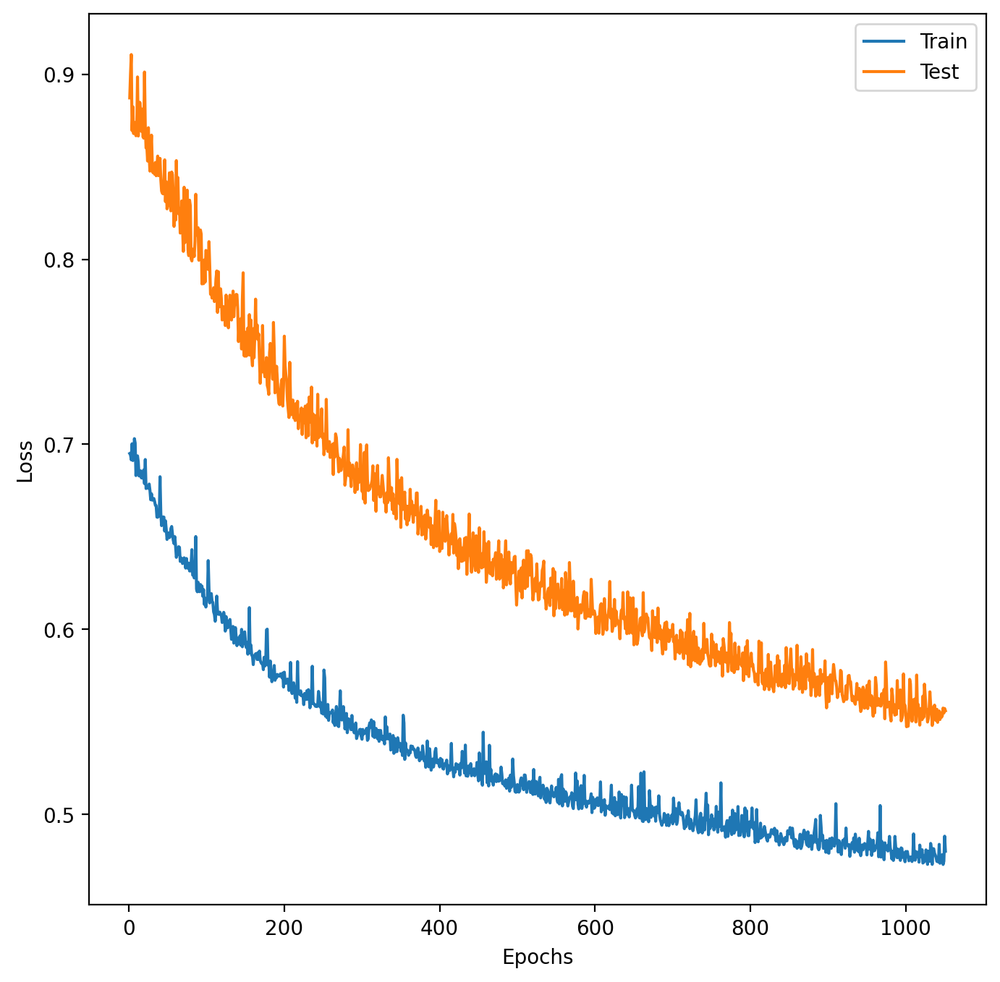

Training with KL weight decay: 0.25 and hidden layer sizes: None and learning rate: 1e-05
[001/2000] train_loss: 0.695019, test_loss: 0.887210, time: 0.05 s
[002/2000] train_loss: 0.694287, test_loss: 0.900042, time: 0.02 s
[003/2000] train_loss: 0.691571, test_loss: 0.910647, time: 0.02 s
[004/2000] train_loss: 0.700293, test_loss: 0.869540, time: 0.02 s
[005/2000] train_loss: 0.691216, test_loss: 0.882459, time: 0.02 s
[006/2000] train_loss: 0.692134, test_loss: 0.867955, time: 0.02 s
[007/2000] train_loss: 0.703047, test_loss: 0.873993, time: 0.02 s
[008/2000] train_loss: 0.700681, test_loss: 0.871487, time: 0.02 s
[009/2000] train_loss: 0.683107, test_loss: 0.866768, time: 0.02 s
[010/2000] train_loss: 0.693390, test_loss: 0.869946, time: 0.02 s
[011/2000] train_loss: 0.693745, test_loss: 0.898550, time: 0.02 s
[012/2000] train_loss: 0.690472, test_loss: 0.866628, time: 0.02 s
[013/2000] train_loss: 0.682881, test_loss: 0.878179, time: 0.02 s
[014/2000] train_loss: 0.685558, test_l

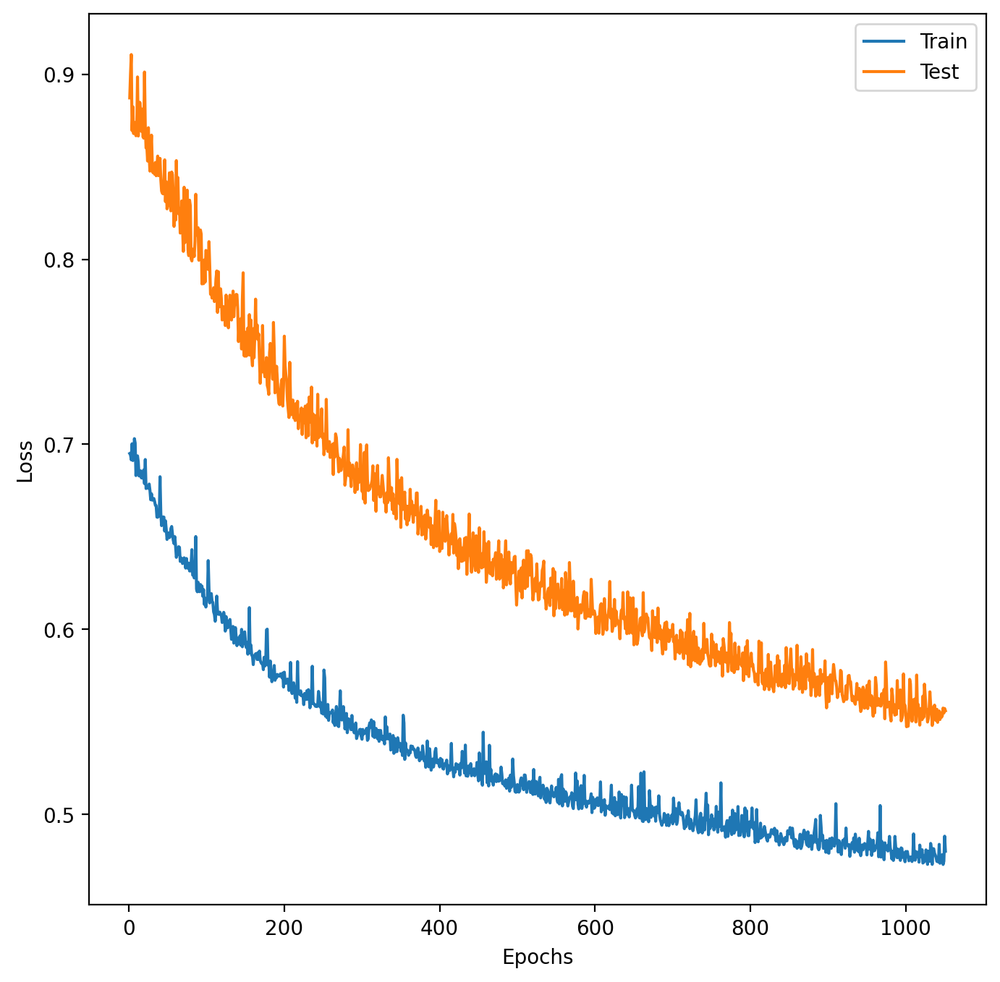

Training with KL weight decay: 0.5 and hidden layer sizes: None and learning rate: 1e-05
[001/2000] train_loss: 0.695019, test_loss: 0.887210, time: 0.02 s
[002/2000] train_loss: 0.694287, test_loss: 0.900042, time: 0.02 s
[003/2000] train_loss: 0.691571, test_loss: 0.910647, time: 0.02 s
[004/2000] train_loss: 0.700293, test_loss: 0.869540, time: 0.02 s
[005/2000] train_loss: 0.691216, test_loss: 0.882459, time: 0.02 s
[006/2000] train_loss: 0.692134, test_loss: 0.867955, time: 0.02 s
[007/2000] train_loss: 0.703047, test_loss: 0.873993, time: 0.02 s
[008/2000] train_loss: 0.700681, test_loss: 0.871487, time: 0.02 s
[009/2000] train_loss: 0.683107, test_loss: 0.866768, time: 0.02 s
[010/2000] train_loss: 0.693390, test_loss: 0.869946, time: 0.02 s
[011/2000] train_loss: 0.693745, test_loss: 0.898550, time: 0.02 s
[012/2000] train_loss: 0.690472, test_loss: 0.866628, time: 0.02 s
[013/2000] train_loss: 0.682881, test_loss: 0.878179, time: 0.02 s
[014/2000] train_loss: 0.685558, test_lo

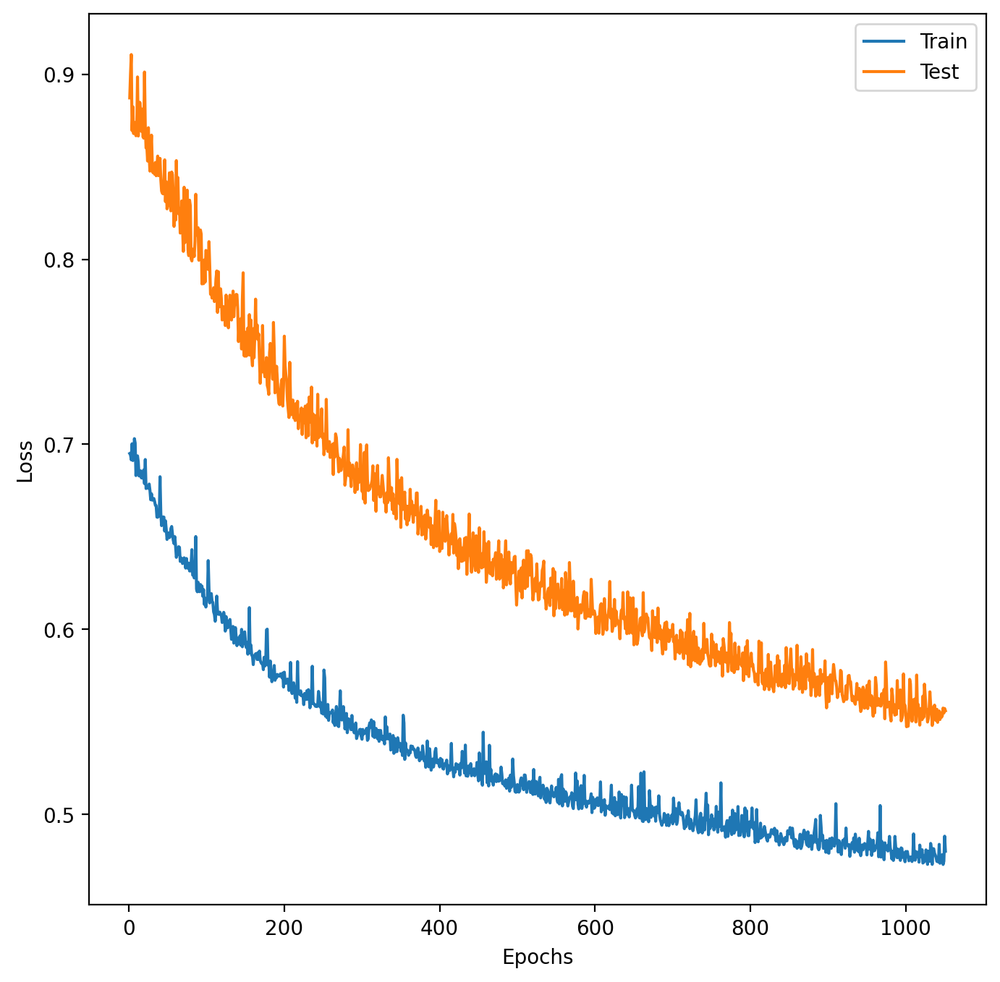

Training with KL weight decay: 0.75 and hidden layer sizes: None and learning rate: 1e-05
[001/2000] train_loss: 0.695019, test_loss: 0.887210, time: 0.02 s
[002/2000] train_loss: 0.694287, test_loss: 0.900042, time: 0.02 s
[003/2000] train_loss: 0.691571, test_loss: 0.910647, time: 0.02 s
[004/2000] train_loss: 0.700293, test_loss: 0.869540, time: 0.02 s
[005/2000] train_loss: 0.691216, test_loss: 0.882459, time: 0.02 s
[006/2000] train_loss: 0.692134, test_loss: 0.867955, time: 0.02 s
[007/2000] train_loss: 0.703047, test_loss: 0.873993, time: 0.02 s
[008/2000] train_loss: 0.700681, test_loss: 0.871487, time: 0.02 s
[009/2000] train_loss: 0.683107, test_loss: 0.866768, time: 0.02 s
[010/2000] train_loss: 0.693390, test_loss: 0.869946, time: 0.02 s
[011/2000] train_loss: 0.693745, test_loss: 0.898550, time: 0.02 s
[012/2000] train_loss: 0.690472, test_loss: 0.866628, time: 0.02 s
[013/2000] train_loss: 0.682881, test_loss: 0.878179, time: 0.02 s
[014/2000] train_loss: 0.685558, test_l

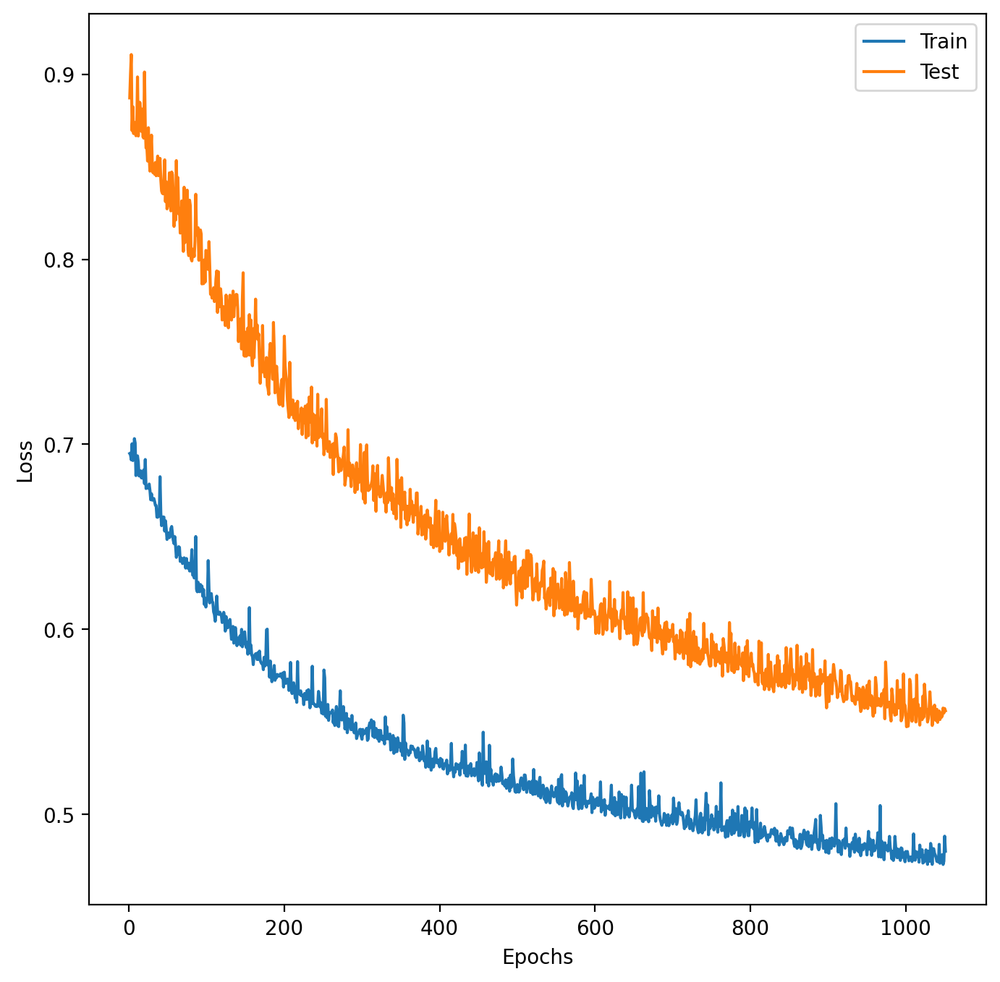

Training with KL weight decay: 1.0 and hidden layer sizes: None and learning rate: 1e-05
[001/2000] train_loss: 0.695019, test_loss: 0.887210, time: 0.02 s
[002/2000] train_loss: 0.694287, test_loss: 0.900042, time: 0.02 s
[003/2000] train_loss: 0.691571, test_loss: 0.910647, time: 0.02 s
[004/2000] train_loss: 0.700293, test_loss: 0.869540, time: 0.02 s
[005/2000] train_loss: 0.691216, test_loss: 0.882459, time: 0.02 s
[006/2000] train_loss: 0.692134, test_loss: 0.867955, time: 0.02 s
[007/2000] train_loss: 0.703047, test_loss: 0.873993, time: 0.02 s
[008/2000] train_loss: 0.700681, test_loss: 0.871487, time: 0.02 s
[009/2000] train_loss: 0.683107, test_loss: 0.866768, time: 0.02 s
[010/2000] train_loss: 0.693390, test_loss: 0.869946, time: 0.02 s
[011/2000] train_loss: 0.693745, test_loss: 0.898550, time: 0.02 s
[012/2000] train_loss: 0.690472, test_loss: 0.866628, time: 0.02 s
[013/2000] train_loss: 0.682881, test_loss: 0.878179, time: 0.02 s
[014/2000] train_loss: 0.685558, test_lo

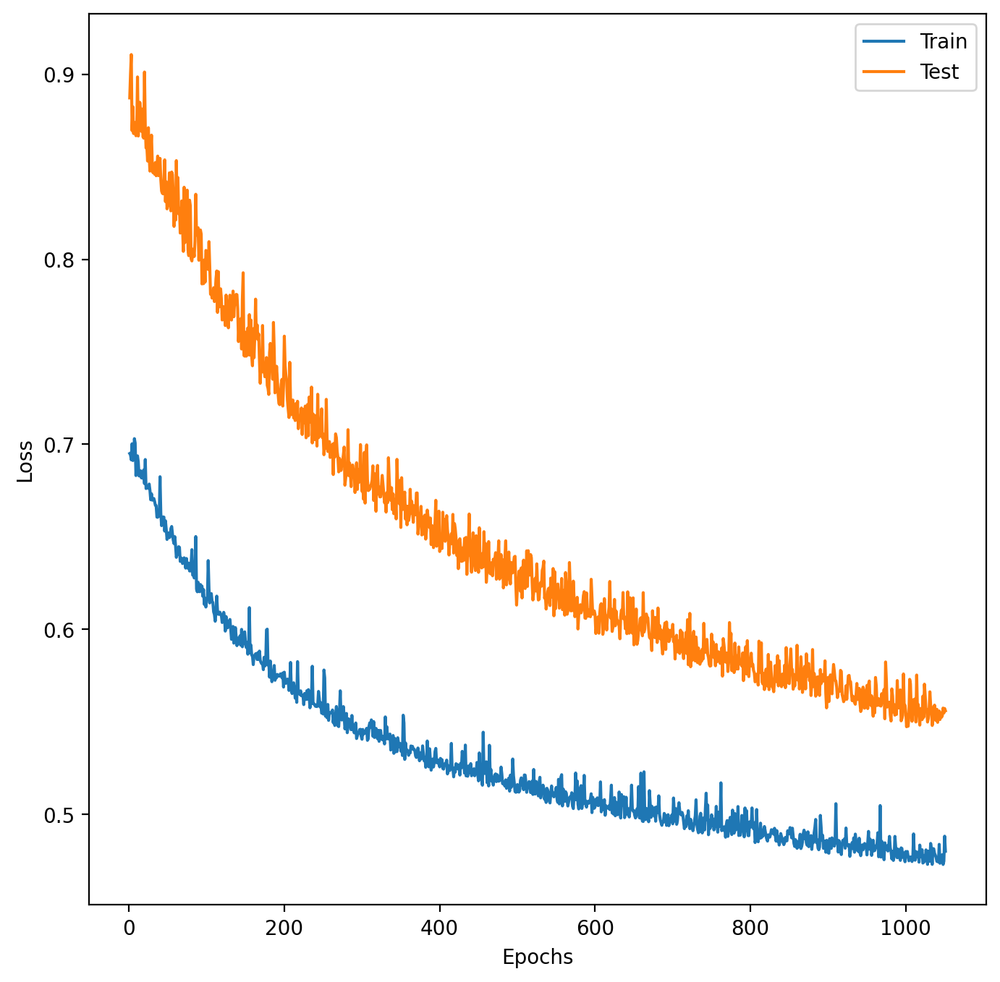

Training with KL weight decay: 0.0 and hidden layer sizes: [8] and learning rate: 1e-05
[001/2000] train_loss: 1.645546, test_loss: 1.944781, time: 0.05 s
[002/2000] train_loss: 1.753945, test_loss: 1.766949, time: 0.04 s
[003/2000] train_loss: 1.910986, test_loss: 1.766761, time: 0.04 s
[004/2000] train_loss: 1.987203, test_loss: 1.942995, time: 0.04 s
[005/2000] train_loss: 2.005183, test_loss: 2.056997, time: 0.04 s
[006/2000] train_loss: 1.801152, test_loss: 2.134993, time: 0.04 s
[007/2000] train_loss: 1.714540, test_loss: 1.674465, time: 0.04 s
[008/2000] train_loss: 1.736004, test_loss: 1.548637, time: 0.04 s
[009/2000] train_loss: 1.601353, test_loss: 1.869872, time: 0.04 s
[010/2000] train_loss: 1.691962, test_loss: 1.762671, time: 0.04 s
[011/2000] train_loss: 1.758679, test_loss: 1.638769, time: 0.04 s
[012/2000] train_loss: 1.670301, test_loss: 2.021091, time: 0.04 s
[013/2000] train_loss: 1.734144, test_loss: 1.710493, time: 0.04 s
[014/2000] train_loss: 1.884958, test_los

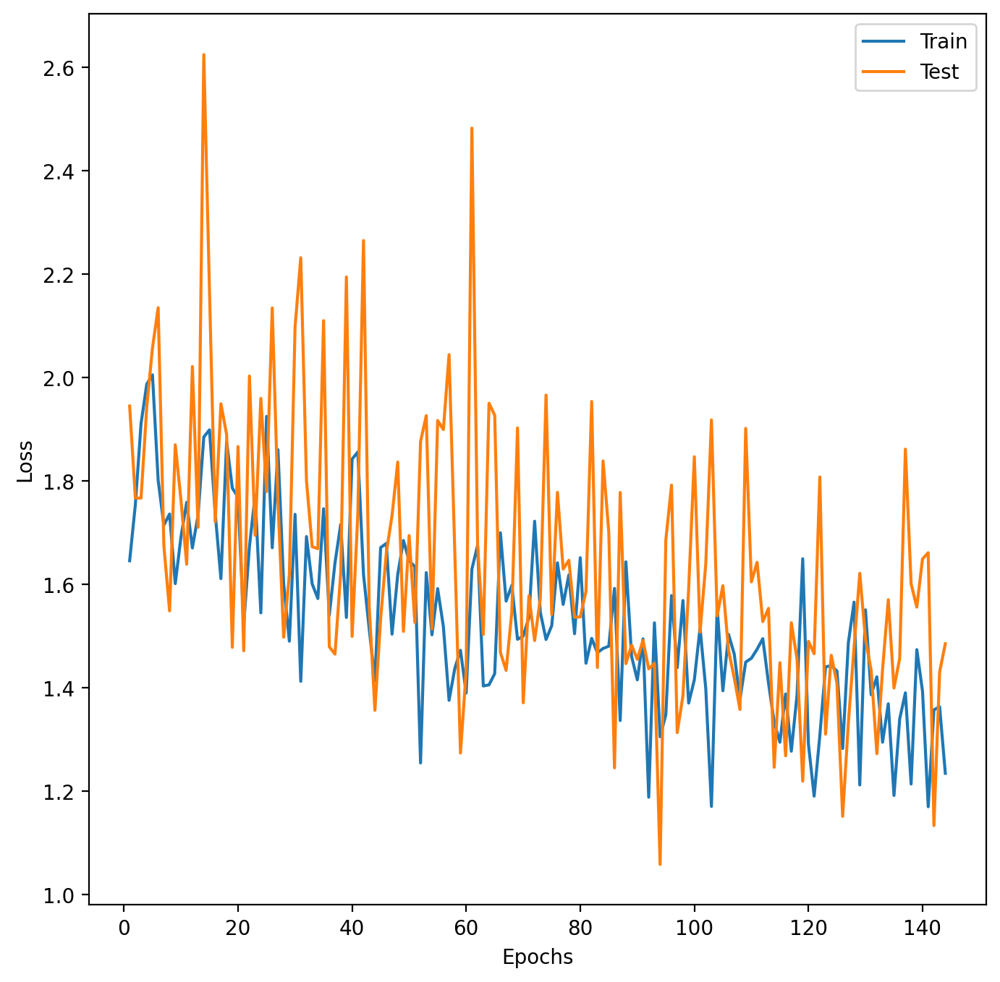

Training with KL weight decay: 0.25 and hidden layer sizes: [8] and learning rate: 1e-05
[001/2000] train_loss: 1.645546, test_loss: 1.944781, time: 0.04 s
[002/2000] train_loss: 1.753945, test_loss: 1.766949, time: 0.04 s
[003/2000] train_loss: 1.910986, test_loss: 1.766761, time: 0.04 s
[004/2000] train_loss: 1.987203, test_loss: 1.942995, time: 0.04 s
[005/2000] train_loss: 2.005183, test_loss: 2.056997, time: 0.04 s
[006/2000] train_loss: 1.801152, test_loss: 2.134993, time: 0.04 s
[007/2000] train_loss: 1.714540, test_loss: 1.674465, time: 0.04 s
[008/2000] train_loss: 1.736004, test_loss: 1.548637, time: 0.04 s
[009/2000] train_loss: 1.601353, test_loss: 1.869872, time: 0.04 s
[010/2000] train_loss: 1.691962, test_loss: 1.762671, time: 0.04 s
[011/2000] train_loss: 1.758679, test_loss: 1.638769, time: 0.04 s
[012/2000] train_loss: 1.670301, test_loss: 2.021091, time: 0.04 s
[013/2000] train_loss: 1.734144, test_loss: 1.710493, time: 0.04 s
[014/2000] train_loss: 1.884958, test_lo

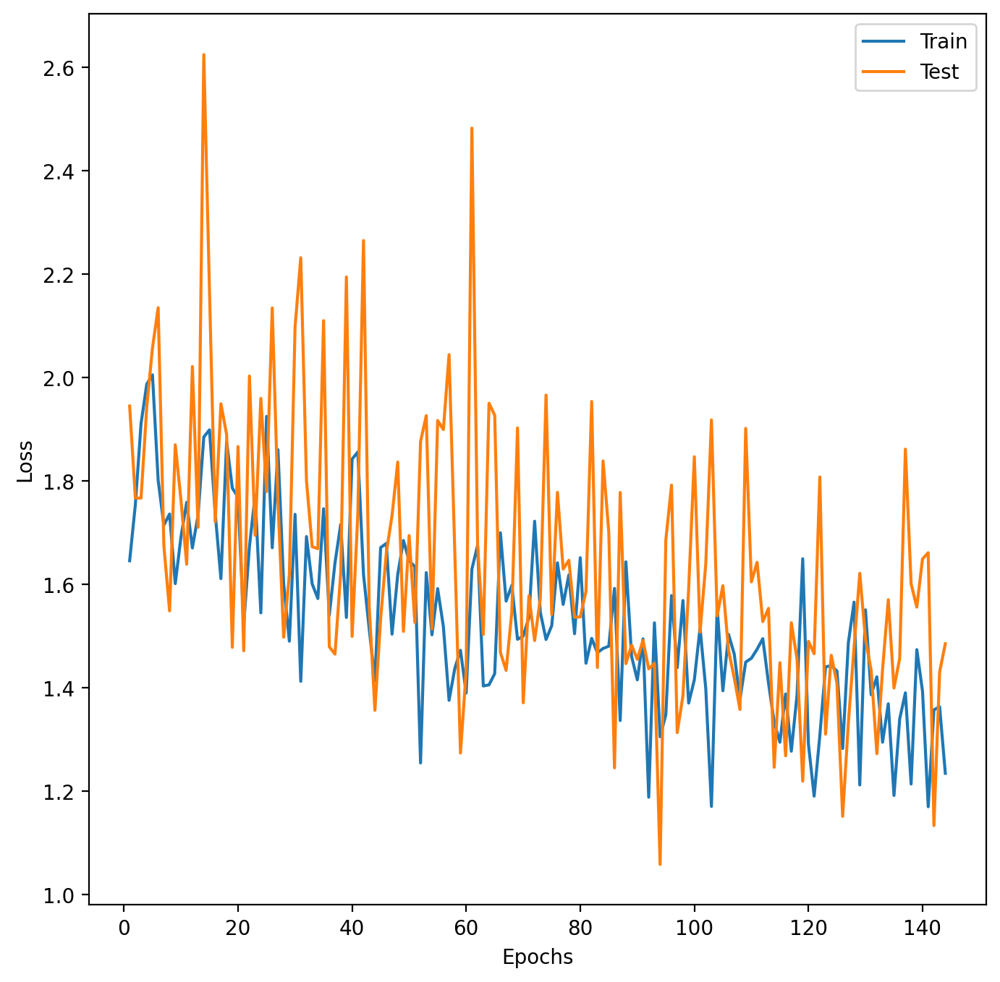

Training with KL weight decay: 0.5 and hidden layer sizes: [8] and learning rate: 1e-05
[001/2000] train_loss: 1.645546, test_loss: 1.944781, time: 0.05 s
[002/2000] train_loss: 1.753945, test_loss: 1.766949, time: 0.04 s
[003/2000] train_loss: 1.910986, test_loss: 1.766761, time: 0.04 s
[004/2000] train_loss: 1.987203, test_loss: 1.942995, time: 0.04 s
[005/2000] train_loss: 2.005183, test_loss: 2.056997, time: 0.04 s
[006/2000] train_loss: 1.801152, test_loss: 2.134993, time: 0.04 s
[007/2000] train_loss: 1.714540, test_loss: 1.674465, time: 0.04 s
[008/2000] train_loss: 1.736004, test_loss: 1.548637, time: 0.04 s
[009/2000] train_loss: 1.601353, test_loss: 1.869872, time: 0.04 s
[010/2000] train_loss: 1.691962, test_loss: 1.762671, time: 0.04 s
[011/2000] train_loss: 1.758679, test_loss: 1.638769, time: 0.04 s
[012/2000] train_loss: 1.670301, test_loss: 2.021091, time: 0.05 s
[013/2000] train_loss: 1.734144, test_loss: 1.710493, time: 0.04 s
[014/2000] train_loss: 1.884958, test_los

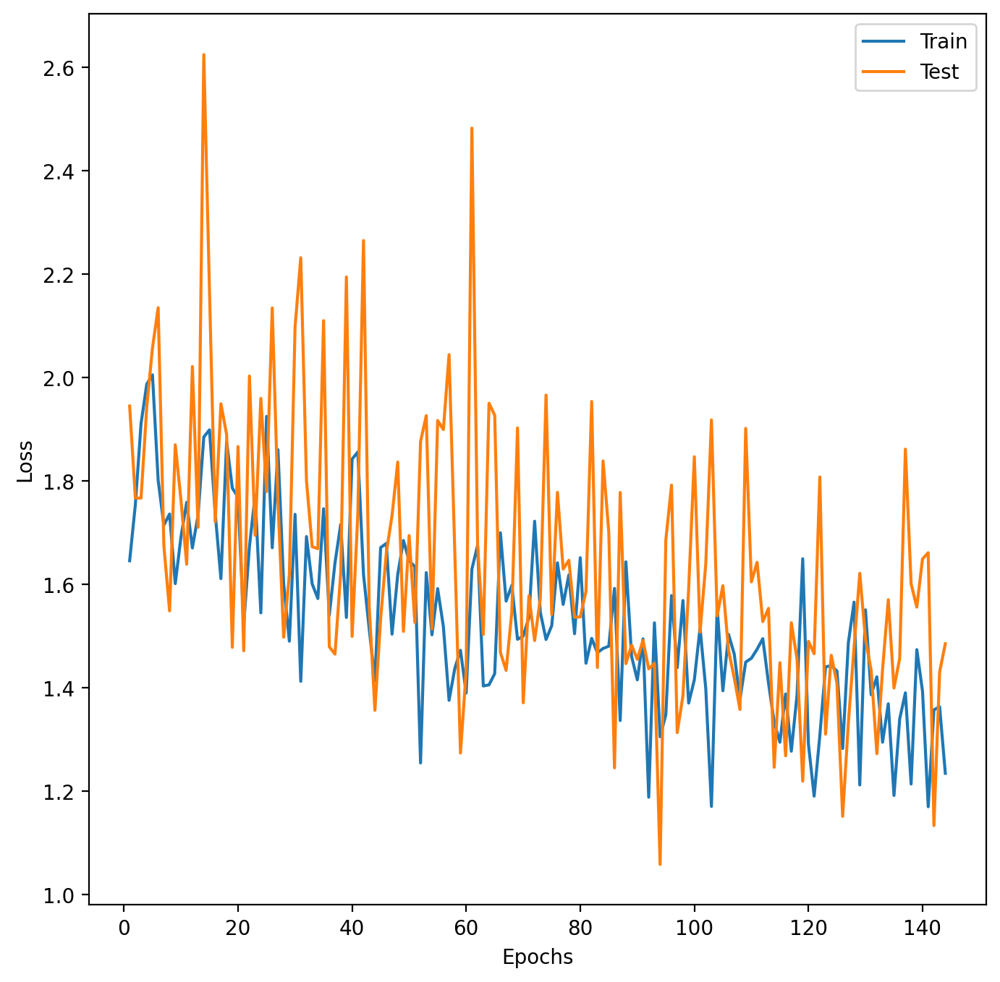

Training with KL weight decay: 0.75 and hidden layer sizes: [8] and learning rate: 1e-05
[001/2000] train_loss: 1.645546, test_loss: 1.944781, time: 0.05 s
[002/2000] train_loss: 1.753945, test_loss: 1.766949, time: 0.04 s
[003/2000] train_loss: 1.910986, test_loss: 1.766761, time: 0.04 s
[004/2000] train_loss: 1.987203, test_loss: 1.942995, time: 0.04 s
[005/2000] train_loss: 2.005183, test_loss: 2.056997, time: 0.05 s
[006/2000] train_loss: 1.801152, test_loss: 2.134993, time: 0.04 s
[007/2000] train_loss: 1.714540, test_loss: 1.674465, time: 0.04 s
[008/2000] train_loss: 1.736004, test_loss: 1.548637, time: 0.04 s
[009/2000] train_loss: 1.601353, test_loss: 1.869872, time: 0.04 s
[010/2000] train_loss: 1.691962, test_loss: 1.762671, time: 0.04 s
[011/2000] train_loss: 1.758679, test_loss: 1.638769, time: 0.05 s
[012/2000] train_loss: 1.670301, test_loss: 2.021091, time: 0.05 s
[013/2000] train_loss: 1.734144, test_loss: 1.710493, time: 0.05 s
[014/2000] train_loss: 1.884958, test_lo

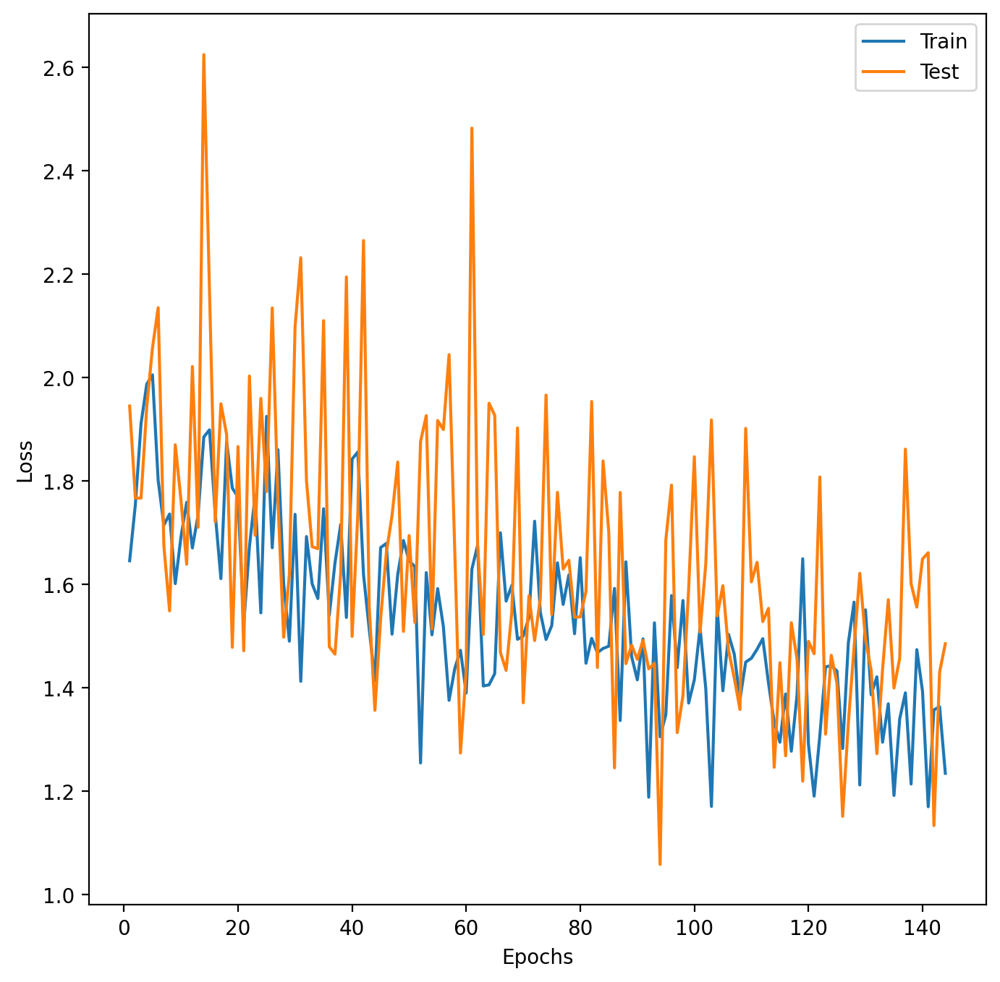

Training with KL weight decay: 1.0 and hidden layer sizes: [8] and learning rate: 1e-05
[001/2000] train_loss: 1.645546, test_loss: 1.944781, time: 0.04 s
[002/2000] train_loss: 1.753945, test_loss: 1.766949, time: 0.04 s
[003/2000] train_loss: 1.910986, test_loss: 1.766761, time: 0.04 s
[004/2000] train_loss: 1.987203, test_loss: 1.942995, time: 0.04 s
[005/2000] train_loss: 2.005183, test_loss: 2.056997, time: 0.04 s
[006/2000] train_loss: 1.801152, test_loss: 2.134993, time: 0.04 s
[007/2000] train_loss: 1.714540, test_loss: 1.674465, time: 0.04 s
[008/2000] train_loss: 1.736004, test_loss: 1.548637, time: 0.04 s
[009/2000] train_loss: 1.601353, test_loss: 1.869872, time: 0.04 s
[010/2000] train_loss: 1.691962, test_loss: 1.762671, time: 0.04 s
[011/2000] train_loss: 1.758679, test_loss: 1.638769, time: 0.04 s
[012/2000] train_loss: 1.670301, test_loss: 2.021091, time: 0.04 s
[013/2000] train_loss: 1.734144, test_loss: 1.710493, time: 0.04 s
[014/2000] train_loss: 1.884958, test_los

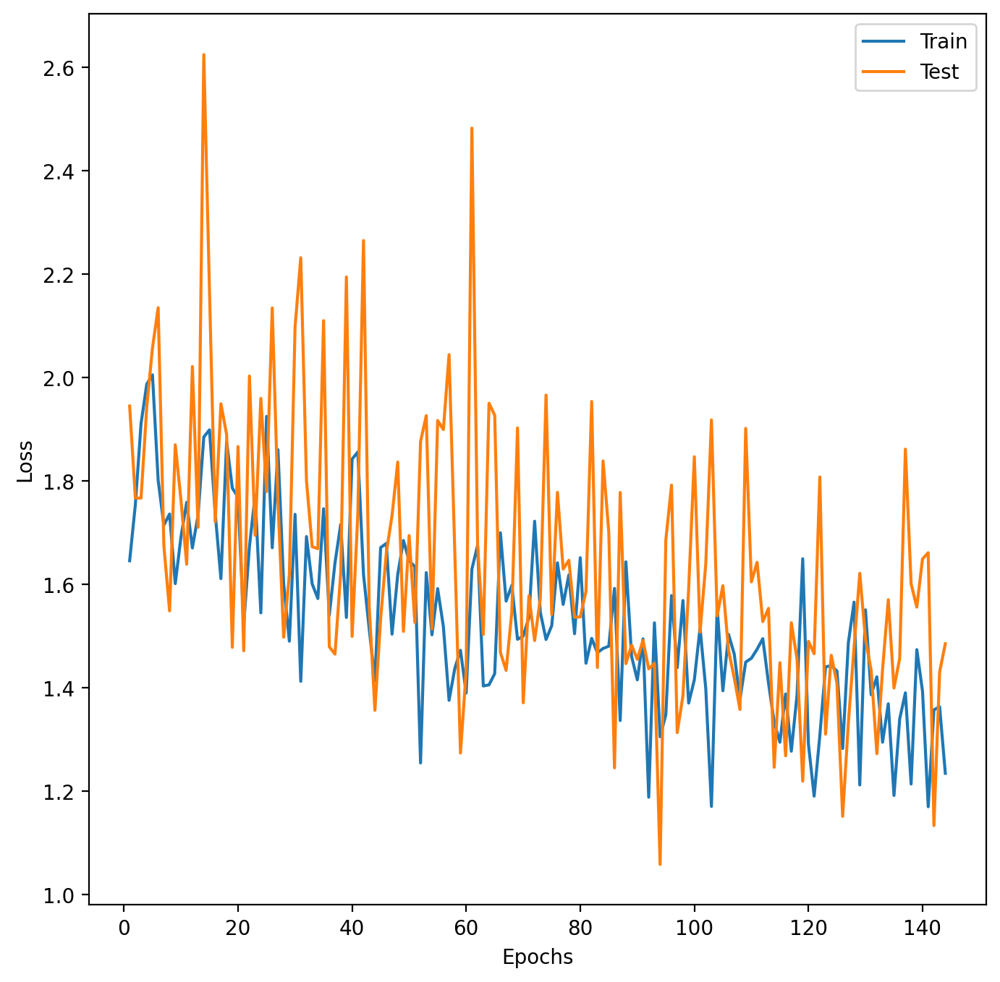

Training with KL weight decay: 0.0 and hidden layer sizes: [16] and learning rate: 1e-05
[001/2000] train_loss: 1.582137, test_loss: 1.567969, time: 0.08 s
[002/2000] train_loss: 1.628966, test_loss: 1.696165, time: 0.08 s
[003/2000] train_loss: 1.439051, test_loss: 1.920976, time: 0.08 s
[004/2000] train_loss: 1.468920, test_loss: 1.244855, time: 0.04 s
[005/2000] train_loss: 1.421227, test_loss: 1.719434, time: 0.05 s
[006/2000] train_loss: 1.387580, test_loss: 1.355923, time: 0.05 s
[007/2000] train_loss: 1.392962, test_loss: 1.294097, time: 0.05 s
[008/2000] train_loss: 1.432167, test_loss: 1.475932, time: 0.05 s
[009/2000] train_loss: 1.362801, test_loss: 1.992482, time: 0.06 s
[010/2000] train_loss: 1.456042, test_loss: 1.506896, time: 0.05 s
[011/2000] train_loss: 1.377882, test_loss: 1.172160, time: 0.04 s
[012/2000] train_loss: 1.511417, test_loss: 1.566151, time: 0.05 s
[013/2000] train_loss: 1.324825, test_loss: 1.658396, time: 0.05 s
[014/2000] train_loss: 1.406452, test_lo

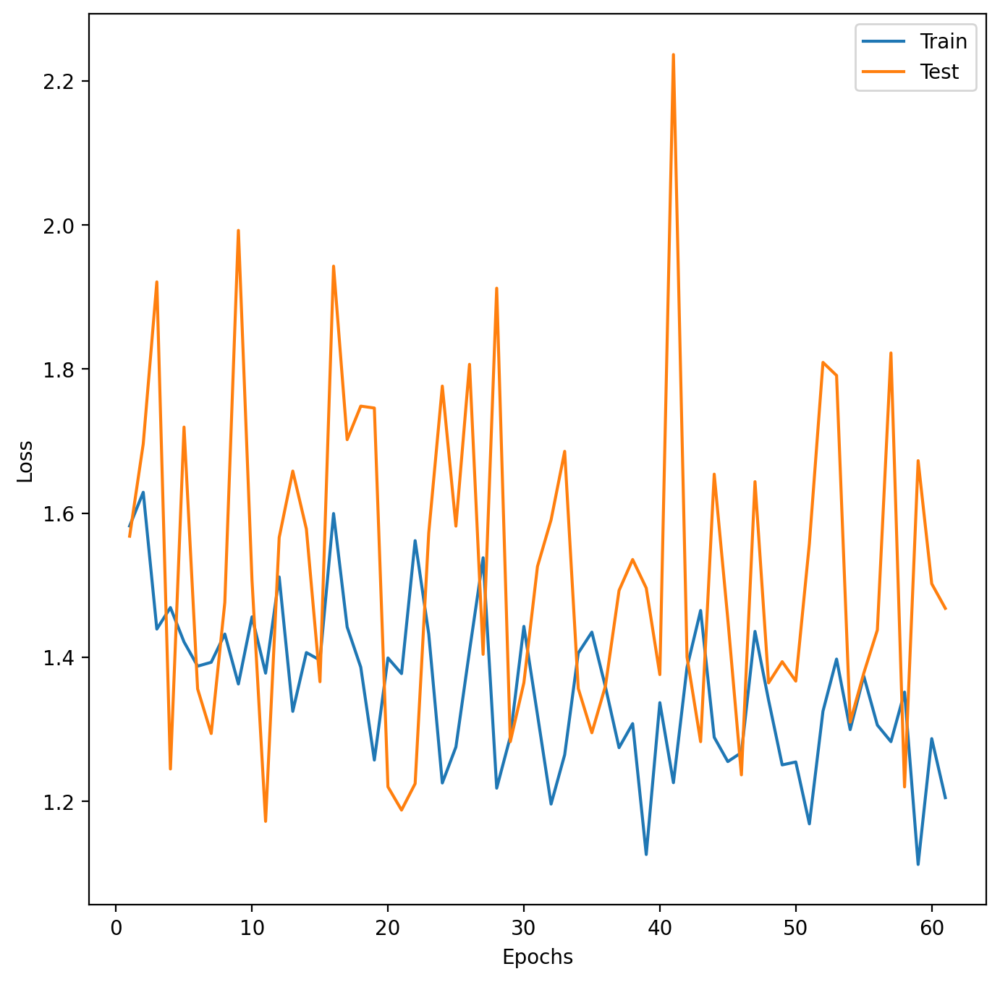

Training with KL weight decay: 0.25 and hidden layer sizes: [16] and learning rate: 1e-05
[001/2000] train_loss: 1.582137, test_loss: 1.567969, time: 0.08 s
[002/2000] train_loss: 1.628966, test_loss: 1.696165, time: 0.04 s
[003/2000] train_loss: 1.439051, test_loss: 1.920976, time: 0.04 s
[004/2000] train_loss: 1.468920, test_loss: 1.244855, time: 0.04 s
[005/2000] train_loss: 1.421227, test_loss: 1.719434, time: 0.04 s
[006/2000] train_loss: 1.387580, test_loss: 1.355923, time: 0.04 s
[007/2000] train_loss: 1.392962, test_loss: 1.294097, time: 0.04 s
[008/2000] train_loss: 1.432167, test_loss: 1.475932, time: 0.04 s
[009/2000] train_loss: 1.362801, test_loss: 1.992482, time: 0.04 s
[010/2000] train_loss: 1.456042, test_loss: 1.506896, time: 0.04 s
[011/2000] train_loss: 1.377882, test_loss: 1.172160, time: 0.05 s
[012/2000] train_loss: 1.511417, test_loss: 1.566151, time: 0.05 s
[013/2000] train_loss: 1.324825, test_loss: 1.658396, time: 0.05 s
[014/2000] train_loss: 1.406452, test_l

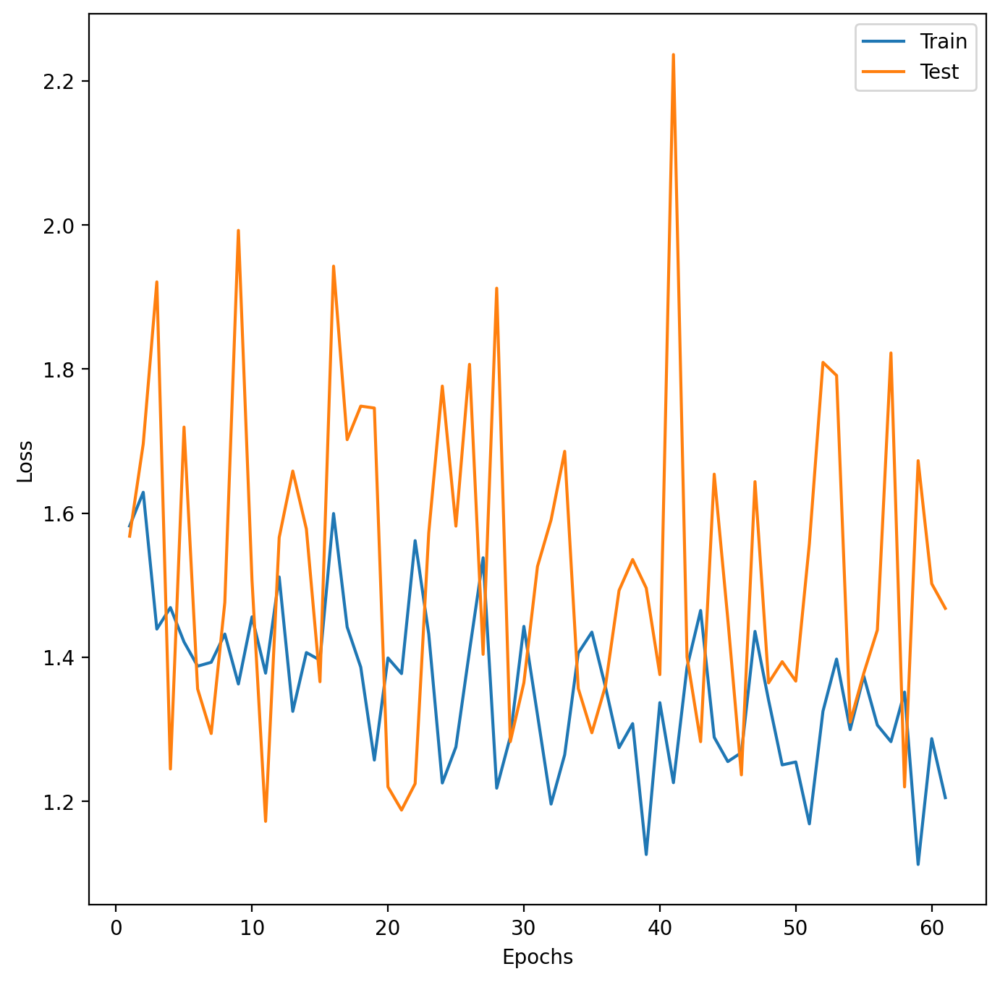

Training with KL weight decay: 0.5 and hidden layer sizes: [16] and learning rate: 1e-05
[001/2000] train_loss: 1.582137, test_loss: 1.567969, time: 0.05 s
[002/2000] train_loss: 1.628966, test_loss: 1.696165, time: 0.04 s
[003/2000] train_loss: 1.439051, test_loss: 1.920976, time: 0.04 s
[004/2000] train_loss: 1.468920, test_loss: 1.244855, time: 0.05 s
[005/2000] train_loss: 1.421227, test_loss: 1.719434, time: 0.08 s
[006/2000] train_loss: 1.387580, test_loss: 1.355923, time: 0.10 s
[007/2000] train_loss: 1.392962, test_loss: 1.294097, time: 0.04 s
[008/2000] train_loss: 1.432167, test_loss: 1.475932, time: 0.05 s
[009/2000] train_loss: 1.362801, test_loss: 1.992482, time: 0.05 s
[010/2000] train_loss: 1.456042, test_loss: 1.506896, time: 0.04 s
[011/2000] train_loss: 1.377882, test_loss: 1.172160, time: 0.04 s
[012/2000] train_loss: 1.511417, test_loss: 1.566151, time: 0.04 s
[013/2000] train_loss: 1.324825, test_loss: 1.658396, time: 0.04 s
[014/2000] train_loss: 1.406452, test_lo

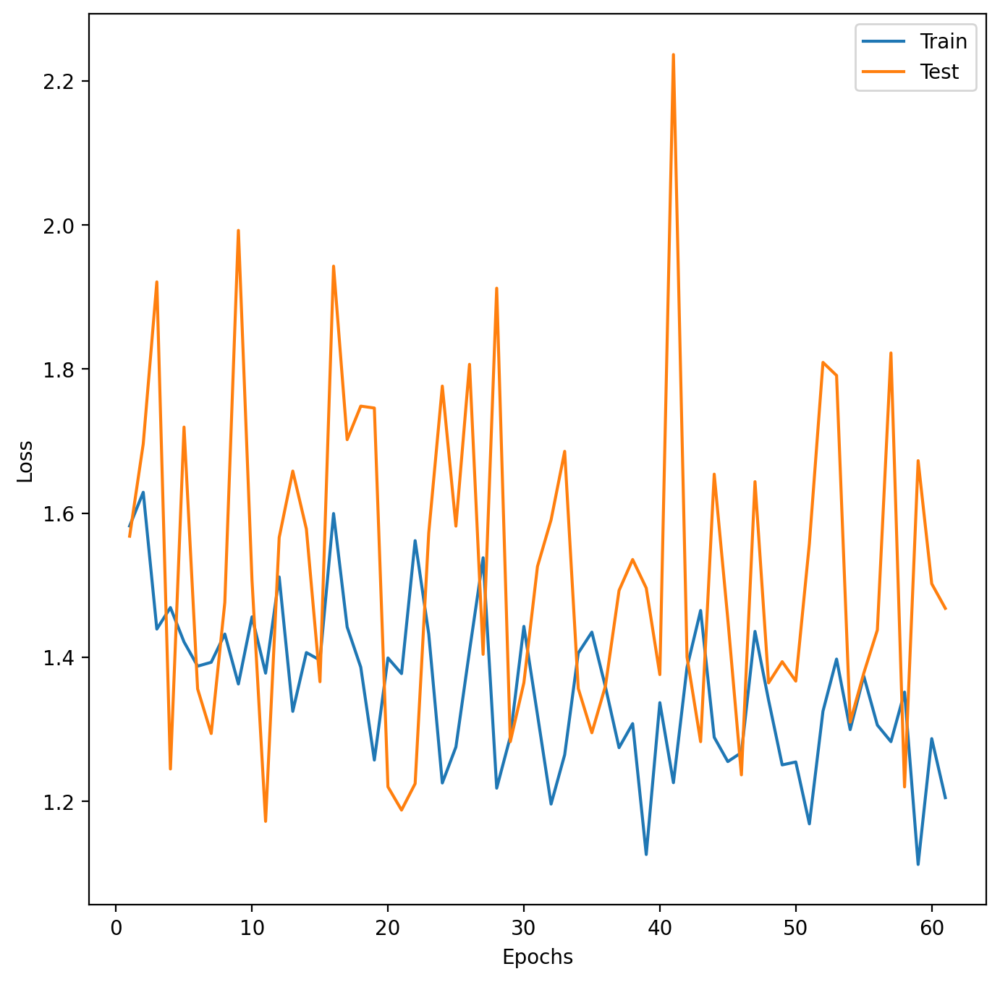

Training with KL weight decay: 0.75 and hidden layer sizes: [16] and learning rate: 1e-05
[001/2000] train_loss: 1.582137, test_loss: 1.567969, time: 0.05 s
[002/2000] train_loss: 1.628966, test_loss: 1.696165, time: 0.04 s
[003/2000] train_loss: 1.439051, test_loss: 1.920976, time: 0.04 s
[004/2000] train_loss: 1.468920, test_loss: 1.244855, time: 0.04 s
[005/2000] train_loss: 1.421227, test_loss: 1.719434, time: 0.04 s
[006/2000] train_loss: 1.387580, test_loss: 1.355923, time: 0.04 s
[007/2000] train_loss: 1.392962, test_loss: 1.294097, time: 0.04 s
[008/2000] train_loss: 1.432167, test_loss: 1.475932, time: 0.04 s
[009/2000] train_loss: 1.362801, test_loss: 1.992482, time: 0.04 s
[010/2000] train_loss: 1.456042, test_loss: 1.506896, time: 0.04 s
[011/2000] train_loss: 1.377882, test_loss: 1.172160, time: 0.04 s
[012/2000] train_loss: 1.511417, test_loss: 1.566151, time: 0.05 s
[013/2000] train_loss: 1.324825, test_loss: 1.658396, time: 0.05 s
[014/2000] train_loss: 1.406452, test_l

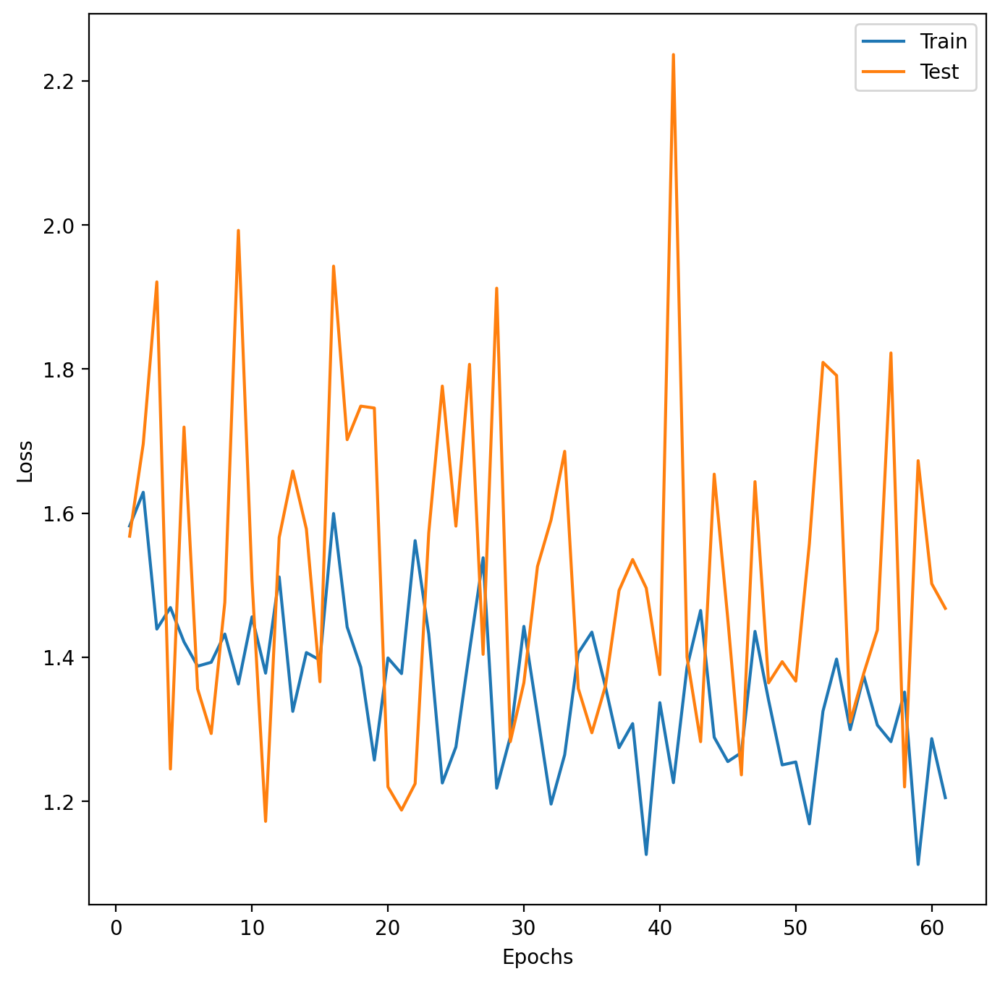

Training with KL weight decay: 1.0 and hidden layer sizes: [16] and learning rate: 1e-05
[001/2000] train_loss: 1.582137, test_loss: 1.567969, time: 0.04 s
[002/2000] train_loss: 1.628966, test_loss: 1.696165, time: 0.04 s
[003/2000] train_loss: 1.439051, test_loss: 1.920976, time: 0.04 s
[004/2000] train_loss: 1.468920, test_loss: 1.244855, time: 0.04 s
[005/2000] train_loss: 1.421227, test_loss: 1.719434, time: 0.04 s
[006/2000] train_loss: 1.387580, test_loss: 1.355923, time: 0.04 s
[007/2000] train_loss: 1.392962, test_loss: 1.294097, time: 0.04 s
[008/2000] train_loss: 1.432167, test_loss: 1.475932, time: 0.07 s
[009/2000] train_loss: 1.362801, test_loss: 1.992482, time: 0.14 s
[010/2000] train_loss: 1.456042, test_loss: 1.506896, time: 0.07 s
[011/2000] train_loss: 1.377882, test_loss: 1.172160, time: 0.05 s
[012/2000] train_loss: 1.511417, test_loss: 1.566151, time: 0.05 s
[013/2000] train_loss: 1.324825, test_loss: 1.658396, time: 0.04 s
[014/2000] train_loss: 1.406452, test_lo

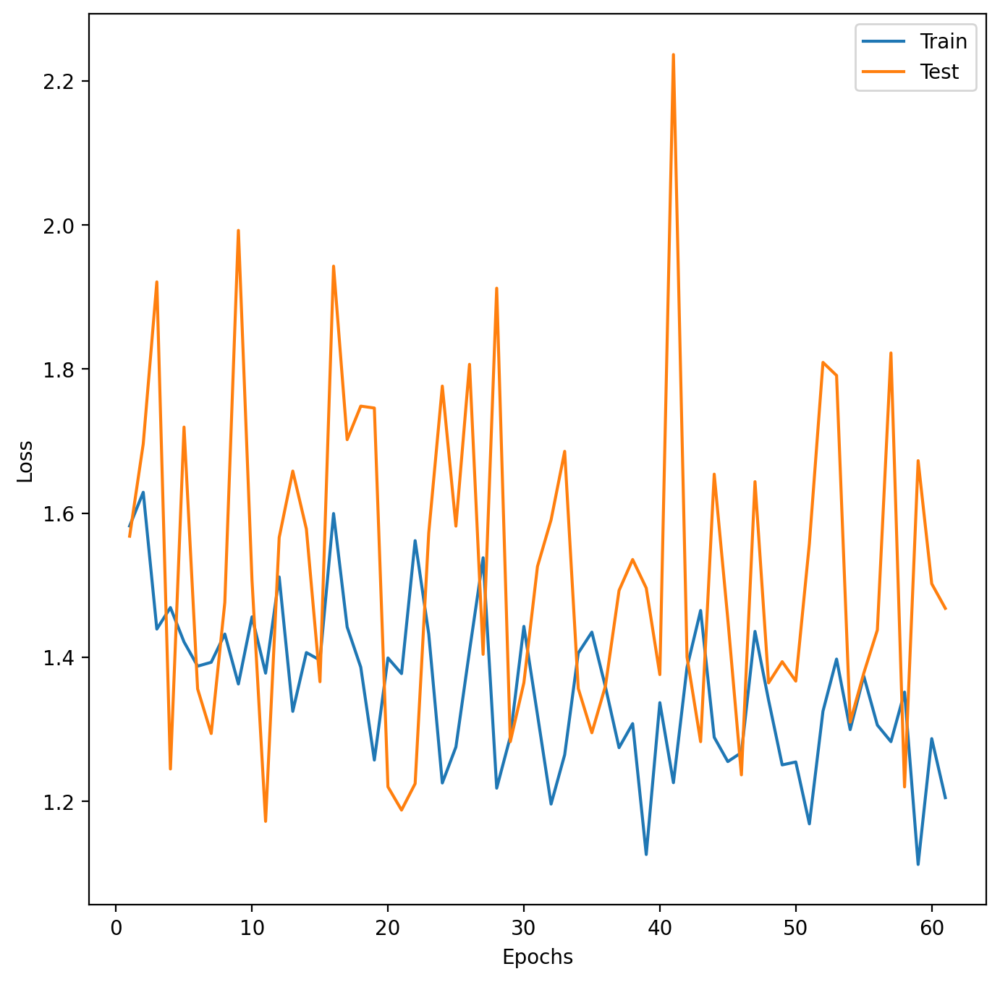

Training with KL weight decay: 0.0 and hidden layer sizes: [32] and learning rate: 1e-05
[001/2000] train_loss: 1.730349, test_loss: 1.478649, time: 0.04 s
[002/2000] train_loss: 1.786781, test_loss: 1.656614, time: 0.04 s
[003/2000] train_loss: 1.672526, test_loss: 1.450465, time: 0.04 s
[004/2000] train_loss: 1.956825, test_loss: 1.655357, time: 0.04 s
[005/2000] train_loss: 1.538195, test_loss: 1.801397, time: 0.04 s
[006/2000] train_loss: 1.731346, test_loss: 1.658009, time: 0.04 s
[007/2000] train_loss: 1.502876, test_loss: 1.741860, time: 0.04 s
[008/2000] train_loss: 1.783115, test_loss: 1.165073, time: 0.04 s
[009/2000] train_loss: 1.447434, test_loss: 1.907782, time: 0.04 s
[010/2000] train_loss: 1.612743, test_loss: 1.342239, time: 0.04 s
[011/2000] train_loss: 1.805224, test_loss: 1.721904, time: 0.04 s
[012/2000] train_loss: 1.619187, test_loss: 1.579612, time: 0.04 s
[013/2000] train_loss: 1.603169, test_loss: 1.909603, time: 0.04 s
[014/2000] train_loss: 1.661472, test_lo

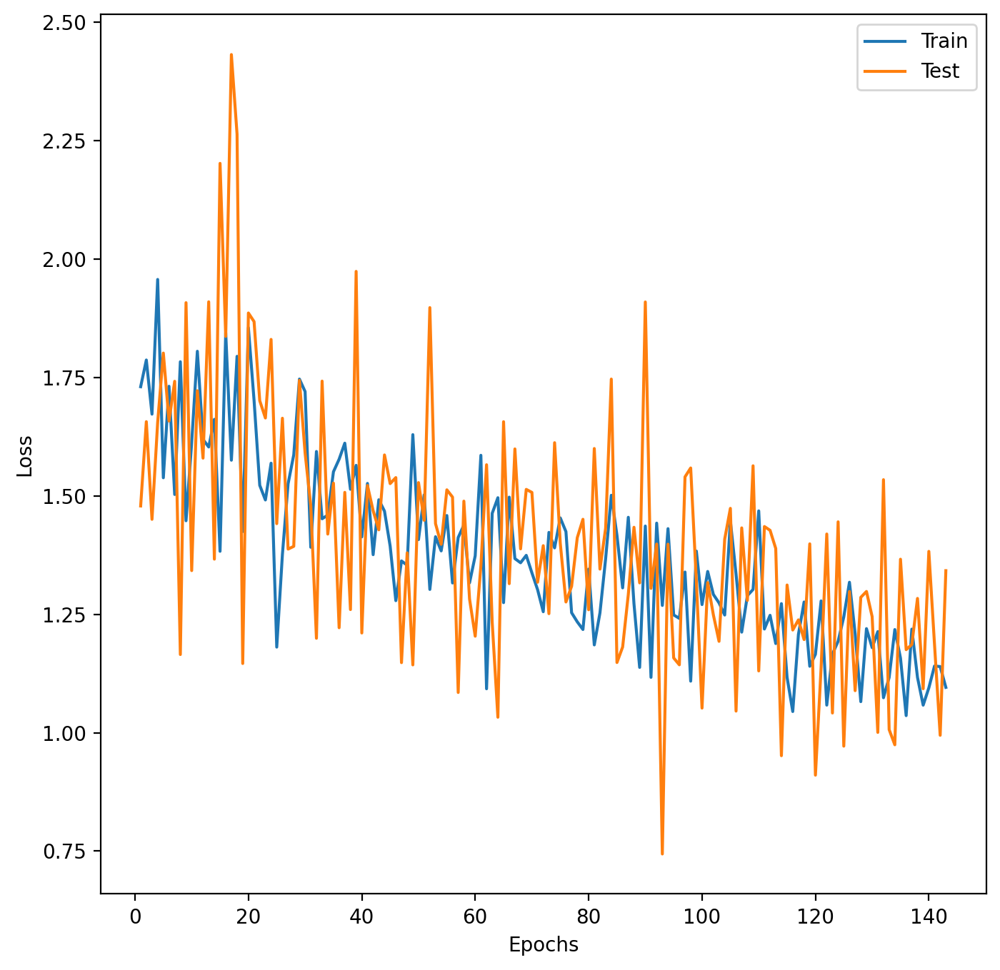

Training with KL weight decay: 0.25 and hidden layer sizes: [32] and learning rate: 1e-05
[001/2000] train_loss: 1.730349, test_loss: 1.478649, time: 0.05 s
[002/2000] train_loss: 1.786781, test_loss: 1.656614, time: 0.04 s
[003/2000] train_loss: 1.672526, test_loss: 1.450465, time: 0.04 s
[004/2000] train_loss: 1.956825, test_loss: 1.655357, time: 0.04 s
[005/2000] train_loss: 1.538195, test_loss: 1.801397, time: 0.04 s
[006/2000] train_loss: 1.731346, test_loss: 1.658009, time: 0.04 s
[007/2000] train_loss: 1.502876, test_loss: 1.741860, time: 0.04 s
[008/2000] train_loss: 1.783115, test_loss: 1.165073, time: 0.04 s
[009/2000] train_loss: 1.447434, test_loss: 1.907782, time: 0.04 s
[010/2000] train_loss: 1.612743, test_loss: 1.342239, time: 0.06 s
[011/2000] train_loss: 1.805224, test_loss: 1.721904, time: 0.05 s
[012/2000] train_loss: 1.619187, test_loss: 1.579612, time: 0.04 s
[013/2000] train_loss: 1.603169, test_loss: 1.909603, time: 0.04 s
[014/2000] train_loss: 1.661472, test_l

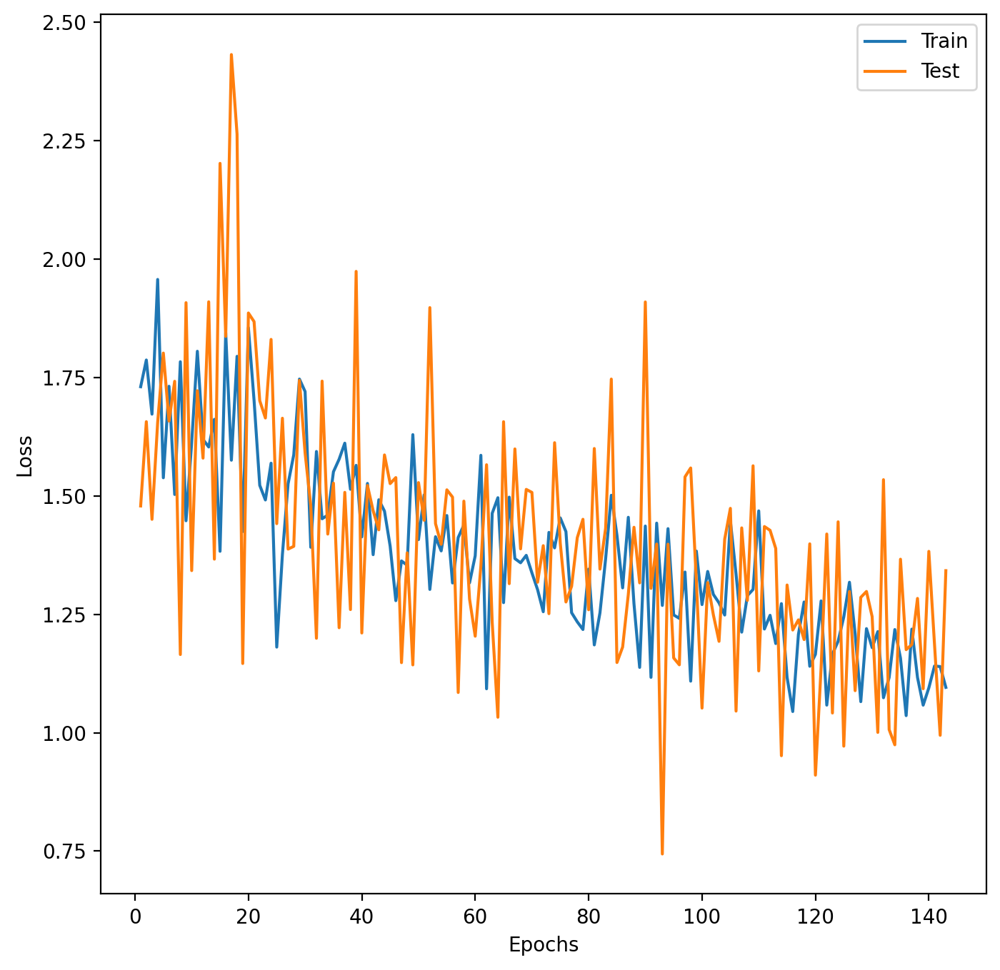

Training with KL weight decay: 0.5 and hidden layer sizes: [32] and learning rate: 1e-05
[001/2000] train_loss: 1.730349, test_loss: 1.478649, time: 0.04 s
[002/2000] train_loss: 1.786781, test_loss: 1.656614, time: 0.04 s
[003/2000] train_loss: 1.672526, test_loss: 1.450465, time: 0.04 s
[004/2000] train_loss: 1.956825, test_loss: 1.655357, time: 0.04 s
[005/2000] train_loss: 1.538195, test_loss: 1.801397, time: 0.04 s
[006/2000] train_loss: 1.731346, test_loss: 1.658009, time: 0.04 s
[007/2000] train_loss: 1.502876, test_loss: 1.741860, time: 0.04 s
[008/2000] train_loss: 1.783115, test_loss: 1.165073, time: 0.04 s
[009/2000] train_loss: 1.447434, test_loss: 1.907782, time: 0.04 s
[010/2000] train_loss: 1.612743, test_loss: 1.342239, time: 0.04 s
[011/2000] train_loss: 1.805224, test_loss: 1.721904, time: 0.04 s
[012/2000] train_loss: 1.619187, test_loss: 1.579612, time: 0.04 s
[013/2000] train_loss: 1.603169, test_loss: 1.909603, time: 0.04 s
[014/2000] train_loss: 1.661472, test_lo

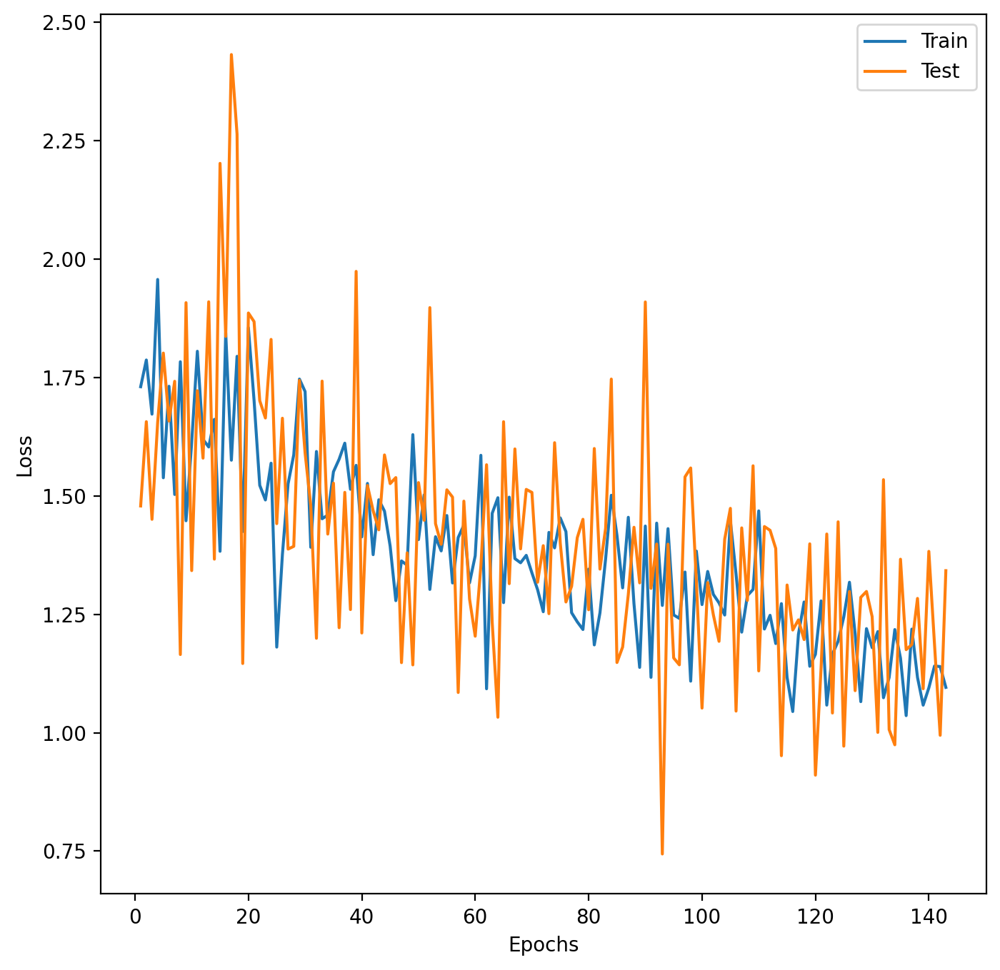

Training with KL weight decay: 0.75 and hidden layer sizes: [32] and learning rate: 1e-05
[001/2000] train_loss: 1.730349, test_loss: 1.478649, time: 0.04 s
[002/2000] train_loss: 1.786781, test_loss: 1.656614, time: 0.04 s
[003/2000] train_loss: 1.672526, test_loss: 1.450465, time: 0.04 s
[004/2000] train_loss: 1.956825, test_loss: 1.655357, time: 0.04 s
[005/2000] train_loss: 1.538195, test_loss: 1.801397, time: 0.04 s
[006/2000] train_loss: 1.731346, test_loss: 1.658009, time: 0.04 s
[007/2000] train_loss: 1.502876, test_loss: 1.741860, time: 0.04 s
[008/2000] train_loss: 1.783115, test_loss: 1.165073, time: 0.04 s
[009/2000] train_loss: 1.447434, test_loss: 1.907782, time: 0.04 s
[010/2000] train_loss: 1.612743, test_loss: 1.342239, time: 0.04 s
[011/2000] train_loss: 1.805224, test_loss: 1.721904, time: 0.04 s
[012/2000] train_loss: 1.619187, test_loss: 1.579612, time: 0.04 s
[013/2000] train_loss: 1.603169, test_loss: 1.909603, time: 0.04 s
[014/2000] train_loss: 1.661472, test_l

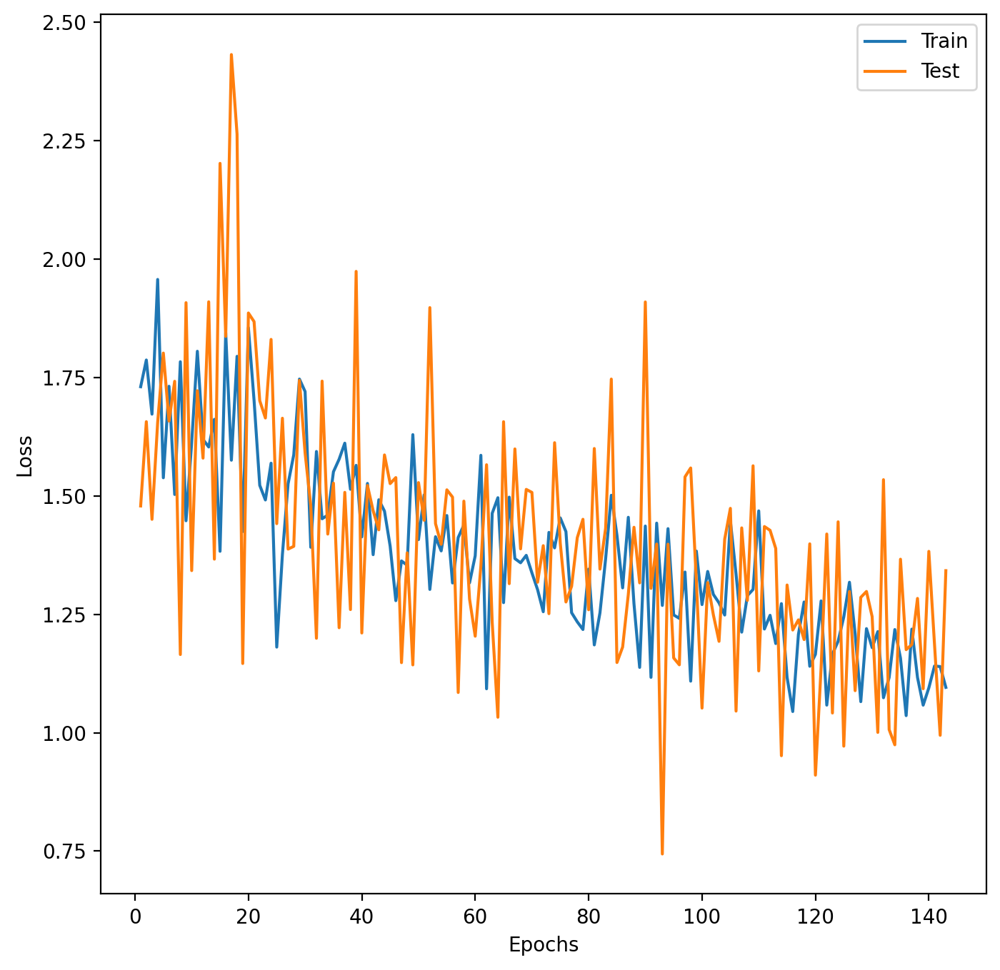

Training with KL weight decay: 1.0 and hidden layer sizes: [32] and learning rate: 1e-05
[001/2000] train_loss: 1.730349, test_loss: 1.478649, time: 0.04 s
[002/2000] train_loss: 1.786781, test_loss: 1.656614, time: 0.04 s
[003/2000] train_loss: 1.672526, test_loss: 1.450465, time: 0.04 s
[004/2000] train_loss: 1.956825, test_loss: 1.655357, time: 0.04 s
[005/2000] train_loss: 1.538195, test_loss: 1.801397, time: 0.04 s
[006/2000] train_loss: 1.731346, test_loss: 1.658009, time: 0.04 s
[007/2000] train_loss: 1.502876, test_loss: 1.741860, time: 0.04 s
[008/2000] train_loss: 1.783115, test_loss: 1.165073, time: 0.04 s
[009/2000] train_loss: 1.447434, test_loss: 1.907782, time: 0.05 s
[010/2000] train_loss: 1.612743, test_loss: 1.342239, time: 0.04 s
[011/2000] train_loss: 1.805224, test_loss: 1.721904, time: 0.04 s
[012/2000] train_loss: 1.619187, test_loss: 1.579612, time: 0.04 s
[013/2000] train_loss: 1.603169, test_loss: 1.909603, time: 0.04 s
[014/2000] train_loss: 1.661472, test_lo

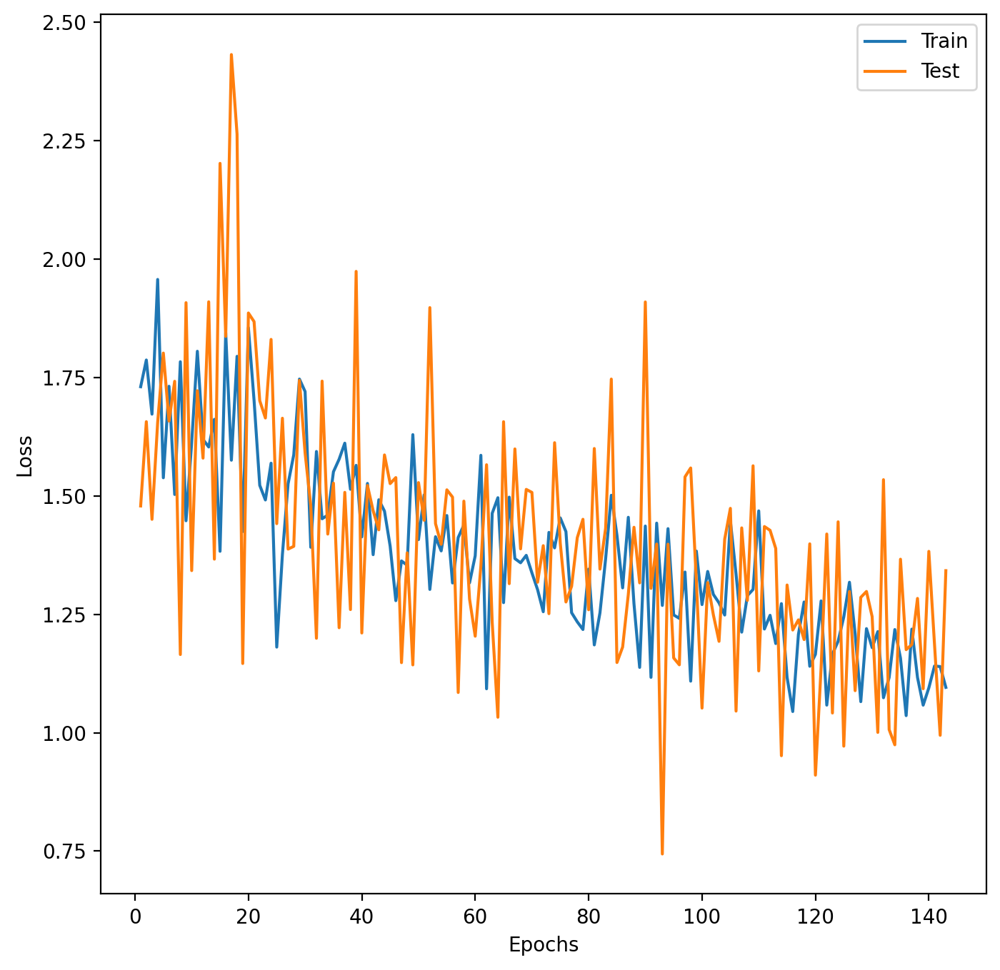

Training with KL weight decay: 0.0 and hidden layer sizes: [64] and learning rate: 1e-05
[001/2000] train_loss: 1.525603, test_loss: 1.335257, time: 0.05 s
[002/2000] train_loss: 1.463769, test_loss: 1.299015, time: 0.04 s
[003/2000] train_loss: 1.320515, test_loss: 1.281704, time: 0.04 s
[004/2000] train_loss: 1.331971, test_loss: 1.140435, time: 0.04 s
[005/2000] train_loss: 1.401076, test_loss: 1.381074, time: 0.04 s
[006/2000] train_loss: 1.357235, test_loss: 1.785046, time: 0.04 s
[007/2000] train_loss: 1.296678, test_loss: 1.327742, time: 0.04 s
[008/2000] train_loss: 1.718605, test_loss: 1.032123, time: 0.04 s
[009/2000] train_loss: 1.361754, test_loss: 1.275708, time: 0.04 s
[010/2000] train_loss: 1.411137, test_loss: 1.244254, time: 0.04 s
[011/2000] train_loss: 1.342788, test_loss: 1.050060, time: 0.04 s
[012/2000] train_loss: 1.573000, test_loss: 1.172737, time: 0.04 s
[013/2000] train_loss: 1.457601, test_loss: 1.424530, time: 0.04 s
[014/2000] train_loss: 1.201739, test_lo

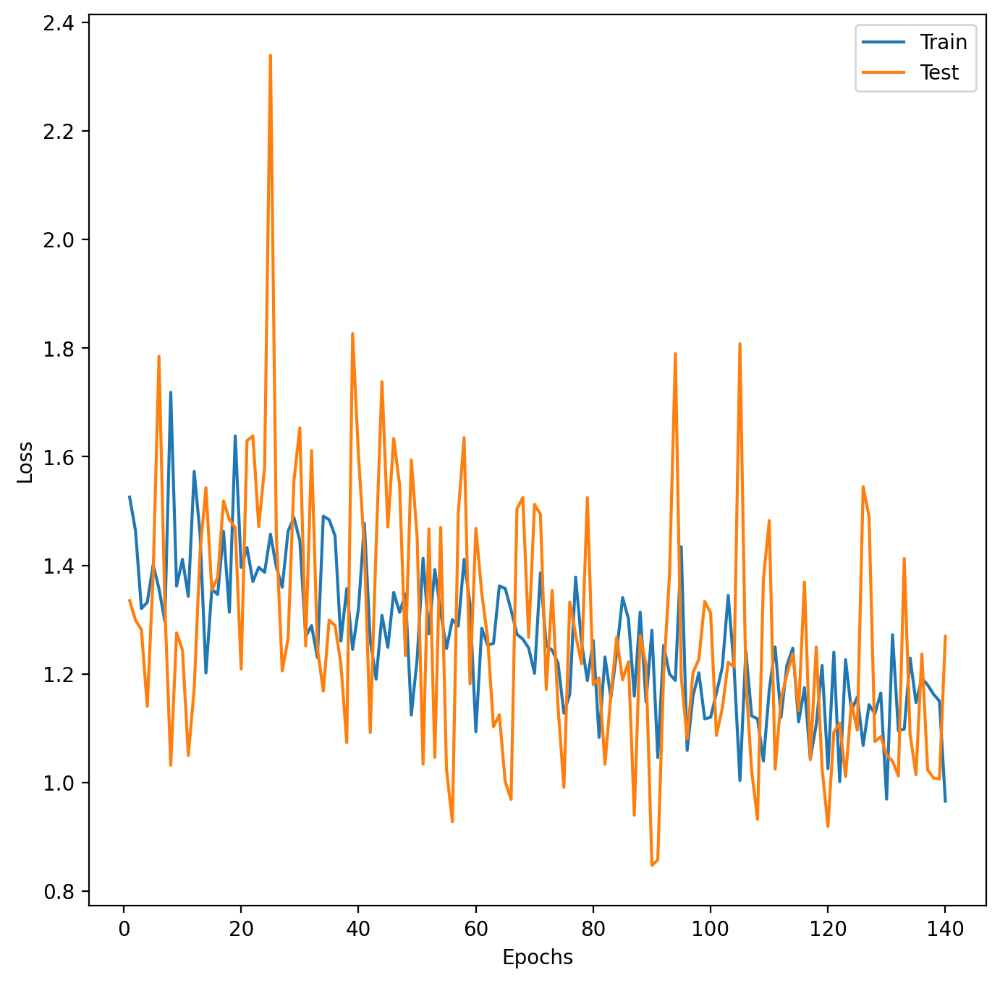

Training with KL weight decay: 0.25 and hidden layer sizes: [64] and learning rate: 1e-05
[001/2000] train_loss: 1.525603, test_loss: 1.335257, time: 0.12 s
[002/2000] train_loss: 1.463769, test_loss: 1.299015, time: 0.05 s
[003/2000] train_loss: 1.320515, test_loss: 1.281704, time: 0.04 s
[004/2000] train_loss: 1.331971, test_loss: 1.140435, time: 0.04 s
[005/2000] train_loss: 1.401076, test_loss: 1.381074, time: 0.04 s
[006/2000] train_loss: 1.357235, test_loss: 1.785046, time: 0.04 s
[007/2000] train_loss: 1.296678, test_loss: 1.327742, time: 0.04 s
[008/2000] train_loss: 1.718605, test_loss: 1.032123, time: 0.04 s
[009/2000] train_loss: 1.361754, test_loss: 1.275708, time: 0.04 s
[010/2000] train_loss: 1.411137, test_loss: 1.244254, time: 0.04 s
[011/2000] train_loss: 1.342788, test_loss: 1.050060, time: 0.04 s
[012/2000] train_loss: 1.573000, test_loss: 1.172737, time: 0.04 s
[013/2000] train_loss: 1.457601, test_loss: 1.424530, time: 0.04 s
[014/2000] train_loss: 1.201739, test_l

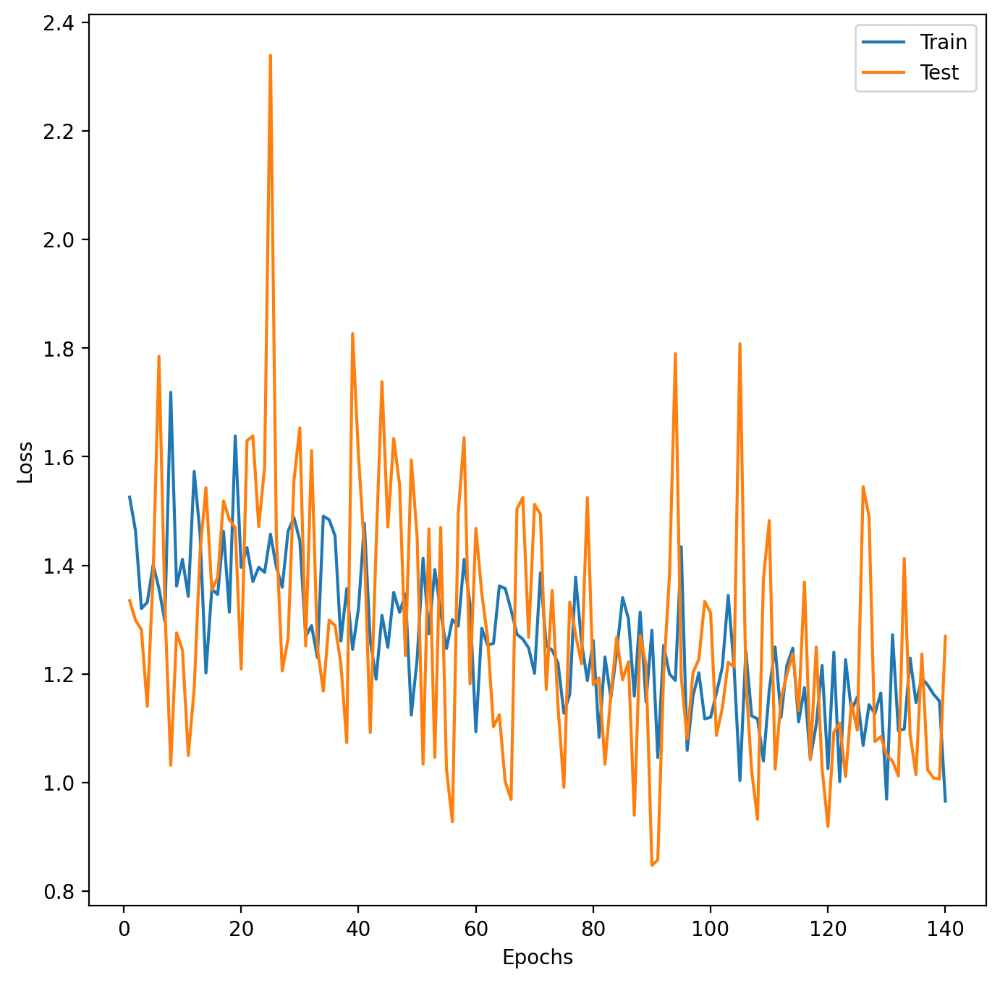

Training with KL weight decay: 0.5 and hidden layer sizes: [64] and learning rate: 1e-05
[001/2000] train_loss: 1.525603, test_loss: 1.335257, time: 0.04 s
[002/2000] train_loss: 1.463769, test_loss: 1.299015, time: 0.04 s
[003/2000] train_loss: 1.320515, test_loss: 1.281704, time: 0.04 s
[004/2000] train_loss: 1.331971, test_loss: 1.140435, time: 0.04 s
[005/2000] train_loss: 1.401076, test_loss: 1.381074, time: 0.04 s
[006/2000] train_loss: 1.357235, test_loss: 1.785046, time: 0.04 s
[007/2000] train_loss: 1.296678, test_loss: 1.327742, time: 0.04 s
[008/2000] train_loss: 1.718605, test_loss: 1.032123, time: 0.04 s
[009/2000] train_loss: 1.361754, test_loss: 1.275708, time: 0.04 s
[010/2000] train_loss: 1.411137, test_loss: 1.244254, time: 0.04 s
[011/2000] train_loss: 1.342788, test_loss: 1.050060, time: 0.04 s
[012/2000] train_loss: 1.573000, test_loss: 1.172737, time: 0.04 s
[013/2000] train_loss: 1.457601, test_loss: 1.424530, time: 0.04 s
[014/2000] train_loss: 1.201739, test_lo

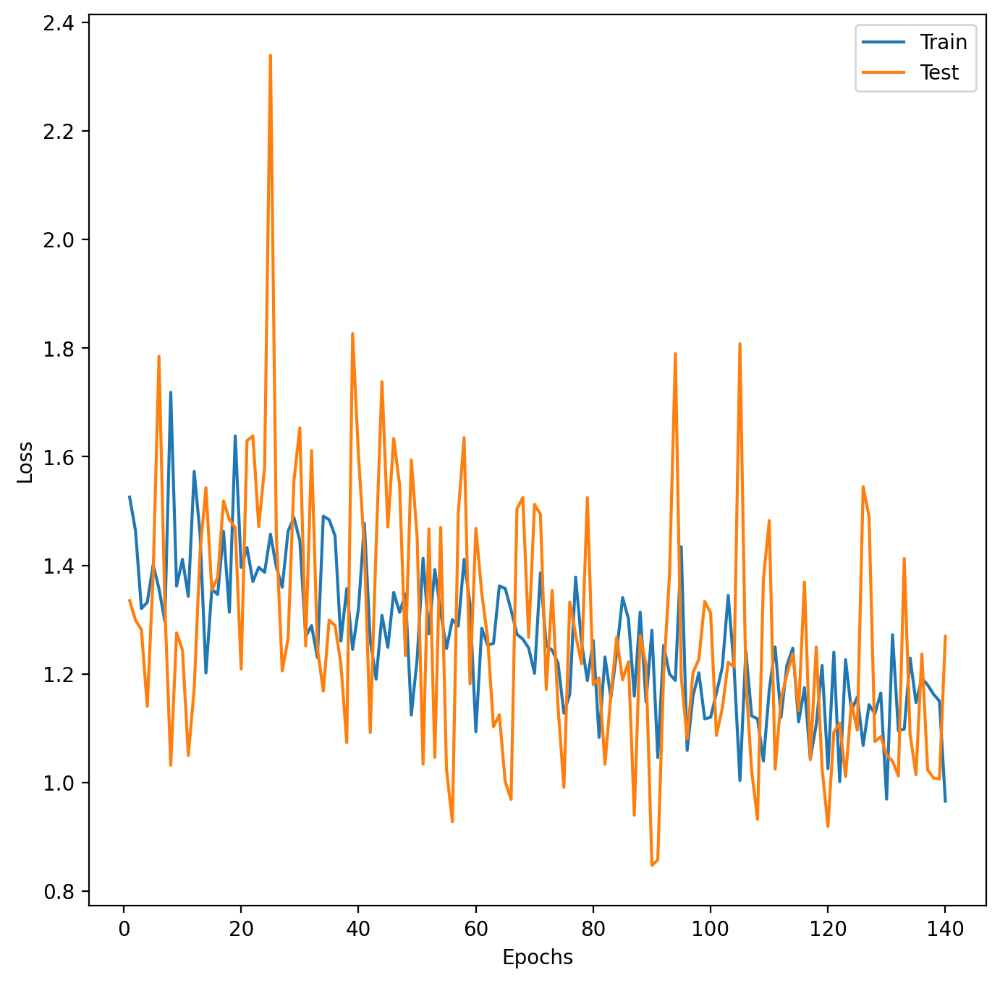

Training with KL weight decay: 0.75 and hidden layer sizes: [64] and learning rate: 1e-05
[001/2000] train_loss: 1.525603, test_loss: 1.335257, time: 0.04 s
[002/2000] train_loss: 1.463769, test_loss: 1.299015, time: 0.04 s
[003/2000] train_loss: 1.320515, test_loss: 1.281704, time: 0.04 s
[004/2000] train_loss: 1.331971, test_loss: 1.140435, time: 0.04 s
[005/2000] train_loss: 1.401076, test_loss: 1.381074, time: 0.04 s
[006/2000] train_loss: 1.357235, test_loss: 1.785046, time: 0.04 s
[007/2000] train_loss: 1.296678, test_loss: 1.327742, time: 0.04 s
[008/2000] train_loss: 1.718605, test_loss: 1.032123, time: 0.04 s
[009/2000] train_loss: 1.361754, test_loss: 1.275708, time: 0.04 s
[010/2000] train_loss: 1.411137, test_loss: 1.244254, time: 0.04 s
[011/2000] train_loss: 1.342788, test_loss: 1.050060, time: 0.04 s
[012/2000] train_loss: 1.573000, test_loss: 1.172737, time: 0.04 s
[013/2000] train_loss: 1.457601, test_loss: 1.424530, time: 0.04 s
[014/2000] train_loss: 1.201739, test_l

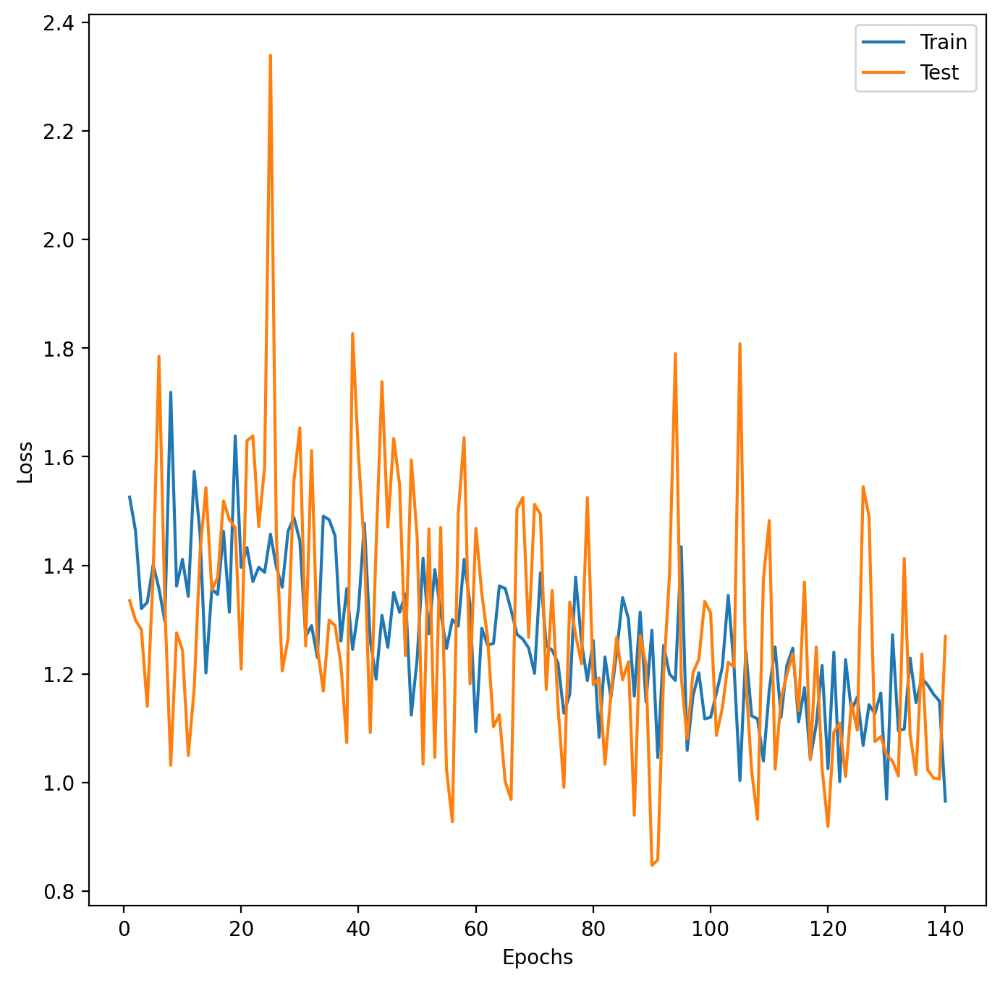

Training with KL weight decay: 1.0 and hidden layer sizes: [64] and learning rate: 1e-05
[001/2000] train_loss: 1.525603, test_loss: 1.335257, time: 0.05 s
[002/2000] train_loss: 1.463769, test_loss: 1.299015, time: 0.04 s
[003/2000] train_loss: 1.320515, test_loss: 1.281704, time: 0.05 s
[004/2000] train_loss: 1.331971, test_loss: 1.140435, time: 0.04 s
[005/2000] train_loss: 1.401076, test_loss: 1.381074, time: 0.04 s
[006/2000] train_loss: 1.357235, test_loss: 1.785046, time: 0.05 s
[007/2000] train_loss: 1.296678, test_loss: 1.327742, time: 0.05 s
[008/2000] train_loss: 1.718605, test_loss: 1.032123, time: 0.04 s
[009/2000] train_loss: 1.361754, test_loss: 1.275708, time: 0.04 s
[010/2000] train_loss: 1.411137, test_loss: 1.244254, time: 0.05 s
[011/2000] train_loss: 1.342788, test_loss: 1.050060, time: 0.04 s
[012/2000] train_loss: 1.573000, test_loss: 1.172737, time: 0.04 s
[013/2000] train_loss: 1.457601, test_loss: 1.424530, time: 0.04 s
[014/2000] train_loss: 1.201739, test_lo

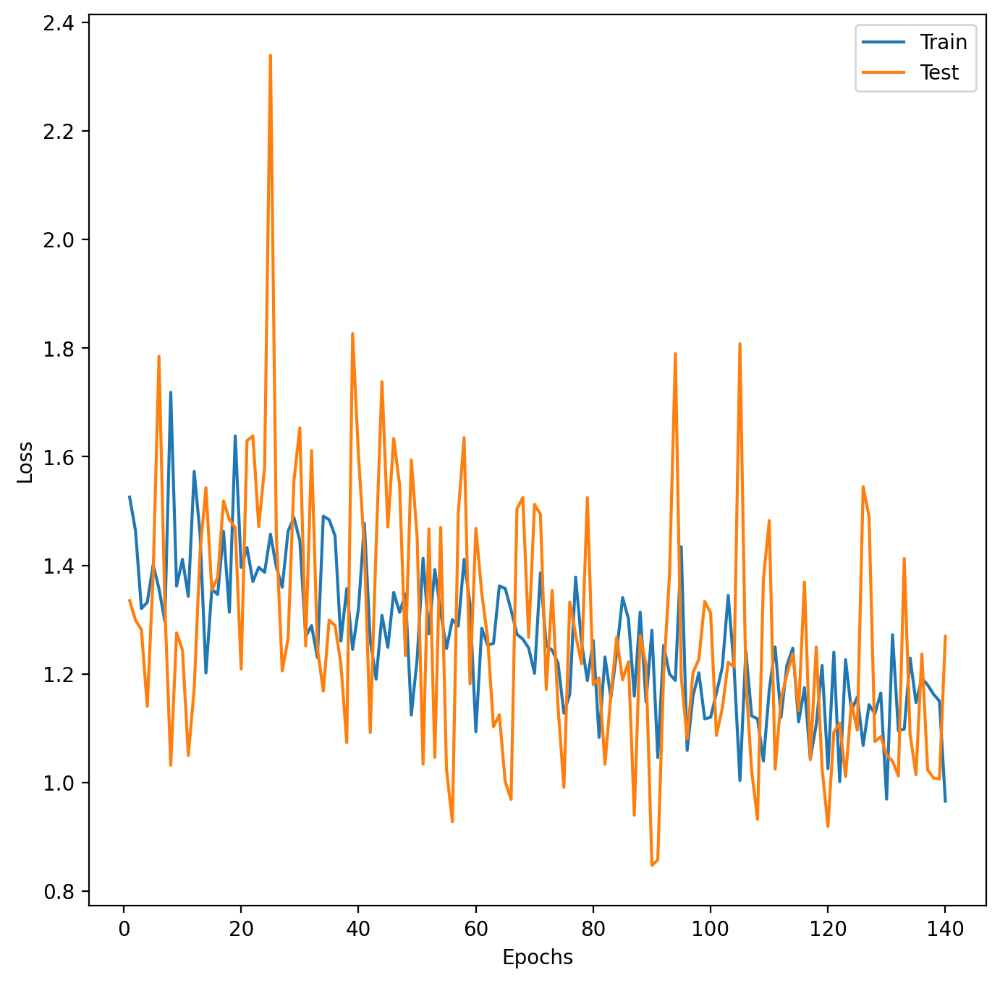

Training with KL weight decay: 0.0 and hidden layer sizes: [16, 4] and learning rate: 1e-05
[001/2000] train_loss: 0.857535, test_loss: 0.780726, time: 0.11 s
[002/2000] train_loss: 0.917918, test_loss: 0.853373, time: 0.08 s
[003/2000] train_loss: 0.877728, test_loss: 0.802509, time: 0.27 s
[004/2000] train_loss: 0.863465, test_loss: 0.722881, time: 0.10 s
[005/2000] train_loss: 0.876350, test_loss: 0.769758, time: 0.08 s
[006/2000] train_loss: 0.823315, test_loss: 0.796484, time: 0.09 s
[007/2000] train_loss: 0.800230, test_loss: 0.741397, time: 0.09 s
[008/2000] train_loss: 0.882005, test_loss: 0.683322, time: 0.09 s
[009/2000] train_loss: 0.827044, test_loss: 0.770633, time: 0.12 s
[010/2000] train_loss: 0.782545, test_loss: 0.773504, time: 0.09 s
[011/2000] train_loss: 0.893642, test_loss: 0.823961, time: 0.08 s
[012/2000] train_loss: 0.834498, test_loss: 0.774846, time: 0.10 s
[013/2000] train_loss: 0.812330, test_loss: 0.793805, time: 0.10 s
[014/2000] train_loss: 0.834018, test

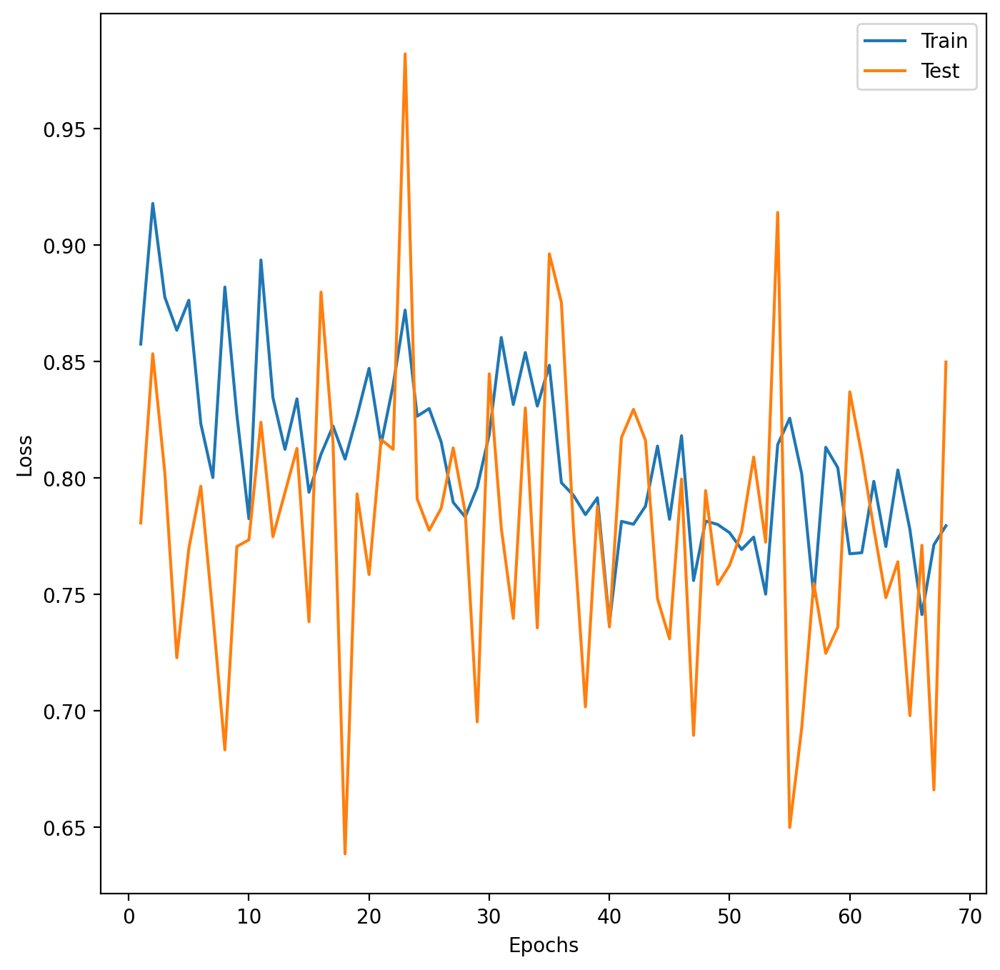

Training with KL weight decay: 0.25 and hidden layer sizes: [16, 4] and learning rate: 1e-05
[001/2000] train_loss: 0.857535, test_loss: 0.780726, time: 0.13 s
[002/2000] train_loss: 0.917918, test_loss: 0.853373, time: 0.09 s
[003/2000] train_loss: 0.877728, test_loss: 0.802509, time: 0.09 s
[004/2000] train_loss: 0.863465, test_loss: 0.722881, time: 0.08 s
[005/2000] train_loss: 0.876350, test_loss: 0.769758, time: 0.09 s
[006/2000] train_loss: 0.823315, test_loss: 0.796484, time: 0.09 s
[007/2000] train_loss: 0.800230, test_loss: 0.741397, time: 0.09 s
[008/2000] train_loss: 0.882005, test_loss: 0.683322, time: 0.09 s
[009/2000] train_loss: 0.827044, test_loss: 0.770633, time: 0.09 s
[010/2000] train_loss: 0.782545, test_loss: 0.773504, time: 0.11 s
[011/2000] train_loss: 0.893642, test_loss: 0.823961, time: 0.11 s
[012/2000] train_loss: 0.834498, test_loss: 0.774846, time: 0.10 s
[013/2000] train_loss: 0.812330, test_loss: 0.793805, time: 0.09 s
[014/2000] train_loss: 0.834018, tes

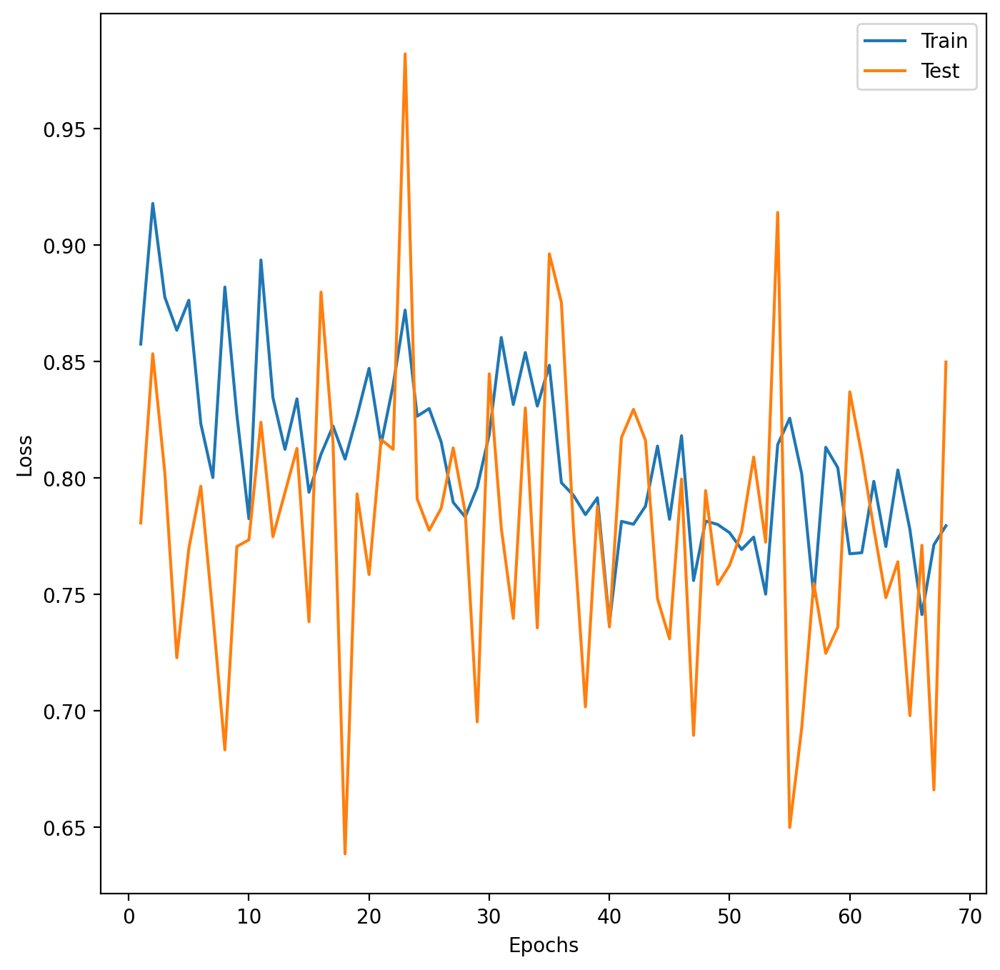

Training with KL weight decay: 0.5 and hidden layer sizes: [16, 4] and learning rate: 1e-05
[001/2000] train_loss: 0.857535, test_loss: 0.780726, time: 0.15 s
[002/2000] train_loss: 0.917918, test_loss: 0.853373, time: 0.09 s
[003/2000] train_loss: 0.877728, test_loss: 0.802509, time: 0.09 s
[004/2000] train_loss: 0.863465, test_loss: 0.722881, time: 0.09 s
[005/2000] train_loss: 0.876350, test_loss: 0.769758, time: 0.09 s
[006/2000] train_loss: 0.823315, test_loss: 0.796484, time: 0.09 s
[007/2000] train_loss: 0.800230, test_loss: 0.741397, time: 0.09 s
[008/2000] train_loss: 0.882005, test_loss: 0.683322, time: 0.09 s
[009/2000] train_loss: 0.827044, test_loss: 0.770633, time: 0.08 s
[010/2000] train_loss: 0.782545, test_loss: 0.773504, time: 0.08 s
[011/2000] train_loss: 0.893642, test_loss: 0.823961, time: 0.09 s
[012/2000] train_loss: 0.834498, test_loss: 0.774846, time: 0.09 s
[013/2000] train_loss: 0.812330, test_loss: 0.793805, time: 0.09 s
[014/2000] train_loss: 0.834018, test

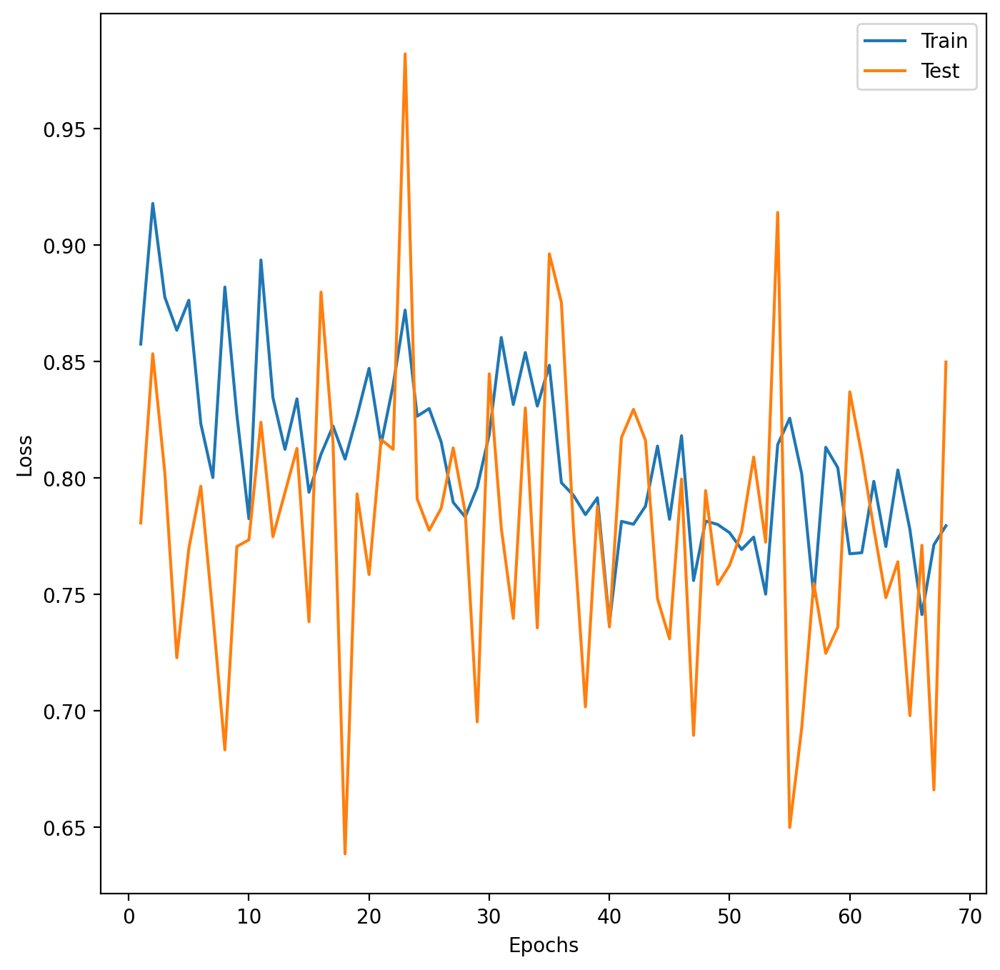

Training with KL weight decay: 0.75 and hidden layer sizes: [16, 4] and learning rate: 1e-05
[001/2000] train_loss: 0.857535, test_loss: 0.780726, time: 0.15 s
[002/2000] train_loss: 0.917918, test_loss: 0.853373, time: 0.10 s
[003/2000] train_loss: 0.877728, test_loss: 0.802509, time: 0.09 s
[004/2000] train_loss: 0.863465, test_loss: 0.722881, time: 0.12 s
[005/2000] train_loss: 0.876350, test_loss: 0.769758, time: 0.09 s
[006/2000] train_loss: 0.823315, test_loss: 0.796484, time: 0.09 s
[007/2000] train_loss: 0.800230, test_loss: 0.741397, time: 0.09 s
[008/2000] train_loss: 0.882005, test_loss: 0.683322, time: 0.09 s
[009/2000] train_loss: 0.827044, test_loss: 0.770633, time: 0.09 s
[010/2000] train_loss: 0.782545, test_loss: 0.773504, time: 0.09 s
[011/2000] train_loss: 0.893642, test_loss: 0.823961, time: 0.09 s
[012/2000] train_loss: 0.834498, test_loss: 0.774846, time: 0.08 s
[013/2000] train_loss: 0.812330, test_loss: 0.793805, time: 0.09 s
[014/2000] train_loss: 0.834018, tes

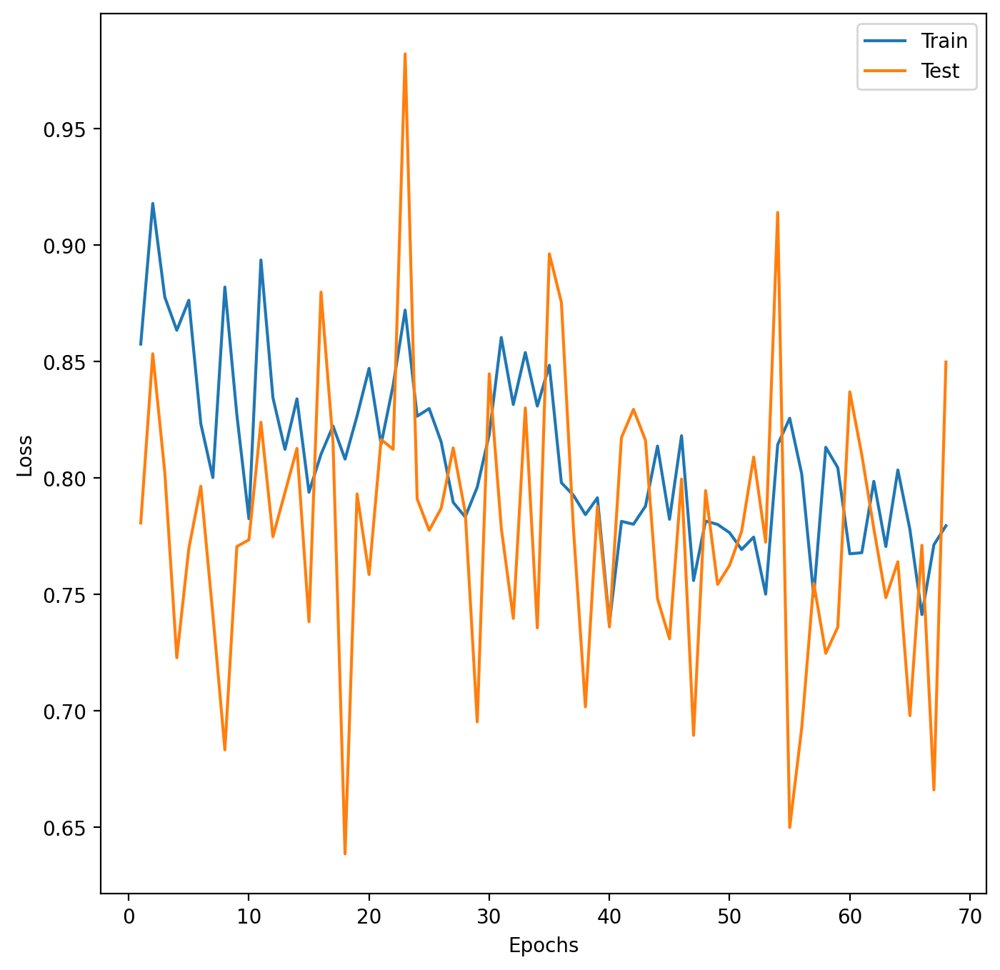

Training with KL weight decay: 1.0 and hidden layer sizes: [16, 4] and learning rate: 1e-05
[001/2000] train_loss: 0.857535, test_loss: 0.780726, time: 0.19 s
[002/2000] train_loss: 0.917918, test_loss: 0.853373, time: 0.14 s
[003/2000] train_loss: 0.877728, test_loss: 0.802509, time: 0.11 s
[004/2000] train_loss: 0.863465, test_loss: 0.722881, time: 0.10 s
[005/2000] train_loss: 0.876350, test_loss: 0.769758, time: 0.12 s
[006/2000] train_loss: 0.823315, test_loss: 0.796484, time: 0.09 s
[007/2000] train_loss: 0.800230, test_loss: 0.741397, time: 0.09 s
[008/2000] train_loss: 0.882005, test_loss: 0.683322, time: 0.11 s
[009/2000] train_loss: 0.827044, test_loss: 0.770633, time: 0.10 s
[010/2000] train_loss: 0.782545, test_loss: 0.773504, time: 0.09 s
[011/2000] train_loss: 0.893642, test_loss: 0.823961, time: 0.09 s
[012/2000] train_loss: 0.834498, test_loss: 0.774846, time: 0.09 s
[013/2000] train_loss: 0.812330, test_loss: 0.793805, time: 0.09 s
[014/2000] train_loss: 0.834018, test

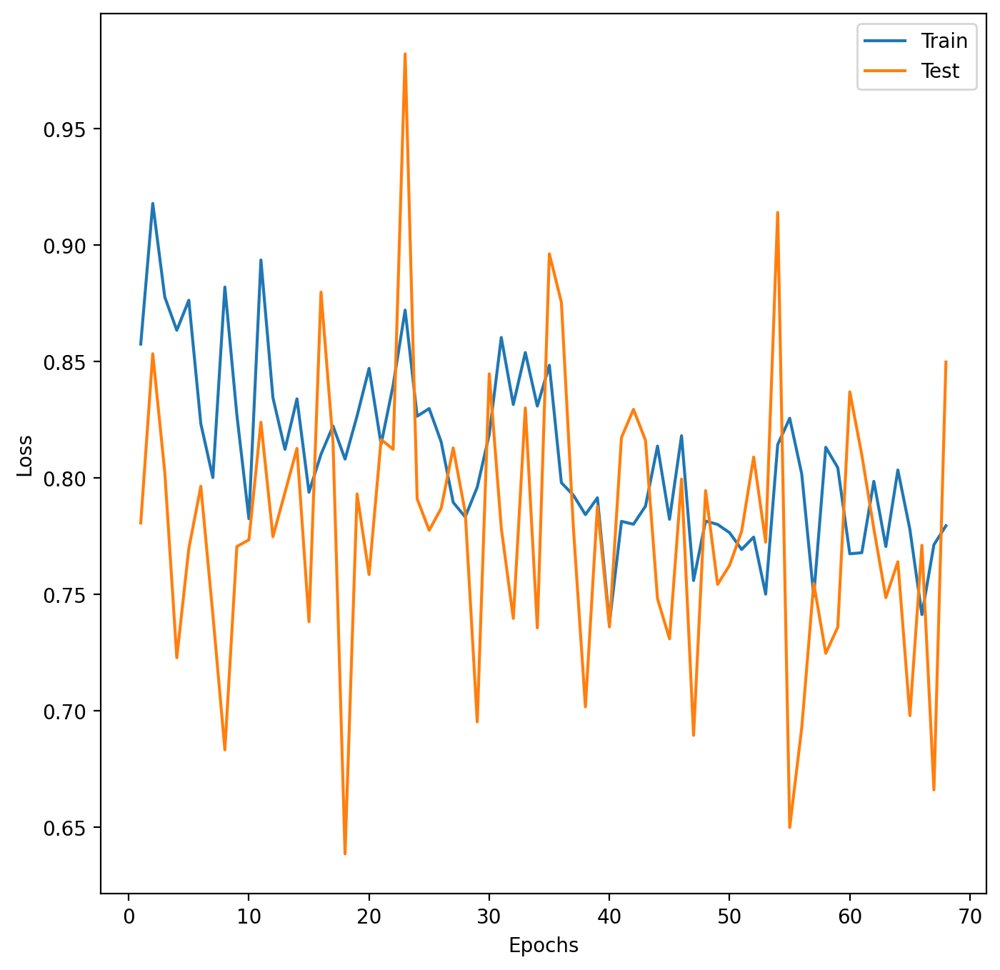

Training with KL weight decay: 0.0 and hidden layer sizes: [32, 8] and learning rate: 1e-05
[001/2000] train_loss: 1.252994, test_loss: 1.216945, time: 0.13 s
[002/2000] train_loss: 1.260450, test_loss: 1.065159, time: 0.12 s
[003/2000] train_loss: 1.212498, test_loss: 0.888941, time: 0.10 s
[004/2000] train_loss: 1.220679, test_loss: 1.287846, time: 0.09 s
[005/2000] train_loss: 1.267465, test_loss: 1.016835, time: 0.09 s
[006/2000] train_loss: 1.255389, test_loss: 1.298102, time: 0.10 s
[007/2000] train_loss: 1.222933, test_loss: 1.204963, time: 0.09 s
[008/2000] train_loss: 1.201741, test_loss: 1.184963, time: 0.09 s
[009/2000] train_loss: 1.216683, test_loss: 1.119058, time: 0.10 s
[010/2000] train_loss: 1.246492, test_loss: 1.155884, time: 0.09 s
[011/2000] train_loss: 1.220846, test_loss: 1.028840, time: 0.12 s
[012/2000] train_loss: 1.195245, test_loss: 1.054777, time: 0.11 s
[013/2000] train_loss: 1.176462, test_loss: 0.995977, time: 0.12 s
[014/2000] train_loss: 1.207400, test

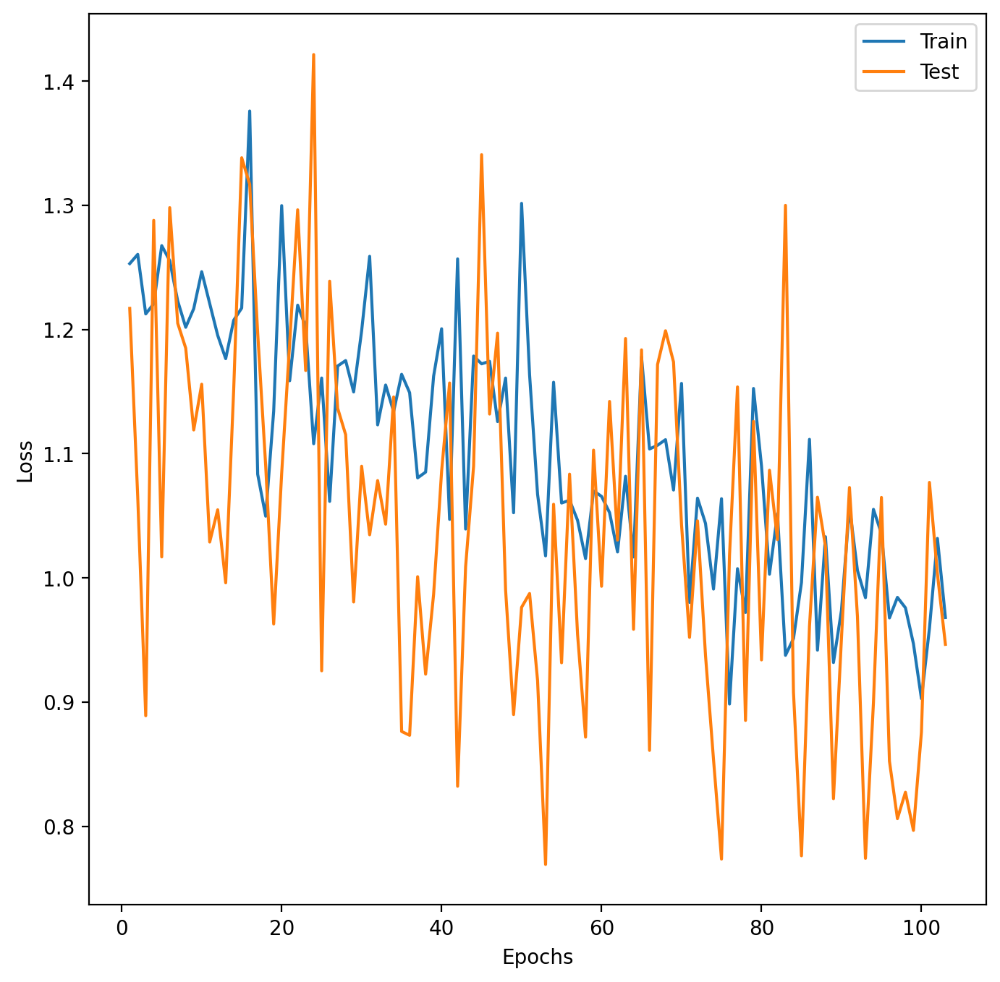

Training with KL weight decay: 0.25 and hidden layer sizes: [32, 8] and learning rate: 1e-05
[001/2000] train_loss: 1.252994, test_loss: 1.216945, time: 0.33 s
[002/2000] train_loss: 1.260450, test_loss: 1.065159, time: 0.08 s
[003/2000] train_loss: 1.212498, test_loss: 0.888941, time: 0.10 s
[004/2000] train_loss: 1.220679, test_loss: 1.287846, time: 0.11 s
[005/2000] train_loss: 1.267465, test_loss: 1.016835, time: 0.10 s
[006/2000] train_loss: 1.255389, test_loss: 1.298102, time: 0.09 s
[007/2000] train_loss: 1.222933, test_loss: 1.204963, time: 0.08 s
[008/2000] train_loss: 1.201741, test_loss: 1.184963, time: 0.09 s
[009/2000] train_loss: 1.216683, test_loss: 1.119058, time: 0.12 s
[010/2000] train_loss: 1.246492, test_loss: 1.155884, time: 0.12 s
[011/2000] train_loss: 1.220846, test_loss: 1.028840, time: 0.09 s
[012/2000] train_loss: 1.195245, test_loss: 1.054777, time: 0.11 s
[013/2000] train_loss: 1.176462, test_loss: 0.995977, time: 0.10 s
[014/2000] train_loss: 1.207400, tes

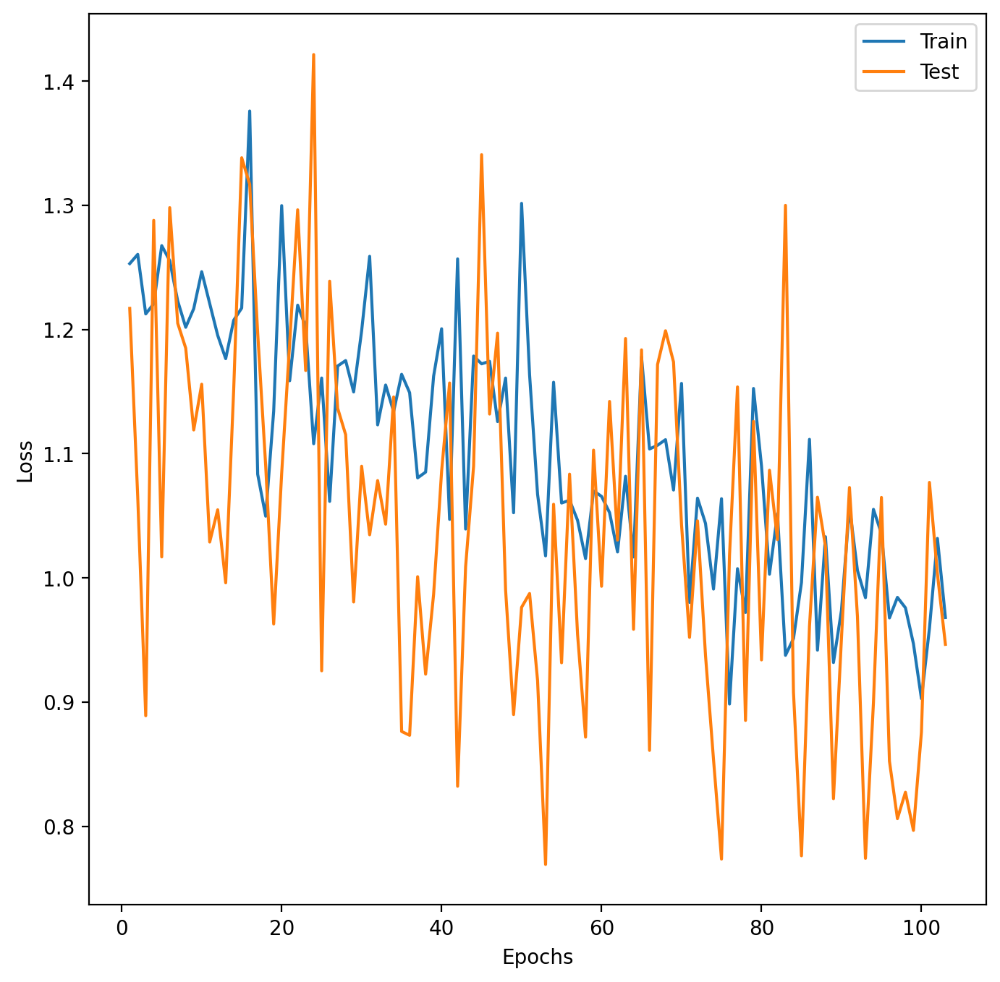

Training with KL weight decay: 0.5 and hidden layer sizes: [32, 8] and learning rate: 1e-05
[001/2000] train_loss: 1.252994, test_loss: 1.216945, time: 0.09 s
[002/2000] train_loss: 1.260450, test_loss: 1.065159, time: 0.11 s
[003/2000] train_loss: 1.212498, test_loss: 0.888941, time: 0.24 s
[004/2000] train_loss: 1.220679, test_loss: 1.287846, time: 0.09 s
[005/2000] train_loss: 1.267465, test_loss: 1.016835, time: 0.12 s
[006/2000] train_loss: 1.255389, test_loss: 1.298102, time: 0.13 s
[007/2000] train_loss: 1.222933, test_loss: 1.204963, time: 0.12 s
[008/2000] train_loss: 1.201741, test_loss: 1.184963, time: 0.11 s
[009/2000] train_loss: 1.216683, test_loss: 1.119058, time: 0.10 s
[010/2000] train_loss: 1.246492, test_loss: 1.155884, time: 0.11 s
[011/2000] train_loss: 1.220846, test_loss: 1.028840, time: 0.13 s
[012/2000] train_loss: 1.195245, test_loss: 1.054777, time: 0.10 s
[013/2000] train_loss: 1.176462, test_loss: 0.995977, time: 0.10 s
[014/2000] train_loss: 1.207400, test

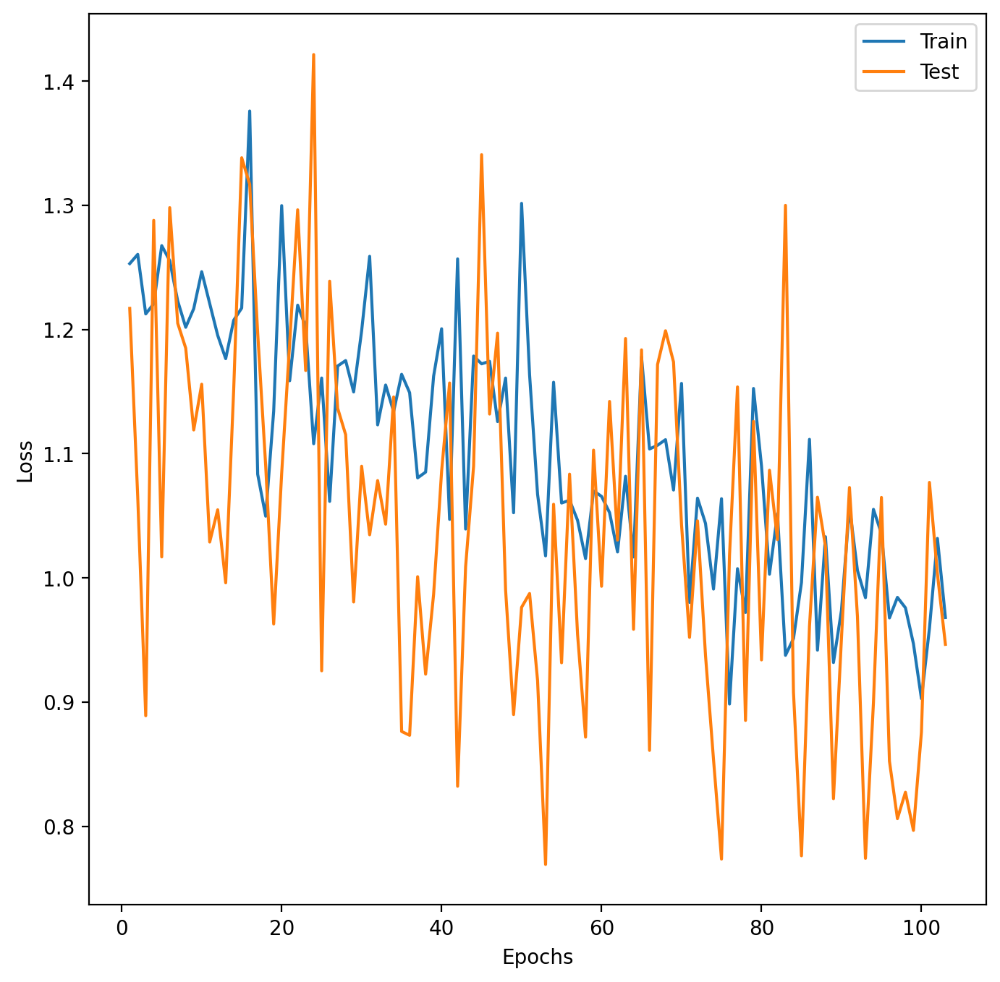

Training with KL weight decay: 0.75 and hidden layer sizes: [32, 8] and learning rate: 1e-05
[001/2000] train_loss: 1.252994, test_loss: 1.216945, time: 0.13 s
[002/2000] train_loss: 1.260450, test_loss: 1.065159, time: 0.09 s
[003/2000] train_loss: 1.212498, test_loss: 0.888941, time: 0.11 s
[004/2000] train_loss: 1.220679, test_loss: 1.287846, time: 0.14 s
[005/2000] train_loss: 1.267465, test_loss: 1.016835, time: 0.10 s
[006/2000] train_loss: 1.255389, test_loss: 1.298102, time: 0.10 s
[007/2000] train_loss: 1.222933, test_loss: 1.204963, time: 0.08 s
[008/2000] train_loss: 1.201741, test_loss: 1.184963, time: 0.08 s
[009/2000] train_loss: 1.216683, test_loss: 1.119058, time: 0.08 s
[010/2000] train_loss: 1.246492, test_loss: 1.155884, time: 0.08 s
[011/2000] train_loss: 1.220846, test_loss: 1.028840, time: 0.08 s
[012/2000] train_loss: 1.195245, test_loss: 1.054777, time: 0.07 s
[013/2000] train_loss: 1.176462, test_loss: 0.995977, time: 0.08 s
[014/2000] train_loss: 1.207400, tes

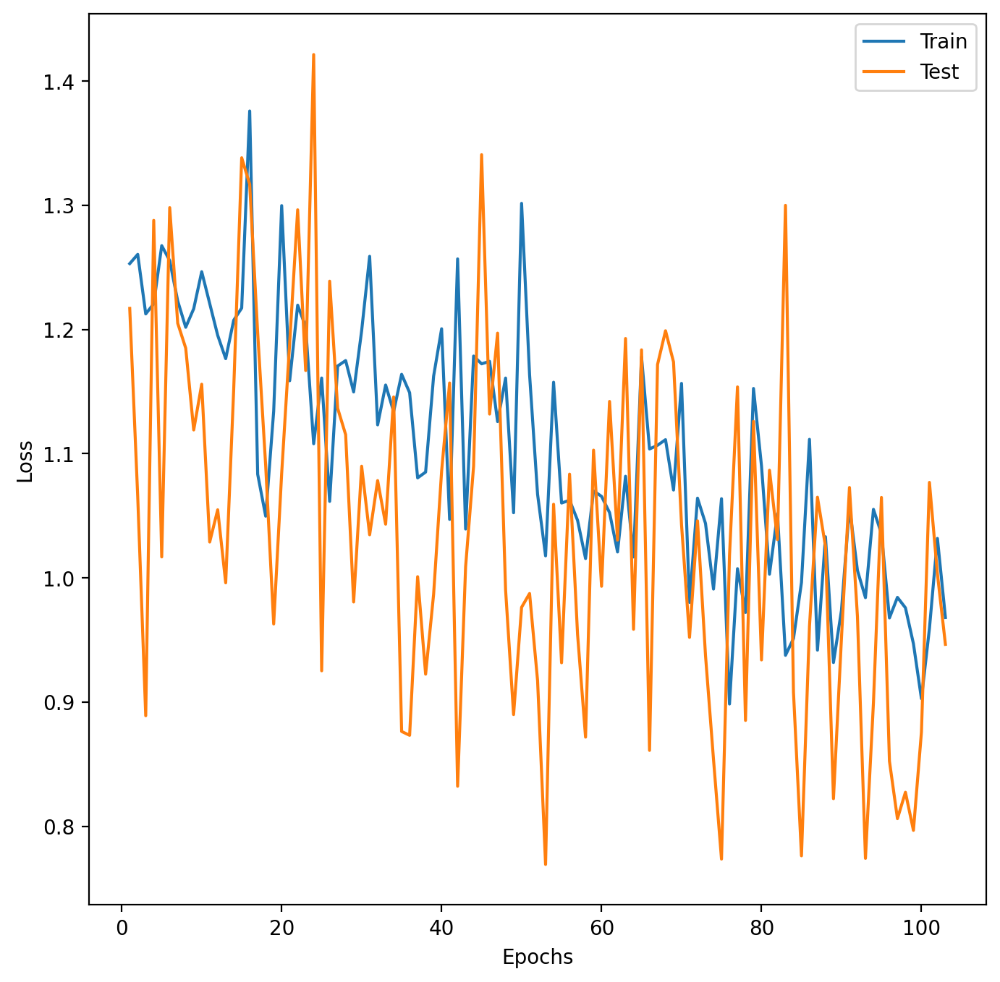

Training with KL weight decay: 1.0 and hidden layer sizes: [32, 8] and learning rate: 1e-05
[001/2000] train_loss: 1.252994, test_loss: 1.216945, time: 0.09 s
[002/2000] train_loss: 1.260450, test_loss: 1.065159, time: 0.09 s
[003/2000] train_loss: 1.212498, test_loss: 0.888941, time: 0.22 s
[004/2000] train_loss: 1.220679, test_loss: 1.287846, time: 0.13 s
[005/2000] train_loss: 1.267465, test_loss: 1.016835, time: 0.09 s
[006/2000] train_loss: 1.255389, test_loss: 1.298102, time: 0.08 s
[007/2000] train_loss: 1.222933, test_loss: 1.204963, time: 0.08 s
[008/2000] train_loss: 1.201741, test_loss: 1.184963, time: 0.10 s
[009/2000] train_loss: 1.216683, test_loss: 1.119058, time: 0.15 s
[010/2000] train_loss: 1.246492, test_loss: 1.155884, time: 0.11 s
[011/2000] train_loss: 1.220846, test_loss: 1.028840, time: 0.08 s
[012/2000] train_loss: 1.195245, test_loss: 1.054777, time: 0.12 s
[013/2000] train_loss: 1.176462, test_loss: 0.995977, time: 0.11 s
[014/2000] train_loss: 1.207400, test

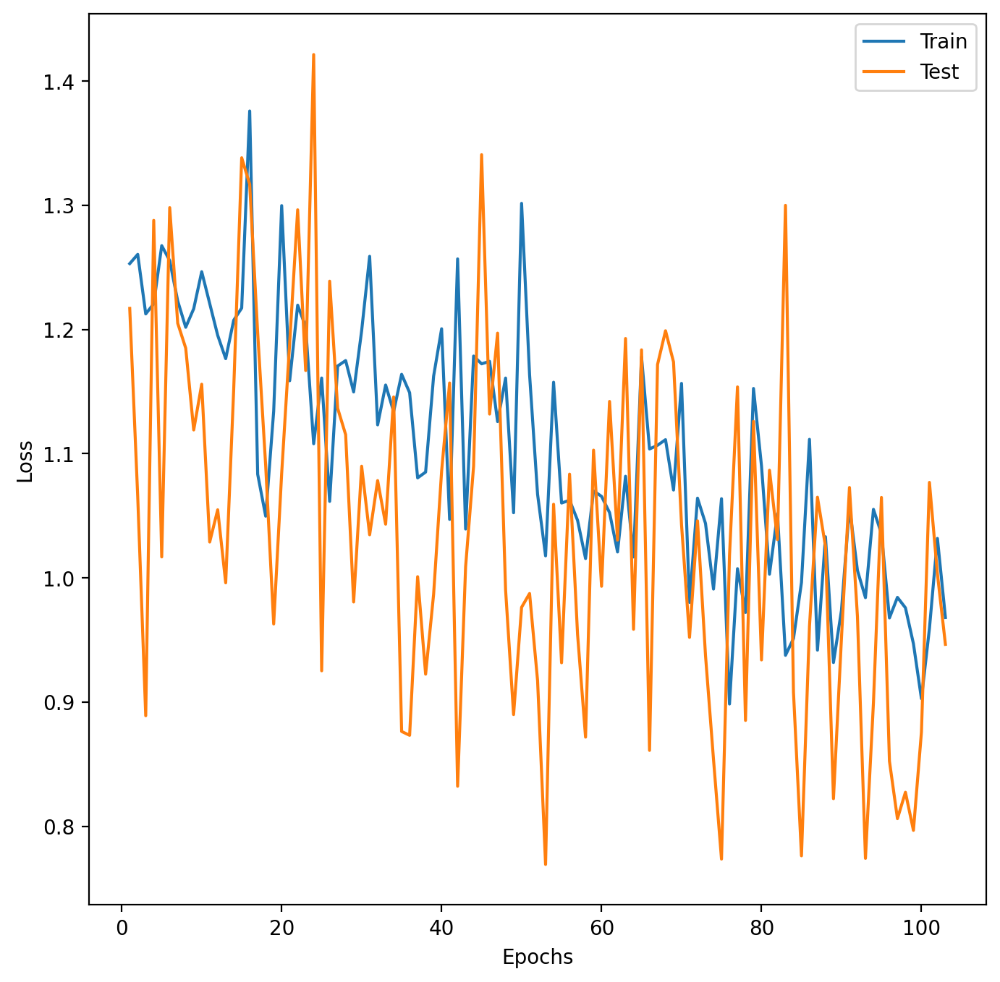

Training with KL weight decay: 0.0 and hidden layer sizes: [64, 16] and learning rate: 1e-05
[001/2000] train_loss: 1.565338, test_loss: 1.484145, time: 0.09 s
[002/2000] train_loss: 1.592506, test_loss: 1.388022, time: 0.08 s
[003/2000] train_loss: 1.424765, test_loss: 1.175904, time: 0.09 s
[004/2000] train_loss: 1.707220, test_loss: 1.236513, time: 0.08 s
[005/2000] train_loss: 1.676204, test_loss: 1.248653, time: 0.09 s
[006/2000] train_loss: 1.590395, test_loss: 1.469770, time: 0.09 s
[007/2000] train_loss: 1.663940, test_loss: 1.030198, time: 0.11 s
[008/2000] train_loss: 1.605027, test_loss: 1.421391, time: 0.10 s
[009/2000] train_loss: 1.555730, test_loss: 1.562917, time: 0.08 s
[010/2000] train_loss: 1.680505, test_loss: 1.062094, time: 0.08 s
[011/2000] train_loss: 1.647002, test_loss: 1.452652, time: 0.11 s
[012/2000] train_loss: 1.584280, test_loss: 1.062756, time: 0.09 s
[013/2000] train_loss: 1.515975, test_loss: 1.484780, time: 0.09 s
[014/2000] train_loss: 1.562553, tes

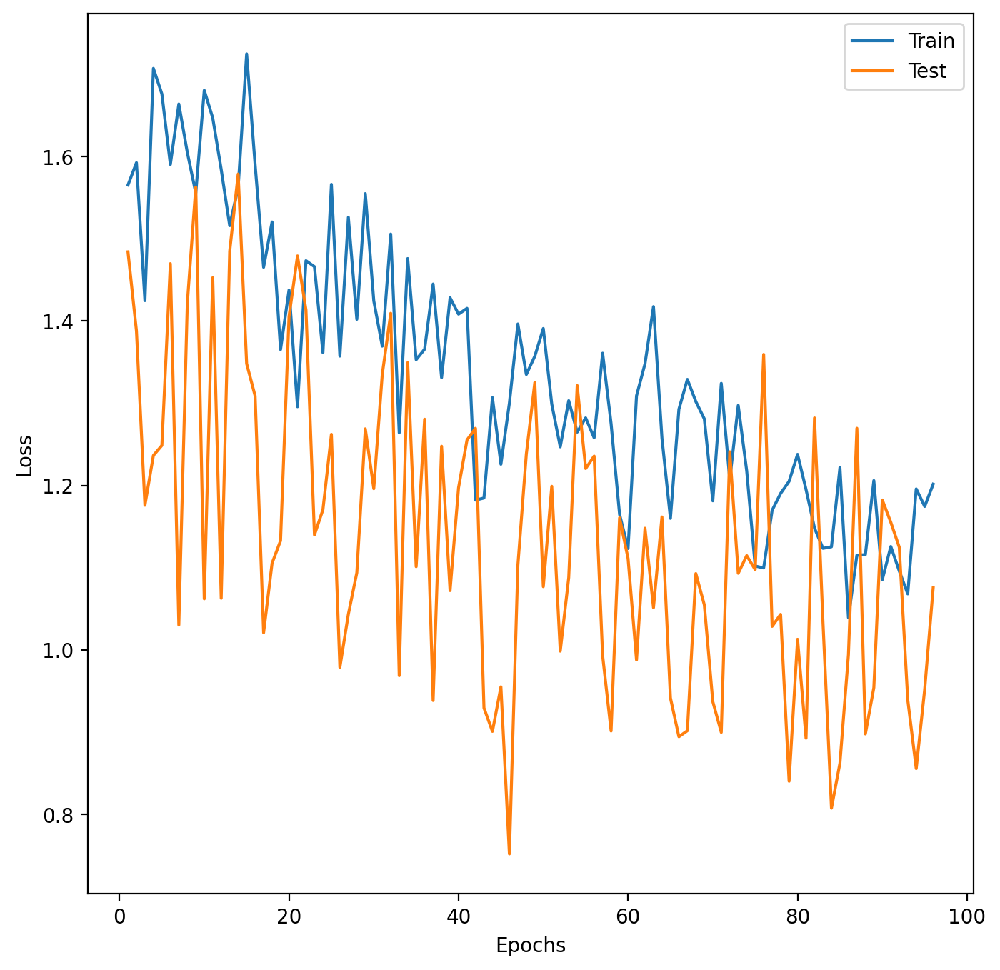

Training with KL weight decay: 0.25 and hidden layer sizes: [64, 16] and learning rate: 1e-05
[001/2000] train_loss: 1.565338, test_loss: 1.484145, time: 0.11 s
[002/2000] train_loss: 1.592506, test_loss: 1.388022, time: 0.10 s
[003/2000] train_loss: 1.424765, test_loss: 1.175904, time: 0.09 s
[004/2000] train_loss: 1.707220, test_loss: 1.236513, time: 0.18 s
[005/2000] train_loss: 1.676204, test_loss: 1.248653, time: 0.13 s
[006/2000] train_loss: 1.590395, test_loss: 1.469770, time: 0.14 s
[007/2000] train_loss: 1.663940, test_loss: 1.030198, time: 0.12 s
[008/2000] train_loss: 1.605027, test_loss: 1.421391, time: 0.08 s
[009/2000] train_loss: 1.555730, test_loss: 1.562917, time: 0.08 s
[010/2000] train_loss: 1.680505, test_loss: 1.062094, time: 0.15 s
[011/2000] train_loss: 1.647002, test_loss: 1.452652, time: 0.12 s
[012/2000] train_loss: 1.584280, test_loss: 1.062756, time: 0.09 s
[013/2000] train_loss: 1.515975, test_loss: 1.484780, time: 0.08 s
[014/2000] train_loss: 1.562553, te

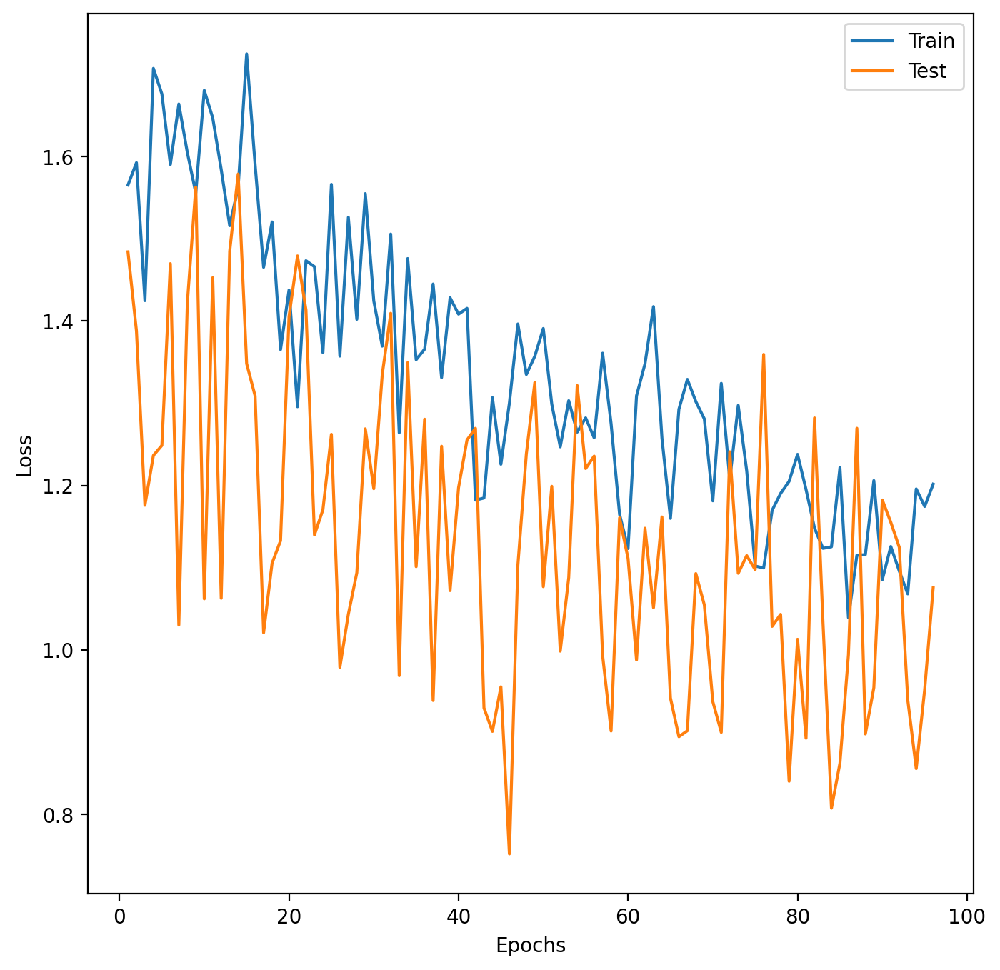

Training with KL weight decay: 0.5 and hidden layer sizes: [64, 16] and learning rate: 1e-05
[001/2000] train_loss: 1.565338, test_loss: 1.484145, time: 0.13 s
[002/2000] train_loss: 1.592506, test_loss: 1.388022, time: 0.20 s
[003/2000] train_loss: 1.424765, test_loss: 1.175904, time: 0.15 s
[004/2000] train_loss: 1.707220, test_loss: 1.236513, time: 0.11 s
[005/2000] train_loss: 1.676204, test_loss: 1.248653, time: 0.24 s
[006/2000] train_loss: 1.590395, test_loss: 1.469770, time: 0.21 s
[007/2000] train_loss: 1.663940, test_loss: 1.030198, time: 0.15 s
[008/2000] train_loss: 1.605027, test_loss: 1.421391, time: 0.10 s
[009/2000] train_loss: 1.555730, test_loss: 1.562917, time: 0.09 s
[010/2000] train_loss: 1.680505, test_loss: 1.062094, time: 0.09 s
[011/2000] train_loss: 1.647002, test_loss: 1.452652, time: 0.09 s
[012/2000] train_loss: 1.584280, test_loss: 1.062756, time: 0.09 s
[013/2000] train_loss: 1.515975, test_loss: 1.484780, time: 0.10 s
[014/2000] train_loss: 1.562553, tes

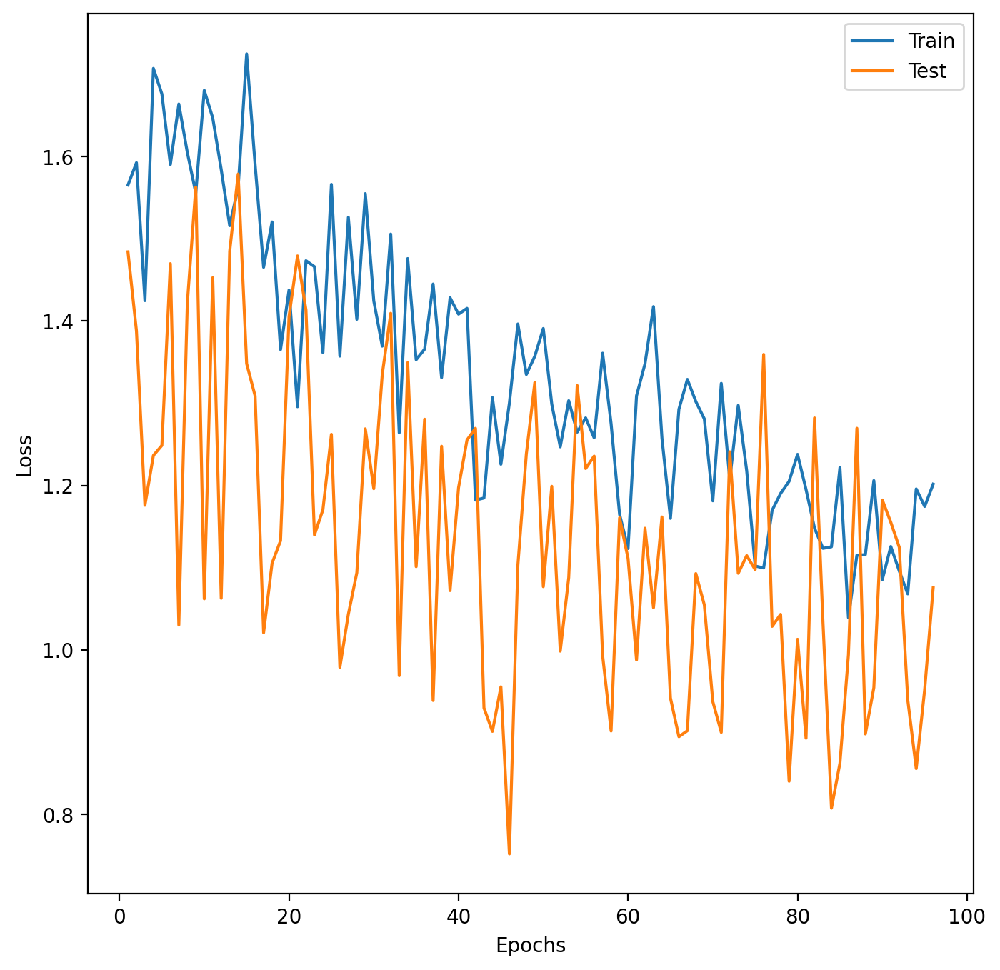

Training with KL weight decay: 0.75 and hidden layer sizes: [64, 16] and learning rate: 1e-05
[001/2000] train_loss: 1.565338, test_loss: 1.484145, time: 0.21 s
[002/2000] train_loss: 1.592506, test_loss: 1.388022, time: 0.10 s
[003/2000] train_loss: 1.424765, test_loss: 1.175904, time: 0.09 s
[004/2000] train_loss: 1.707220, test_loss: 1.236513, time: 0.09 s
[005/2000] train_loss: 1.676204, test_loss: 1.248653, time: 0.12 s
[006/2000] train_loss: 1.590395, test_loss: 1.469770, time: 0.13 s
[007/2000] train_loss: 1.663940, test_loss: 1.030198, time: 0.09 s
[008/2000] train_loss: 1.605027, test_loss: 1.421391, time: 0.10 s
[009/2000] train_loss: 1.555730, test_loss: 1.562917, time: 0.12 s
[010/2000] train_loss: 1.680505, test_loss: 1.062094, time: 0.11 s
[011/2000] train_loss: 1.647002, test_loss: 1.452652, time: 0.09 s
[012/2000] train_loss: 1.584280, test_loss: 1.062756, time: 0.09 s
[013/2000] train_loss: 1.515975, test_loss: 1.484780, time: 0.09 s
[014/2000] train_loss: 1.562553, te

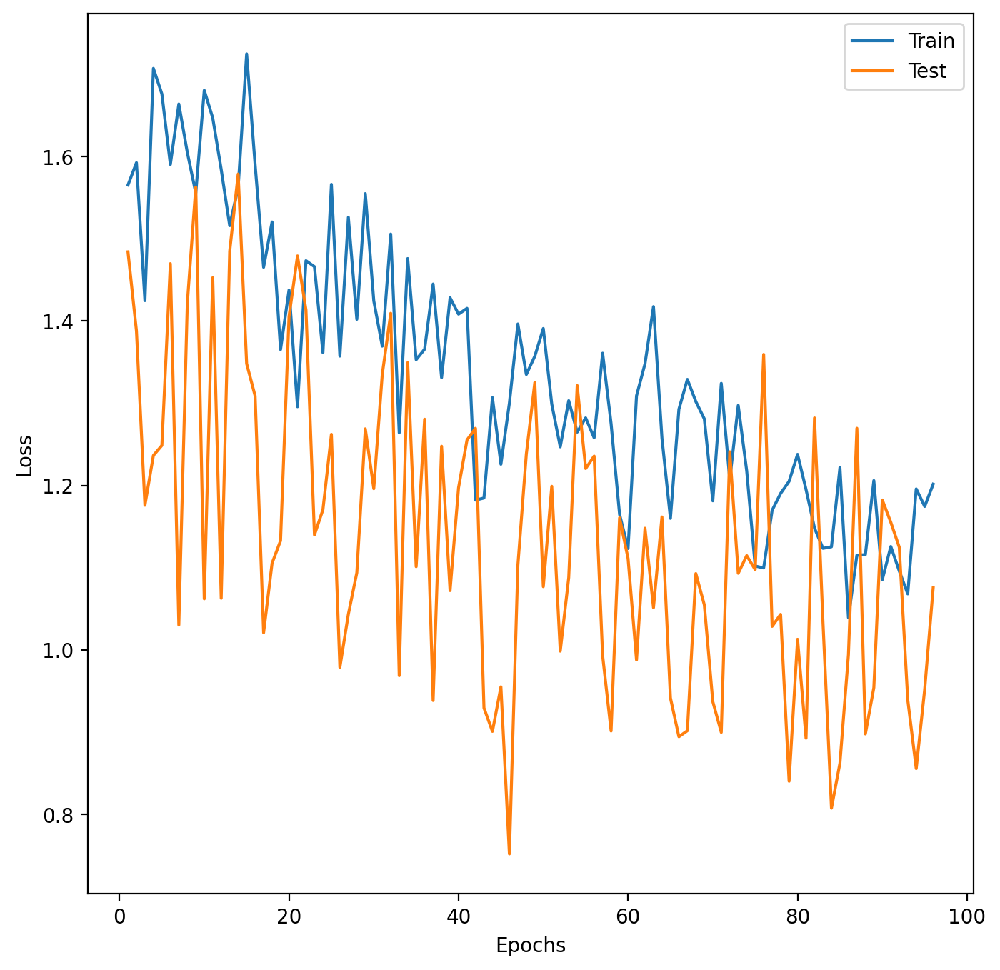

Training with KL weight decay: 1.0 and hidden layer sizes: [64, 16] and learning rate: 1e-05
[001/2000] train_loss: 1.565338, test_loss: 1.484145, time: 0.24 s
[002/2000] train_loss: 1.592506, test_loss: 1.388022, time: 0.13 s
[003/2000] train_loss: 1.424765, test_loss: 1.175904, time: 0.13 s
[004/2000] train_loss: 1.707220, test_loss: 1.236513, time: 0.12 s
[005/2000] train_loss: 1.676204, test_loss: 1.248653, time: 0.10 s
[006/2000] train_loss: 1.590395, test_loss: 1.469770, time: 0.09 s
[007/2000] train_loss: 1.663940, test_loss: 1.030198, time: 0.20 s
[008/2000] train_loss: 1.605027, test_loss: 1.421391, time: 0.11 s
[009/2000] train_loss: 1.555730, test_loss: 1.562917, time: 0.10 s
[010/2000] train_loss: 1.680505, test_loss: 1.062094, time: 0.12 s
[011/2000] train_loss: 1.647002, test_loss: 1.452652, time: 0.13 s
[012/2000] train_loss: 1.584280, test_loss: 1.062756, time: 0.09 s
[013/2000] train_loss: 1.515975, test_loss: 1.484780, time: 0.09 s
[014/2000] train_loss: 1.562553, tes

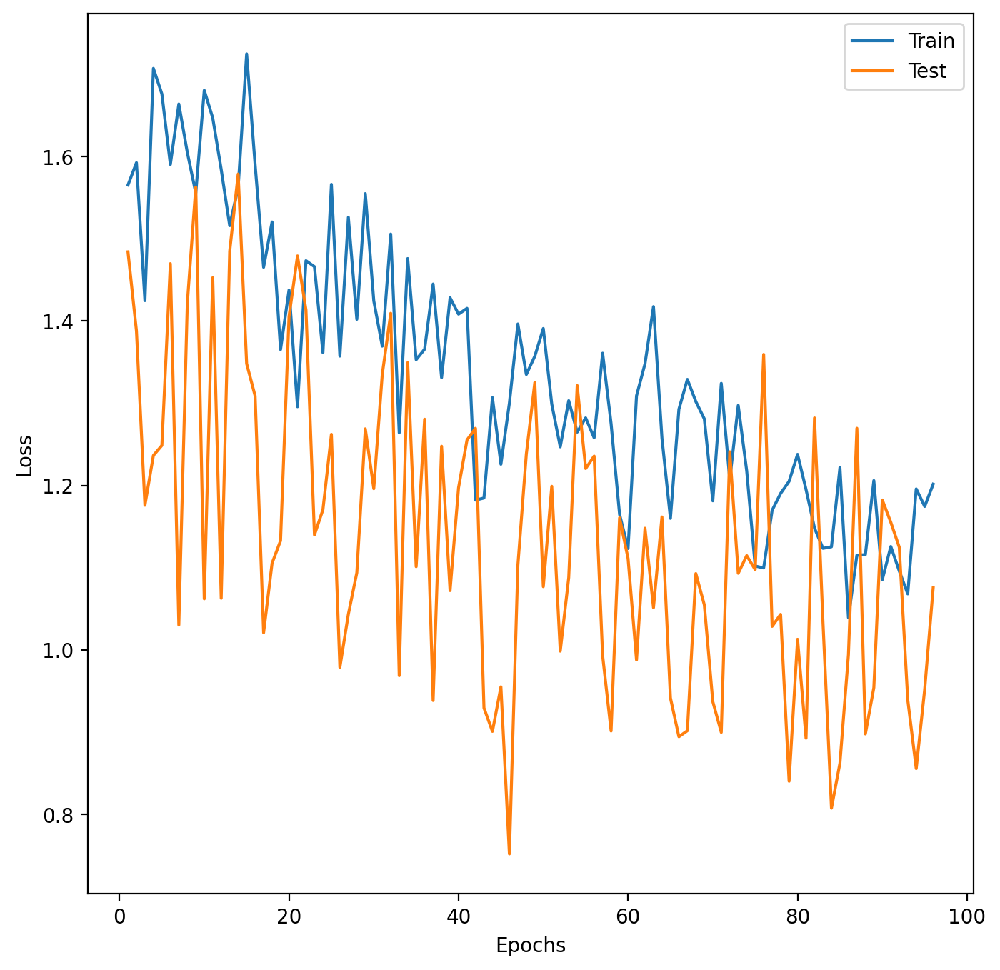

Best kl_weight_decay: 0.0
Best hidden layer size: None
Best learning rate: 1e-05
Test report:
{'Grassy': {'precision': 0.7352941176470589, 'recall': 0.5813953488372093, 'f1-score': 0.6493506493506493, 'support': 86.0}, 'Woody': {'precision': 0.6666666666666666, 'recall': 0.8, 'f1-score': 0.7272727272727272, 'support': 90.0}, 'accuracy': 0.6931818181818182, 'macro avg': {'precision': 0.7009803921568627, 'recall': 0.6906976744186046, 'f1-score': 0.6883116883116882, 'support': 176.0}, 'weighted avg': {'precision': 0.7002005347593584, 'recall': 0.6931818181818182, 'f1-score': 0.6891971664698938, 'support': 176.0}}


In [22]:

train_pred_classes, test_pred_classes, train_pred_mean, train_pred_stddev, test_pred_mean, test_pred_stddev,\
train_report, test_report, best_model_state, best_kl_weight_decay, train_losses_dict, test_losses_dict, sort_mapping, train_prob, test_prob \
    = neuralnetwork(test_data_x_res, train_data_x_res, train_data_y_res_code, test_data_y_res_code, name, \
                    hls_list, lr_list, wd, dr, batch_size, kl_weight_decay_values)

## Confusion Matrices

In [23]:
train_data_res_df = train_data_x_res_df
train_data_res_df['code'] = train_data_y_res_code

In [24]:
train_data_res_df

,clr1,clr2,clr3,clr4,clr5,clr6,code
0,-1.556634,-0.330891,0.049928,0.984478,1.601485,-0.748366,0
1,-0.599286,0.208202,0.720406,1.342197,0.506745,-2.178264,0
2,-0.843636,0.178409,0.927436,1.497981,0.614922,-2.375112,0
3,0.204837,0.545220,0.345018,1.305671,-0.052425,-2.348321,0
4,-0.387803,0.707822,1.393839,1.981416,0.156029,-3.851304,0
...,...,...,...,...,...,...,...
764,-0.312387,-1.968067,0.150042,0.658850,1.301273,0.170290,0
765,-1.340993,-0.051480,0.840305,1.970511,0.715918,-2.134261,0
766,-1.105057,-0.084189,0.223503,0.934608,0.864073,-0.832939,0
767,0.345084,0.510207,0.465432,1.250079,0.335514,-2.906315,0


In [25]:
train_data_res_df['pred'] = train_pred_classes
train_data_res_df['prob'] = train_prob
train_data_res_df
train_data_df_true = train_data_res_df.loc[train_data_res_df.index.isin(train_data_x_df.index)]

In [26]:
train_data_df_true

,clr1,clr2,clr3,clr4,clr5,clr6,code,pred,prob
0,-1.556634,-0.330891,0.049928,0.984478,1.601485,-0.748366,0,0,0.618723
1,-0.599286,0.208202,0.720406,1.342197,0.506745,-2.178264,0,0,0.584994
2,-0.843636,0.178409,0.927436,1.497981,0.614922,-2.375112,0,0,0.580664
3,0.204837,0.545220,0.345018,1.305671,-0.052425,-2.348321,0,0,0.556586
4,-0.387803,0.707822,1.393839,1.981416,0.156029,-3.851304,0,1,0.529456
...,...,...,...,...,...,...,...,...,...
488,-0.727176,1.245467,0.559489,0.535391,-0.539124,-1.074047,1,0,0.571523
489,-3.386140,-5.773154,4.590033,5.418273,3.324691,-4.173704,1,1,0.637222
490,-0.146680,0.820904,3.233240,2.746611,0.276177,-6.930252,1,1,0.635933
491,-0.872679,0.973148,4.055782,2.147746,-1.278144,-5.025853,1,1,0.670799


In [27]:
test_data_res_df = test_data_x_res_df
test_data_res_df['code'] = test_data_y_res_code
test_data_res_df['pred'] = test_pred_classes
test_data_res_df['prob'] = test_prob
test_data_res_df
test_data_df_true = test_data_res_df.loc[test_data_res_df.index.isin(test_data_x_df.index)]

In [28]:
cm_train = confusion_matrix(train_data_res_df['code'], train_data_res_df['pred'])

cm_train_true = confusion_matrix(train_data_df_true['code'], train_data_df_true['pred'])

cm_test = confusion_matrix(test_data_res_df['code'], test_data_res_df['pred'])

cm_test_true = confusion_matrix(test_data_df_true['code'], test_data_df_true['pred'])

class_labels = list(sort_mapping.values())

In [29]:
cmap = plt.get_cmap('Blues')

In [30]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

arr = np.linspace(0, 50, 100).reshape((10, 10))

new_cmap = truncate_colormap(cmap, 0, 0.6)

In [50]:
train_data_res_df

,clr1,clr2,clr3,clr4,clr5,clr6,code,pred,prob,prob_bin
0,-1.556634,-0.330891,0.049928,0.984478,1.601485,-0.748366,0,0,0.618723,0.60-0.65
1,-0.599286,0.208202,0.720406,1.342197,0.506745,-2.178264,0,0,0.584994,0.55-0.60
2,-0.843636,0.178409,0.927436,1.497981,0.614922,-2.375112,0,0,0.580664,0.55-0.60
3,0.204837,0.545220,0.345018,1.305671,-0.052425,-2.348321,0,0,0.556586,0.55-0.60
4,-0.387803,0.707822,1.393839,1.981416,0.156029,-3.851304,0,1,0.529456,0.50-0.55
...,...,...,...,...,...,...,...,...,...,...
764,-0.312387,-1.968067,0.150042,0.658850,1.301273,0.170290,0,0,0.628464,0.60-0.65
765,-1.340993,-0.051480,0.840305,1.970511,0.715918,-2.134261,0,0,0.616943,0.60-0.65
766,-1.105057,-0.084189,0.223503,0.934608,0.864073,-0.832939,0,0,0.639151,0.60-0.65
767,0.345084,0.510207,0.465432,1.250079,0.335514,-2.906315,0,0,0.529718,0.50-0.55


<Figure size 640x480 with 0 Axes>

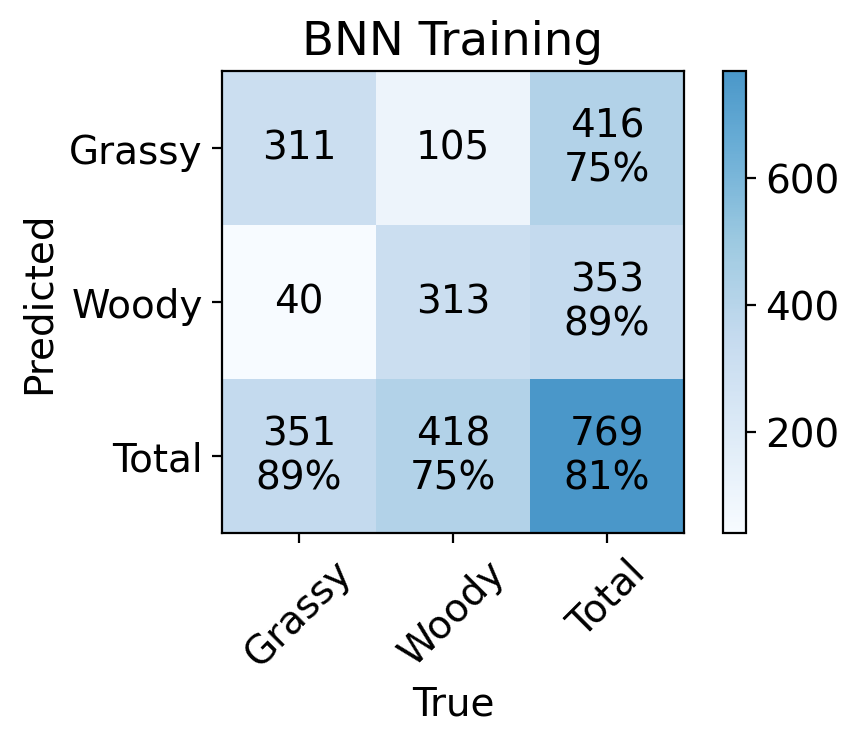

<Figure size 640x480 with 0 Axes>

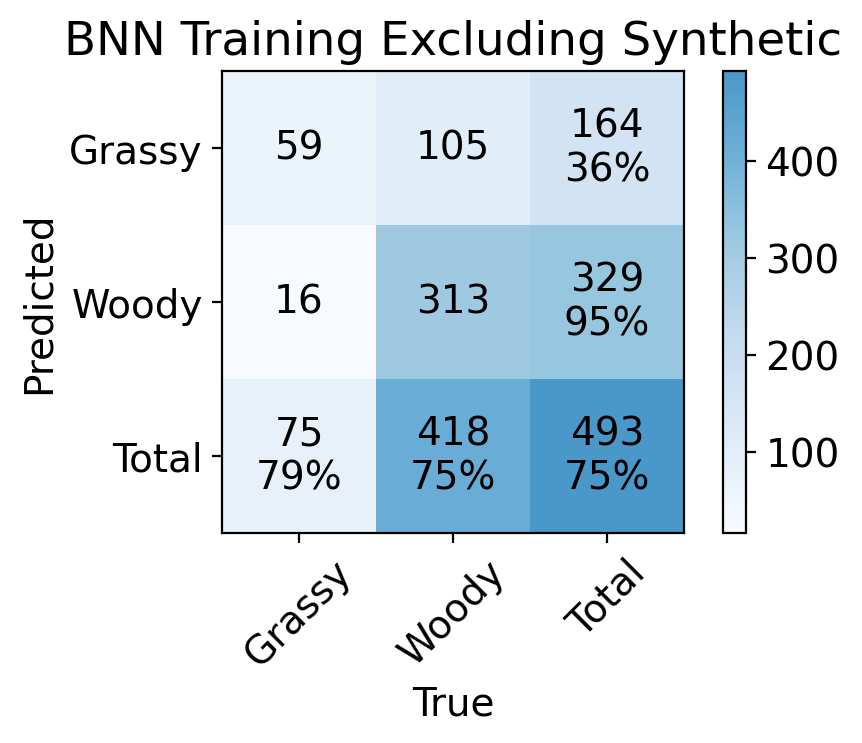

<Figure size 640x480 with 0 Axes>

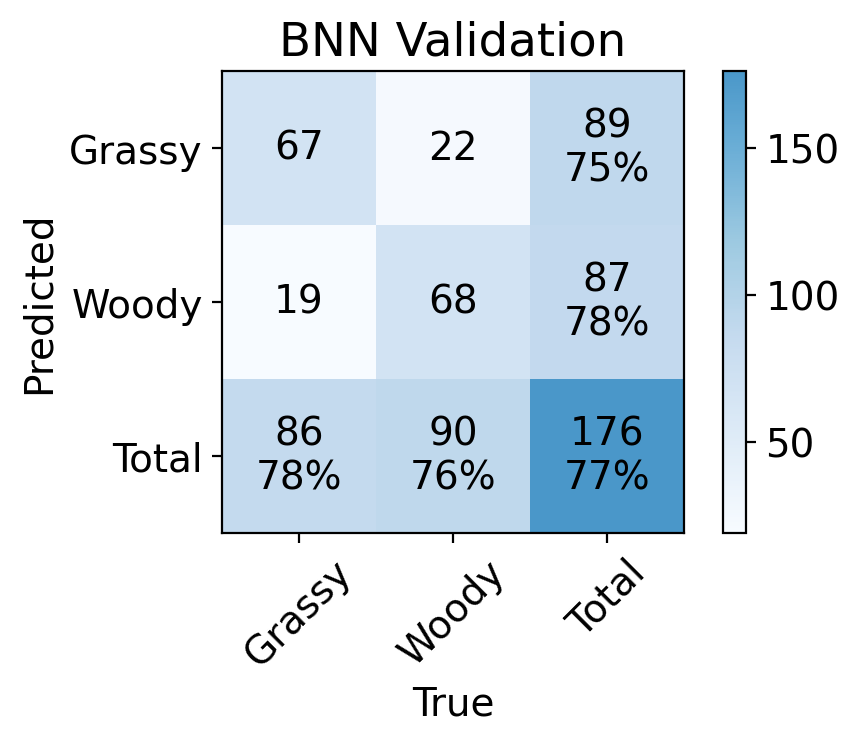

<Figure size 640x480 with 0 Axes>

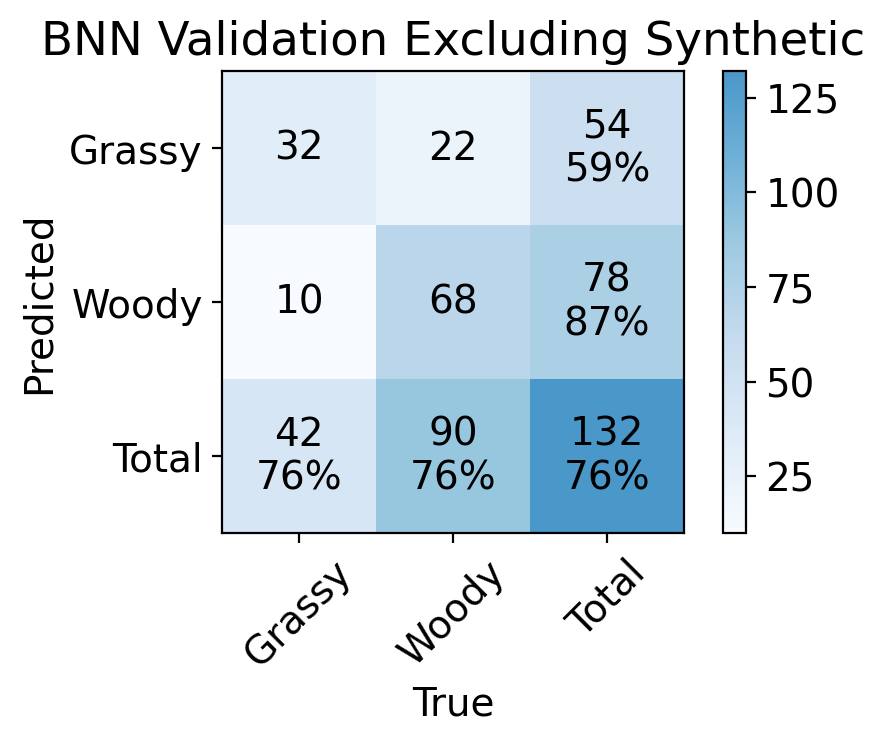

In [51]:
def plot_confusion_matrix(cm, class_labels, title):
    cm = cm.T  # Transpose the confusion matrix to flip the axes

    # Calculate the sum of rows and columns
    cm_with_sums = np.zeros((cm.shape[0] + 1, cm.shape[1] + 1), dtype=cm.dtype)
    cm_with_sums[:cm.shape[0], :cm.shape[1]] = cm
    cm_with_sums[-1, -1] = np.sum(cm)
    cm_with_sums[:-1, -1] = np.sum(cm, axis=1)
    cm_with_sums[-1, :-1] = np.sum(cm, axis=0)

    # Set parameters for font size and figure size
    plt.rcParams.update({'font.size': 14})  # Set the font size

    plt.figure(figsize=(5, 3))
    plt.imshow(cm_with_sums, cmap=new_cmap, interpolation='nearest')
    
 

    class_labels_with_sums = class_labels + ['Total']
    
    plt.xticks(ticks=range(len(class_labels_with_sums)), labels=class_labels_with_sums, rotation=45)
    plt.yticks(ticks=range(len(class_labels_with_sums)), labels=class_labels_with_sums)
    plt.xlabel('True')  # Flipped x and y axis labels
    plt.ylabel('Predicted')  # Flipped x and y axis labels
    plt.title(title)

    for i in range(len(class_labels_with_sums)):
        for j in range(len(class_labels_with_sums)):
            if i == len(class_labels_with_sums) - 1 or j == len(class_labels_with_sums) - 1:  # For sum cells
                cell_value = cm_with_sums[i, j]
                if i == len(class_labels_with_sums) - 1 and j == len(class_labels_with_sums) - 1:  # For the Total cell
                    total_diagonal_sum = np.sum(np.diag(cm))
                    if cell_value != 0:
                        percentage = total_diagonal_sum / cell_value
                        plt.text(j, i, f"{int(cell_value)}\n{percentage:.0%}", ha='center', va='center', color='black')
                    else:
                        plt.text(j, i, str(int(cell_value)), ha='center', va='center', color='black')
                elif i == len(class_labels_with_sums) - 1:  # For cells in the bottom row
                    pred_sum = cm_with_sums[-1, j]
                    diagonal_val = cm_with_sums[j, j]
                    if pred_sum != 0:
                        percentage = diagonal_val / pred_sum
                        plt.text(j, i, f"{int(cell_value)}\n{percentage:.0%}", ha='center', va='center', color='black')
                    else:
                        plt.text(j, i, str(int(cell_value)), ha='center', va='center', color='black')
                else:
                    true_sum = cm_with_sums[i, -1]
                    pred_sum = cm_with_sums[-1, j]
                    diagonal_val = cm_with_sums[i, i]
                    if true_sum != 0:
                        percentage = diagonal_val / true_sum
                        plt.text(j, i, f"{int(cell_value)}\n{percentage:.0%}", ha='center', va='center', color='black')
                    else:
                        plt.text(j, i, str(int(cell_value)), ha='center', va='center', color='black')
            else:
                plt.text(j, i, str(int(cm_with_sums[i, j])), ha='center', va='center', color='black')

    plt.colorbar()

# Rest of your code (accuracy calculations, plotting confusion matrices)
# Plot the first confusion matrix
plt.figure()
plot_confusion_matrix(cm_train, class_labels, 'BNN Training')
plt.show()

# Plot the second confusion matrix
plt.figure()
plot_confusion_matrix(cm_train_true, class_labels, 'BNN Training Excluding Synthetic')
plt.show()

# Plot the third confusion matrix
plt.figure()
plot_confusion_matrix(cm_test, class_labels, 'BNN Validation')
plt.show()

# Plot the third confusion matrix
plt.figure()
plot_confusion_matrix(cm_test_true, class_labels, 'BNN Validation Excluding Synthetic')
plt.show()

## Analyzing Incorrect Data

This visualizes whta the classifier correctly and incorrectly identified. Right now, it only analyzes the real data.

In [52]:
def classify_number(number, bin_width=0.05):
    lower_limit = round(number // bin_width) * bin_width
    upper_limit = lower_limit + bin_width
    return f'{lower_limit:.2f}-{upper_limit:.2f}'

In [53]:
train_data_res_df['prob_bin'] = train_data_res_df['prob'].apply(classify_number)
train_data_res_df

,clr1,clr2,clr3,clr4,clr5,clr6,code,pred,prob,prob_bin
0,-1.556634,-0.330891,0.049928,0.984478,1.601485,-0.748366,0,0,0.618723,0.60-0.65
1,-0.599286,0.208202,0.720406,1.342197,0.506745,-2.178264,0,0,0.584994,0.55-0.60
2,-0.843636,0.178409,0.927436,1.497981,0.614922,-2.375112,0,0,0.580664,0.55-0.60
3,0.204837,0.545220,0.345018,1.305671,-0.052425,-2.348321,0,0,0.556586,0.55-0.60
4,-0.387803,0.707822,1.393839,1.981416,0.156029,-3.851304,0,1,0.529456,0.50-0.55
...,...,...,...,...,...,...,...,...,...,...
764,-0.312387,-1.968067,0.150042,0.658850,1.301273,0.170290,0,0,0.628464,0.60-0.65
765,-1.340993,-0.051480,0.840305,1.970511,0.715918,-2.134261,0,0,0.616943,0.60-0.65
766,-1.105057,-0.084189,0.223503,0.934608,0.864073,-0.832939,0,0,0.639151,0.60-0.65
767,0.345084,0.510207,0.465432,1.250079,0.335514,-2.906315,0,0,0.529718,0.50-0.55


In [54]:
test_data_res_df['prob_bin'] = test_data_res_df['prob'].apply(classify_number)
test_data_res_df

,clr1,clr2,clr3,clr4,clr5,clr6,code,pred,prob,prob_bin
769,-0.226702,0.352898,0.511944,1.138842,0.478963,-2.255946,0,0,0.564647,0.55-0.60
770,0.054648,0.571054,0.863169,1.169079,0.049218,-2.707168,0,0,0.529935,0.50-0.55
771,-0.088884,0.493239,0.751267,1.109501,0.139135,-2.404258,0,0,0.547764,0.50-0.55
772,-6.209529,3.011940,2.825124,3.496412,3.042847,-6.166795,0,1,0.587668,0.55-0.60
773,-5.159552,2.135262,2.219228,3.253152,2.902257,-5.350348,0,1,0.566638,0.55-0.60
...,...,...,...,...,...,...,...,...,...,...
940,-1.014830,-0.808296,-0.166907,1.217938,1.082994,-0.310898,0,0,0.659610,0.65-0.70
941,-1.577296,0.051581,0.944968,2.312541,0.976251,-2.708045,0,0,0.574284,0.55-0.60
942,-1.000960,-0.545139,0.016881,1.357799,0.909765,-0.738345,0,0,0.658981,0.65-0.70
943,-0.712372,-0.485431,-0.030177,0.824862,0.841054,-0.437936,0,0,0.651031,0.65-0.70


In [55]:
train_df = min_df[(min_df.split == 'train')]
test_df = min_df[min_df.split == 'test']

In [56]:
train_df= pd.merge(train_df, train_data_res_df[['code', 'pred', 'prob', 'prob_bin']], how='left', left_index=True, right_index=True)
train_df

test_df= pd.merge(test_df, test_data_res_df[['code', 'pred', 'prob', 'prob_bin']], how='left', left_index=True, right_index=True)
test_df

,index,source,ID,species,loc_sure,lon,lat,altitude,family,subfam,...,clr3,clr4,clr5,clr6,split,sample_uid,code,pred,prob,prob_bin
769,493,This Study,KU820,Aristida sp. (?),Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,0.511944,1.138842,0.478963,-2.255946,test,769,0,0,0.564647,0.55-0.60
770,494,This Study,KU831,Aristida adscensionis (?),Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,0.863169,1.169079,0.049218,-2.707168,test,770,0,0,0.529935,0.50-0.55
771,495,This Study,KU834,Aristida sp .2,Y,7.951042,16.990325,NaN,Poaceae,Aristidoideae,...,0.751267,1.109501,0.139135,-2.404258,test,771,0,0,0.547764,0.50-0.55
772,496,Griepentrog et al. (2019),NaN,Enteropogon macrostachyus,Y,37.683000,-3.306000,NaN,Poaceae,Chloridoideae,...,2.825124,3.496412,3.042847,-6.166795,test,772,0,1,0.587668,0.55-0.60
773,497,Griepentrog et al. (2019),NaN,Enteropogon macrostachyus,Y,37.683000,-3.306000,NaN,Poaceae,Chloridoideae,...,2.219228,3.253152,2.902257,-5.350348,test,773,0,1,0.566638,0.55-0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
896,620,Vogts et al. (2009),NaN,Sclerocarya birrea subsp. Caffra,Y,13.767000,-18.483000,NaN,Anacardiaceae,NaN,...,1.724406,1.476261,0.089966,-2.333571,test,896,1,0,0.521200,0.50-0.55
897,621,Vogts et al. (2009),NaN,Tamarix usneoides,Y,14.950000,-22.700000,NaN,Tamaricaceae,NaN,...,2.504626,3.485973,0.485565,-7.522517,test,897,1,1,0.642151,0.60-0.65
898,622,Vogts et al. (2009),NaN,Berlinia confuse,Y,13.000000,-0.670000,NaN,Fabaceae,NaN,...,3.716469,1.471042,-1.419329,-3.028767,test,898,1,1,0.647884,0.60-0.65
899,623,Vogts et al. (2009),NaN,Cynometra mannii,Y,10.370000,-2.953300,NaN,Fabaceae,NaN,...,4.383554,1.920575,-0.760446,-7.766158,test,899,1,1,0.652037,0.65-0.70


In [ ]:
def separate_correct_incorrect(train_df, train_pred, train_actual, test_df, test_pred, test_actual):
    incorrect_train_mask = train_pred != train_actual
    incorrect_test_mask = test_pred != test_actual
    
    incorrect_train = train_df[incorrect_train_mask]
    incorrect_test = test_df[incorrect_test_mask]
    
    incorrect = pd.concat([incorrect_train, incorrect_test])
    incorrect['Predicted'] = 'Incorrect'
    
    # Create a mask for correctly predicted rows
    correct_train_mask = train_pred == train_actual
    correct_test_mask = test_pred == test_actual
    
    correct_train = train_df[correct_train_mask]
    correct_test = test_df[correct_test_mask]
    
    correct = pd.concat([correct_train, correct_test])
    correct['Predicted'] = 'Correct'
    
    return incorrect, correct

In [58]:
incorrect, correct = separate_correct_incorrect(train_df, train_data_df_true['pred'], train_data_df_true['code'], test_df, test_data_df_true['pred'], test_data_df_true['code'])#, min_df)

Looks at predictions which were confident in each category – confident is defined as having a greater than or equal to 70% confidence (arbitrary).

In [59]:
incorrect_confident = incorrect[incorrect.prob >= 0.70]
correct_confident = correct[correct.prob >= 0.70]

In [60]:
incorrect_confident

,index,source,ID,species,loc_sure,lon,lat,altitude,family,subfam,...,clr4,clr5,clr6,split,sample_uid,code,pred,prob,prob_bin,Predicted


In [61]:
from sklearn.metrics import confusion_matrix
import pandas as pd

true_test = pd.concat([
    incorrect_confident.loc[incorrect_confident["split"] == "test", "code"],
    correct_confident.loc[correct_confident["split"] == "test", "code"]
])

pred_test = pd.concat([
    incorrect_confident.loc[incorrect_confident["split"] == "test", "pred"],
    correct_confident.loc[correct_confident["split"] == "test", "pred"]
])

cm_high_prob = confusion_matrix(
    true_test,
    pred_test
)

In [62]:
print(cm_high_prob.shape)
print(class_labels)
print(len(class_labels))

(1, 1)
['Grassy', 'Woody']
2


IndexError: index 2 is out of bounds for axis 1 with size 2

<Figure size 640x480 with 0 Axes>

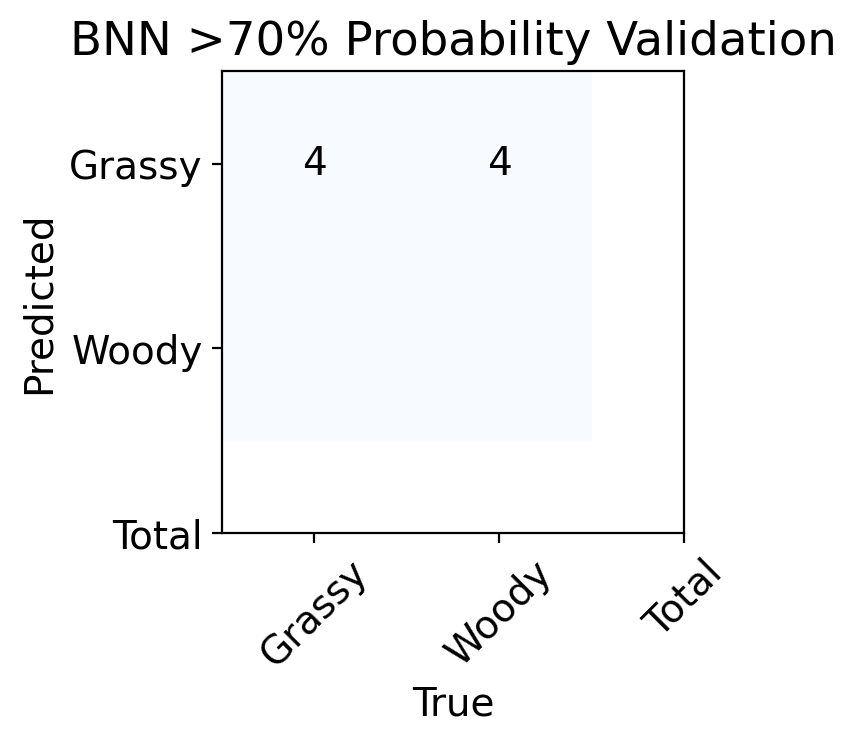

In [63]:
plt.figure()
plot_confusion_matrix(cm_high_prob, class_labels, 'BNN >70% Probability Validation')
plt.show()

In [ ]:
def plot_confusion_matrix_ax(ax, cm, class_labels, title, show_ylabel=True):
    cm = cm.T

    # Add sums
    cm_with_sums = np.zeros((cm.shape[0] + 1, cm.shape[1] + 1), dtype=cm.dtype)
    cm_with_sums[:cm.shape[0], :cm.shape[1]] = cm
    cm_with_sums[-1, -1] = np.sum(cm)
    cm_with_sums[:-1, -1] = np.sum(cm, axis=1)
    cm_with_sums[-1, :-1] = np.sum(cm, axis=0)

    class_labels_with_sums = class_labels + ['Total']

    im = ax.imshow(cm_with_sums, cmap=new_cmap, interpolation='nearest')

    ax.set_title(title)
    ax.set_xticks(range(len(class_labels_with_sums)))
    ax.set_xticklabels(class_labels_with_sums, rotation=45)

    # Y-axis ticks + labels
    ax.set_yticks(range(len(class_labels_with_sums)))

    if show_ylabel:
        ax.set_yticklabels(class_labels_with_sums)
        ax.set_ylabel('Predicted')
    else:
        ax.set_yticklabels([])
        ax.tick_params(axis='y', left=False)  # remove ticks completely

        ax.set_xlabel('True')

    # Add text
    for i in range(len(class_labels_with_sums)):
        for j in range(len(class_labels_with_sums)):
            if i == len(class_labels_with_sums) - 1 or j == len(class_labels_with_sums) - 1:
                cell_value = cm_with_sums[i, j]

                if i == len(class_labels_with_sums) - 1 and j == len(class_labels_with_sums) - 1:
                    total_diagonal_sum = np.sum(np.diag(cm))
                    if cell_value != 0:
                        percentage = total_diagonal_sum / cell_value
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                elif i == len(class_labels_with_sums) - 1:
                    pred_sum = cm_with_sums[-1, j]
                    diagonal_val = cm_with_sums[j, j]
                    if pred_sum != 0:
                        percentage = diagonal_val / pred_sum
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                else:
                    true_sum = cm_with_sums[i, -1]
                    diagonal_val = cm_with_sums[i, i]
                    if true_sum != 0:
                        percentage = diagonal_val / true_sum
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                ax.text(j, i, text, ha='center', va='center', color='black')

            else:
                ax.text(j, i, str(int(cm_with_sums[i, j])), ha='center', va='center', color='black')

In [ ]:
def plot_two_confusion_matrices(cm1, cm2, class_labels, title1, title2):
    plt.rcParams.update({'font.size': 14})

    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    fig.subplots_adjust(wspace=-1)

    plot_confusion_matrix_ax(axes[0], cm1, class_labels, title1, show_ylabel=True)
    plot_confusion_matrix_ax(axes[1], cm2, class_labels, title2, show_ylabel=False)

    plt.tight_layout()
    plt.show()

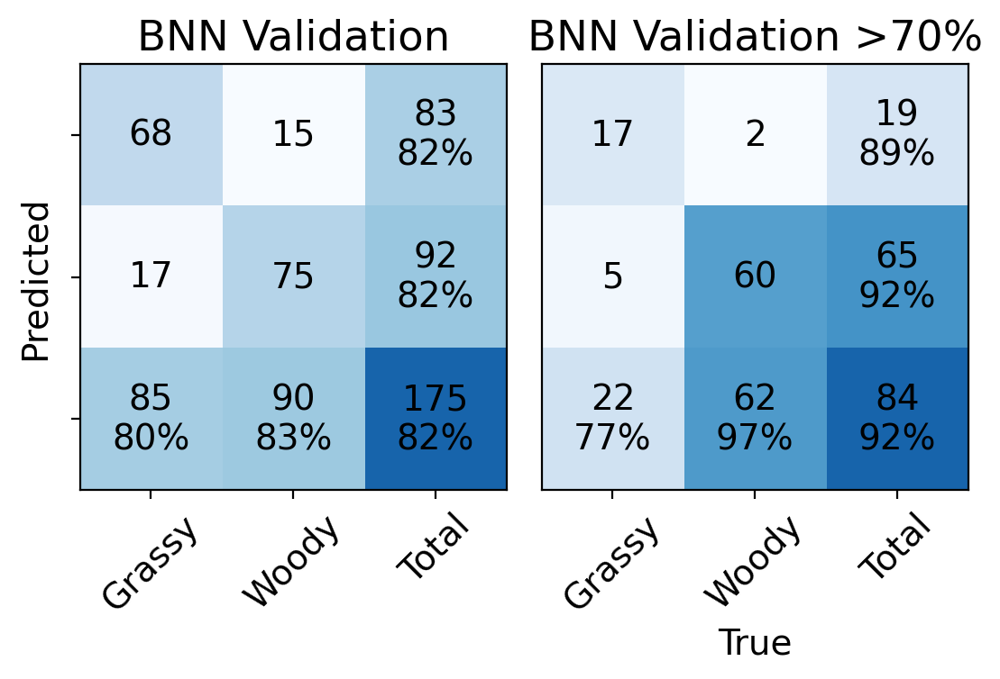

In [ ]:
plot_two_confusion_matrices(
    cm_test,
    cm_high_prob,
    class_labels,
    'BNN Validation',
    'BNN Validation >70%'
)

In [ ]:
def plot_confusion_matrix_ax(ax, cm, class_labels, title, show_ylabel=True):
    cm = cm.T

    cm_with_sums = np.zeros((cm.shape[0] + 1, cm.shape[1] + 1), dtype=cm.dtype)
    cm_with_sums[:cm.shape[0], :cm.shape[1]] = cm
    cm_with_sums[-1, -1] = np.sum(cm)
    cm_with_sums[:-1, -1] = np.sum(cm, axis=1)
    cm_with_sums[-1, :-1] = np.sum(cm, axis=0)

    class_labels_with_sums = class_labels + ['Total']

    ax.imshow(cm_with_sums, cmap=new_cmap, interpolation='nearest')
    ax.set_title(title)

    ax.set_xticks(range(len(class_labels_with_sums)))
    ax.set_xticklabels(class_labels_with_sums, rotation=45)
    ax.set_xlabel('True')

    ax.set_yticks(range(len(class_labels_with_sums)))

    if show_ylabel:
        ax.set_yticklabels(class_labels_with_sums)
        ax.tick_params(axis='y', left=True, labelleft=True)
        ax.set_ylabel('Predicted')
    else:
        ax.tick_params(axis='y', left=False, labelleft=False)

    for i in range(len(class_labels_with_sums)):
        for j in range(len(class_labels_with_sums)):
            if i == len(class_labels_with_sums) - 1 or j == len(class_labels_with_sums) - 1:
                cell_value = cm_with_sums[i, j]

                if i == len(class_labels_with_sums) - 1 and j == len(class_labels_with_sums) - 1:
                    total_diagonal_sum = np.sum(np.diag(cm))
                    if cell_value != 0:
                        percentage = total_diagonal_sum / cell_value
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                elif i == len(class_labels_with_sums) - 1:
                    pred_sum = cm_with_sums[-1, j]
                    diagonal_val = cm_with_sums[j, j]
                    if pred_sum != 0:
                        percentage = diagonal_val / pred_sum
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                else:
                    true_sum = cm_with_sums[i, -1]
                    diagonal_val = cm_with_sums[i, i]
                    if true_sum != 0:
                        percentage = diagonal_val / true_sum
                        text = f"{int(cell_value)}\n{percentage:.0%}"
                    else:
                        text = f"{int(cell_value)}"

                ax.text(j, i, text, ha='center', va='center', color='black')
            else:
                ax.text(j, i, str(int(cm_with_sums[i, j])), ha='center', va='center', color='black')


def plot_two_confusion_matrices(cm1, cm2, class_labels, title1, title2):
    plt.rcParams.update({'font.size': 14})

    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    fig.subplots_adjust(wspace=-1)

    plot_confusion_matrix_ax(axes[0], cm1, class_labels, title1, show_ylabel=True)
    plot_confusion_matrix_ax(axes[1], cm2, class_labels, title2, show_ylabel=False)

    plt.tight_layout()
    plt.show()

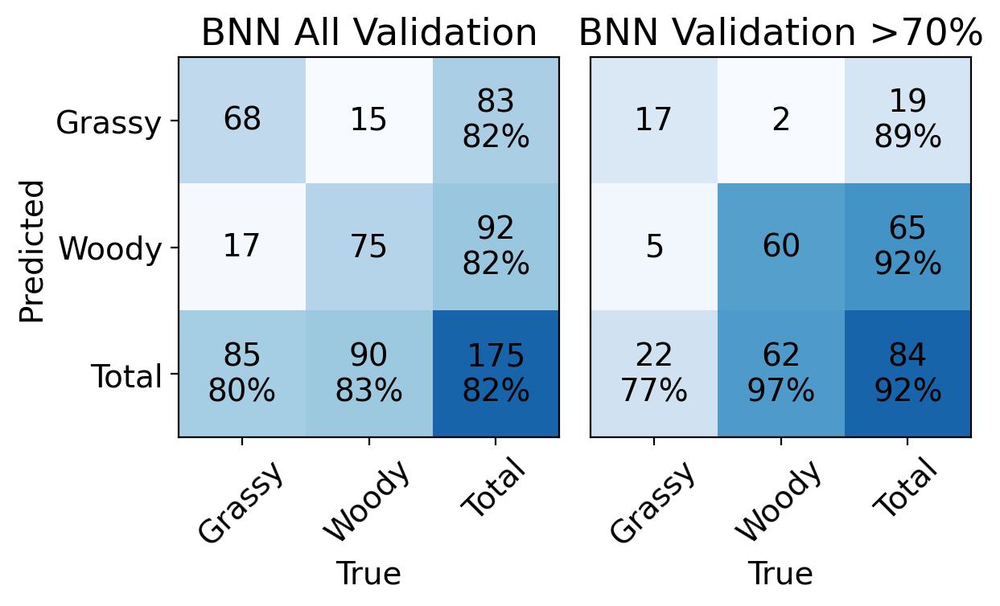

In [ ]:
plot_two_confusion_matrices(
    cm_test,
    cm_high_prob,
    class_labels,
    'BNN All Validation',
    'BNN Validation >70%'
)

In [ ]:
def correct_incorrect_box_plots(model_type, correct, incorrect):

    # Variables to plot
    variables = alkanes

    # Create a figure with four subplots (Grassy Correct, Grassy Incorrect, Woody Correct, Woody Incorrect)
    fig, axes = plt.subplots(2, 2, figsize=(12, 12), sharey=True, sharex=True)
    fig.suptitle(model_type, fontsize=30)

    # Plot box and whisker plots for Grassy Correct dataset
    grassy_correct_data = correct[correct['wg'] == 'Grassy'][variables]
    sns.boxplot(data=grassy_correct_data, ax=axes[0, 0], color='orange',)
    axes[0, 0].set_title(f'Grassy Correct, n={len(grassy_correct_data)}')
    axes[0, 0].set_ylabel('Values')
    #ax.set_title(f'{title} (n={n})')

    # Plot box and whisker plots for Grassy Incorrect dataset
    grassy_incorrect_data = incorrect[incorrect['wg'] == 'Grassy'][variables]
    sns.boxplot(data=grassy_incorrect_data, ax=axes[0, 1], color='red')
    axes[0, 1].set_title(f'Grassy Incorrect, n={len(grassy_incorrect_data)}')

    # Plot box and whisker plots for Woody Correct dataset
    woody_correct_data = correct[correct['wg'] == 'Woody'][variables]
    sns.boxplot(data=woody_correct_data, ax=axes[1, 0], color='lightgreen')
    axes[1, 0].set_title(f'Woody Correct, n={len(woody_correct_data)}')
    axes[1, 0].set_ylabel('Values')
    axes[1, 0].set_xlabel('Variables')

    # Plot box and whisker plots for Woody Incorrect dataset
    woody_incorrect_data = incorrect[incorrect['wg'] == 'Woody'][variables]
    sns.boxplot(data=woody_incorrect_data, ax=axes[1, 1], color='darkgreen')
    axes[1, 1].set_title(f'Woody Incorrect, n={len(woody_incorrect_data)}')
    axes[1, 1].set_xlabel('Variables')

    # Adjust spacing between the plots
    plt.tight_layout()

    # Show the plots
    plt.show()

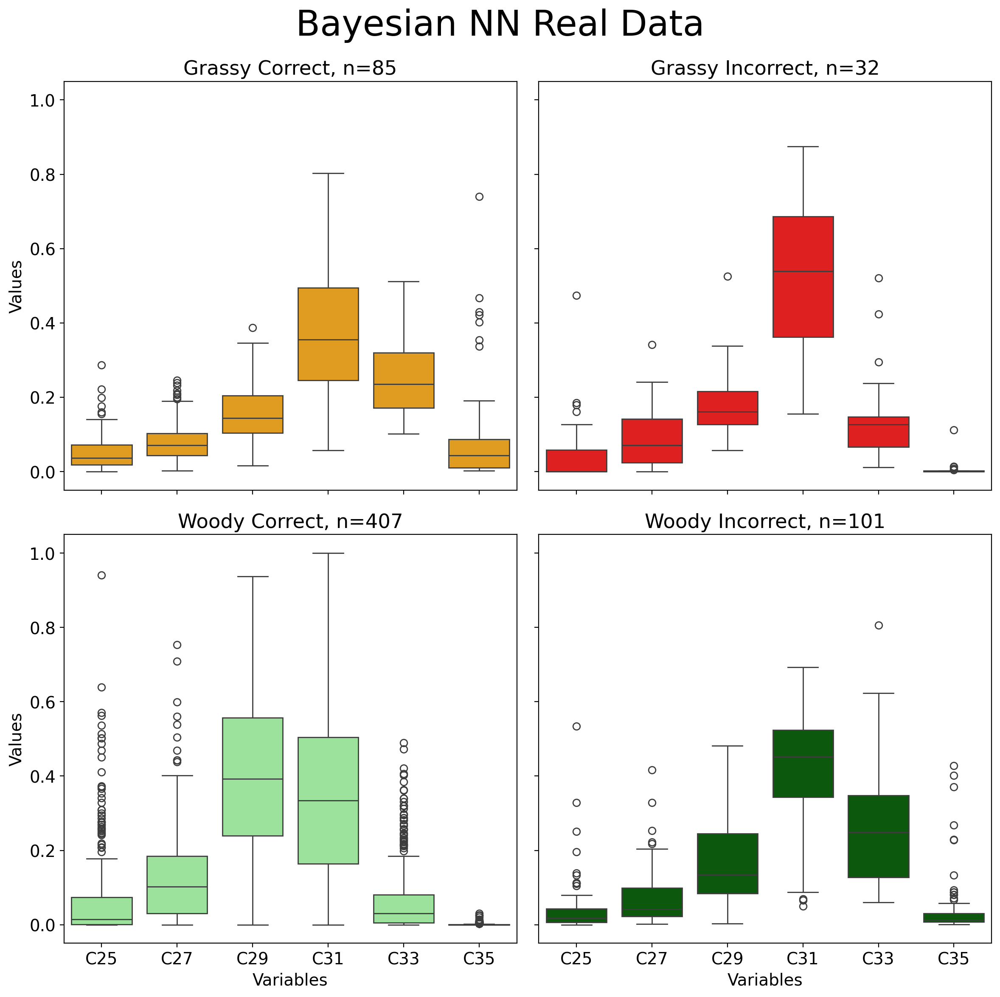

In [ ]:
correct_incorrect_box_plots("Bayesian NN Real Data", correct, incorrect)

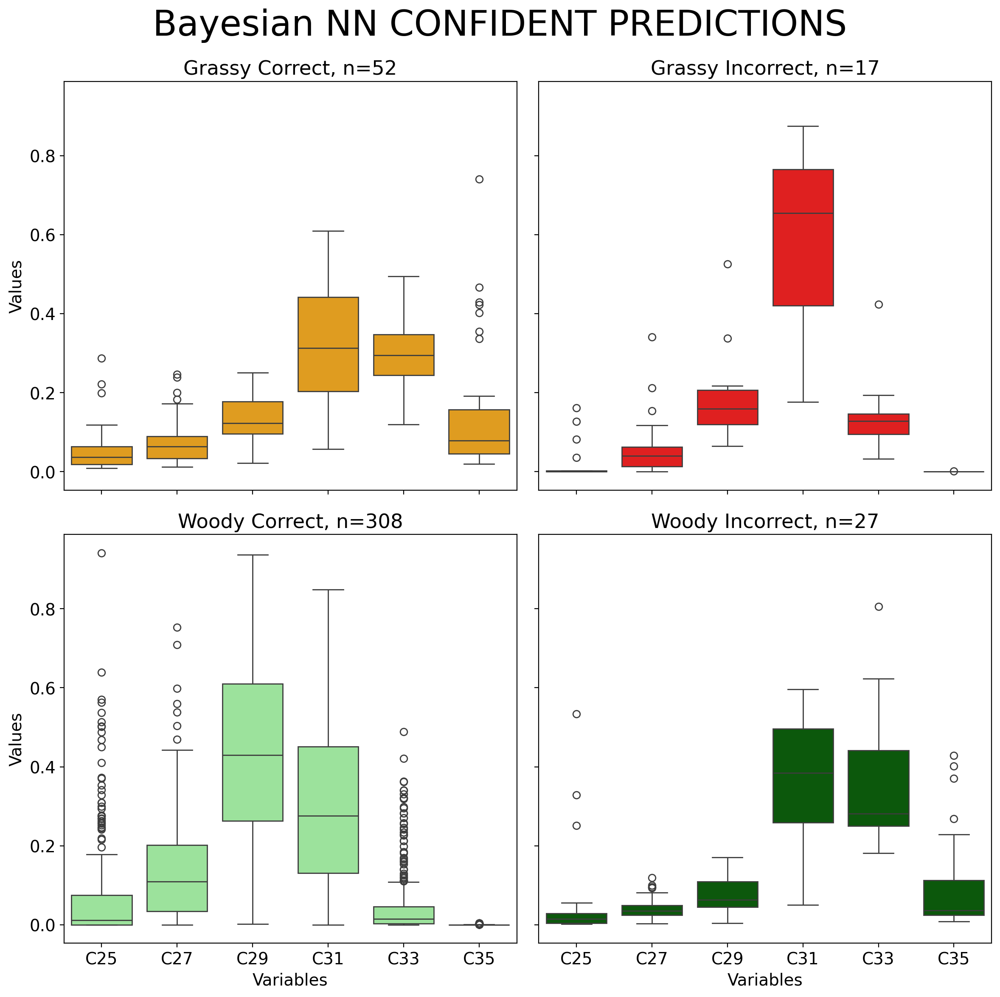

In [ ]:
correct_incorrect_box_plots("Bayesian NN CONFIDENT PREDICTIONS", correct_confident, incorrect_confident)